In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import pandas as pd
from pandas_profiling import ProfileReport
from sklearn import preprocessing
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings('ignore')
pd.pandas.set_option('display.max_columns',None)

# importing dataset

In [2]:
dataset=pd.read_csv('heartdataiii.csv')

In [3]:
dataset.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,52,1,0,125,212,0,1,168,0,1.0,2,2,3,0
1,53,1,0,140,203,1,0,155,1,3.1,0,0,3,0
2,70,1,0,145,174,0,1,125,1,2.6,0,0,3,0
3,61,1,0,148,203,0,1,161,0,0.0,2,1,3,0
4,62,0,0,138,294,1,1,106,0,1.9,1,3,2,0


In [4]:
print(dataset.shape)

(1025, 14)


In [5]:
report = ProfileReport(dataset,title='Pandas profiling Report', explorative= True)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
dataset.columns

Index(['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach',
       'exang', 'oldpeak', 'slope', 'ca', 'thal', 'target'],
      dtype='object')

In [6]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1025 entries, 0 to 1024
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1025 non-null   int64  
 1   sex       1025 non-null   int64  
 2   cp        1025 non-null   int64  
 3   trestbps  1025 non-null   int64  
 4   chol      1025 non-null   int64  
 5   fbs       1025 non-null   int64  
 6   restecg   1025 non-null   int64  
 7   thalach   1025 non-null   int64  
 8   exang     1025 non-null   int64  
 9   oldpeak   1025 non-null   float64
 10  slope     1025 non-null   int64  
 11  ca        1025 non-null   int64  
 12  thal      1025 non-null   int64  
 13  target    1025 non-null   int64  
dtypes: float64(1), int64(13)
memory usage: 112.2 KB


In [7]:
dataset.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
count,1025.000000,1025.000000,1025.000000,1025.000000,1025.00000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000,1025.000000
mean,54.434146,0.695610,0.942439,131.611707,246.00000,0.149268,0.529756,149.114146,0.336585,1.071512,1.385366,0.754146,2.323902,0.513171
std,9.072290,0.460373,1.029641,17.516718,51.59251,0.356527,0.527878,23.005724,0.472772,1.175053,0.617755,1.030798,0.620660,0.500070
min,29.000000,0.000000,0.000000,94.000000,126.00000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,48.000000,0.000000,0.000000,120.000000,211.00000,0.000000,0.000000,132.000000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,56.000000,1.000000,1.000000,130.000000,240.00000,0.000000,1.000000,152.000000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,275.00000,0.000000,1.000000,166.000000,1.000000,1.800000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,564.00000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


# Exploratory data analysis 

In [8]:
dataset['target'].value_counts()

1    526
0    499
Name: target, dtype: int64

In [9]:
# Percentage of patients have and do not have heart disease
dataset['target'].value_counts()/dataset.shape[0]*100

1    51.317073
0    48.682927
Name: target, dtype: float64

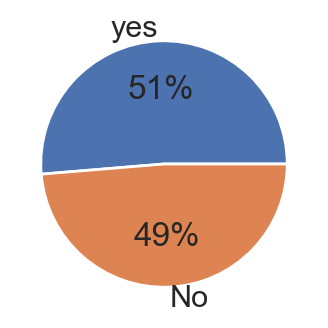

In [10]:
# Create a plot to display the percentage of the positive and negative heart disease 
labels = ['yes', 'No']
values = dataset['target'].value_counts().values
sns.set_theme(context='poster')
plt.figure(figsize=(4,4))
#plt.title('Heart Diseases', color="Black",fontsize=18)

plt.pie(values, labels=labels, autopct='%1.0f%%')
#plt.title('People who got Heart Disease')
plt.show()

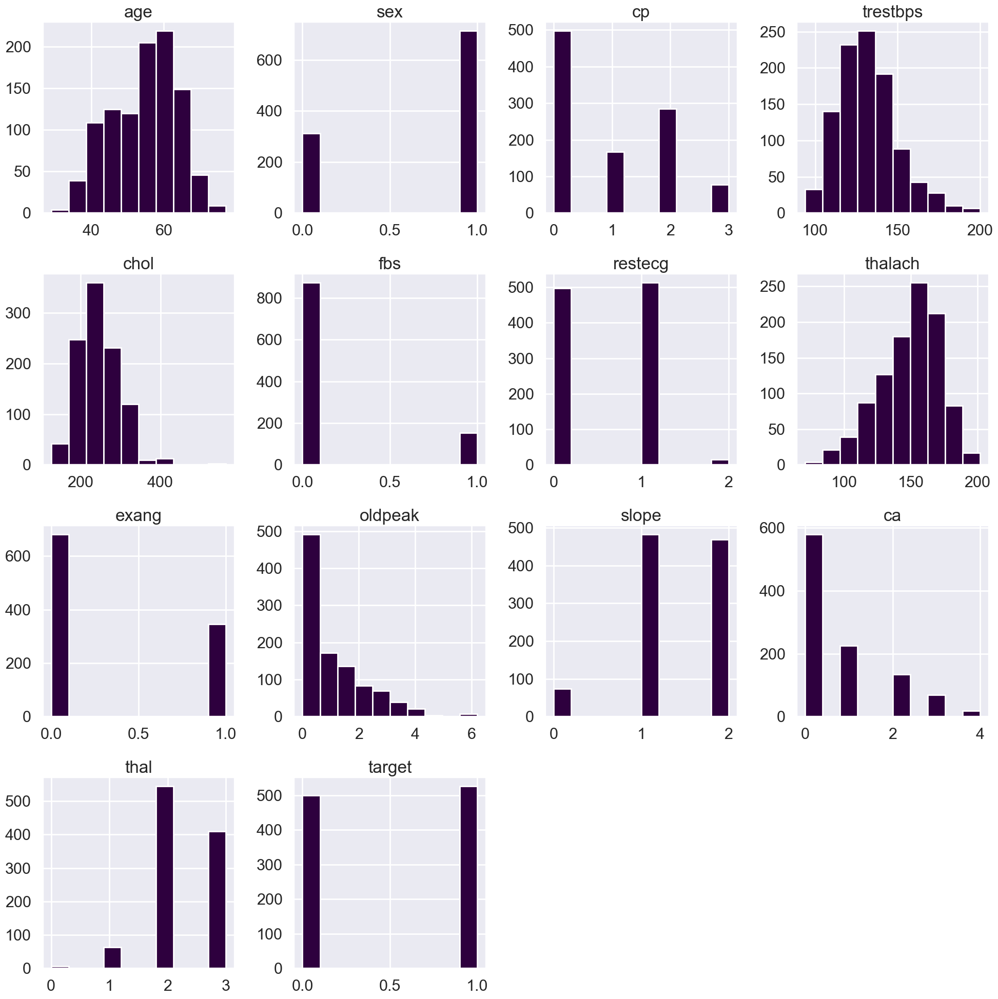

In [11]:
dataset.hist(figsize = (20,20),color='#2e003e')
plt.tight_layout()
plt.show()

In [12]:
numerical_with_nan=[feature for feature in dataset.columns if dataset[feature].isnull().sum()>1 and dataset[feature].dtypes!='O']

## We will print the numerical nan variables and percentage of missing values

for feature in numerical_with_nan:
    print("{}: {}% missing value".format(feature,np.around(dataset[feature].isnull().mean(),4)))

In [13]:
# count the number of NaN values in each column
print(dataset.isnull().sum())

age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalach     0
exang       0
oldpeak     0
slope       0
ca          0
thal        0
target      0
dtype: int64


thus there is no null value 

In [14]:
# list of numerical variables
numerical_features = [feature for feature in dataset.columns if dataset[feature].dtypes != 'O']

print('Number of numerical variables: ', len(numerical_features))

# visualise the numerical variables
dataset[numerical_features].head()

Number of numerical variables:  14


,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,52,1,0,125,212,0,1,168,0,1.0,2,2,3,0
1,53,1,0,140,203,1,0,155,1,3.1,0,0,3,0
2,70,1,0,145,174,0,1,125,1,2.6,0,0,3,0
3,61,1,0,148,203,0,1,161,0,0.0,2,1,3,0
4,62,0,0,138,294,1,1,106,0,1.9,1,3,2,0


In [15]:
discrete_feature=[feature for feature in numerical_features if len(dataset[feature].unique())<25]
print("Discrete Variables Count: {}".format(len(discrete_feature)))

Discrete Variables Count: 9


In [16]:
discrete_feature

['sex', 'cp', 'fbs', 'restecg', 'exang', 'slope', 'ca', 'thal', 'target']

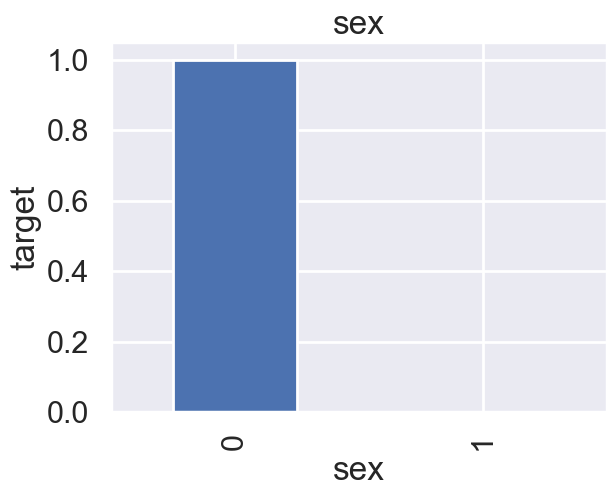

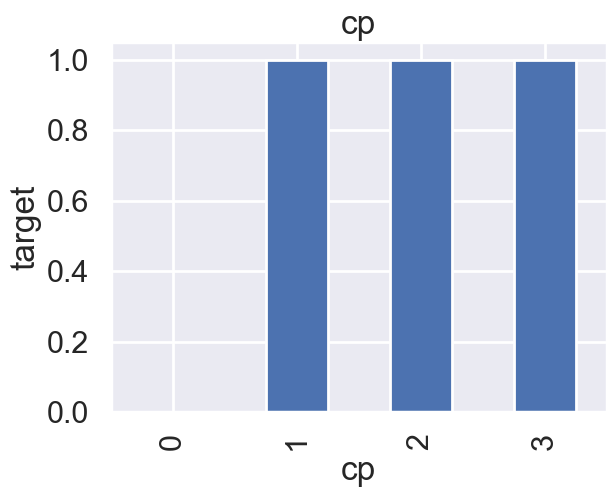

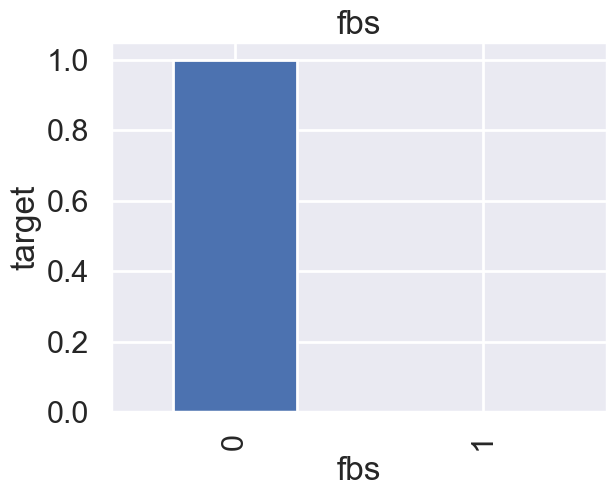

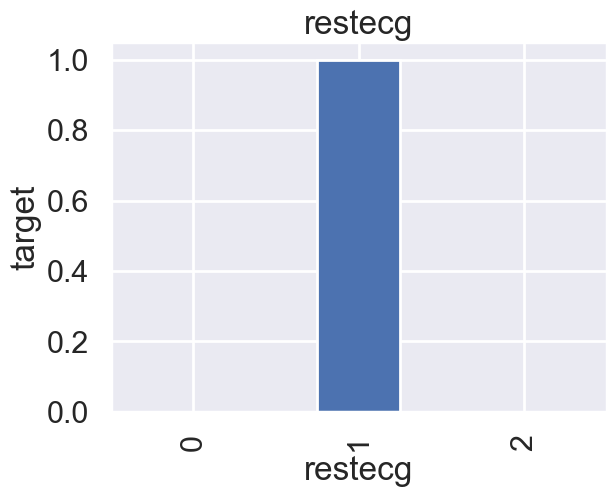

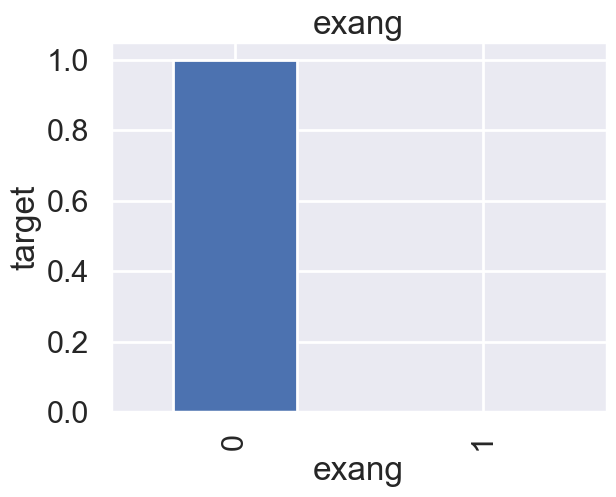

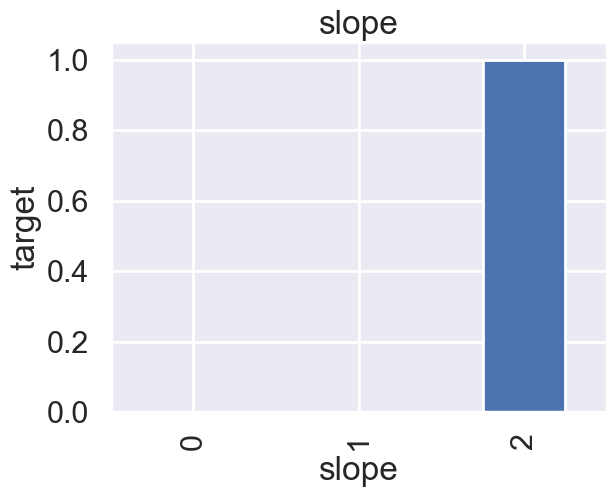

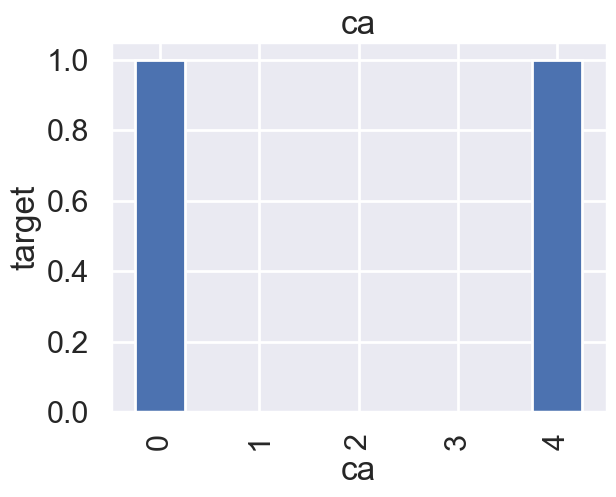

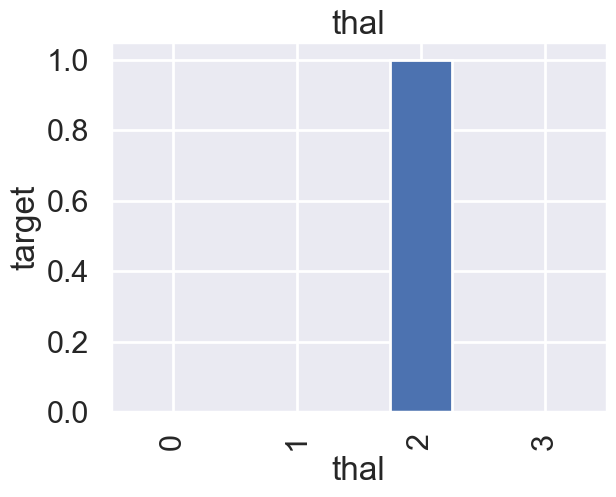

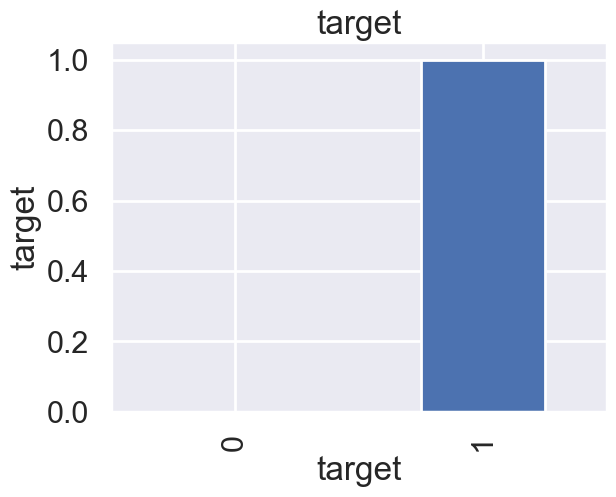

In [17]:
for feature in discrete_feature:
    data=dataset.copy()
    data.groupby(feature)['target'].median().plot.bar()
    plt.xlabel(feature)
    plt.ylabel('target')
    plt.title(feature)
    plt.show()

<AxesSubplot:>

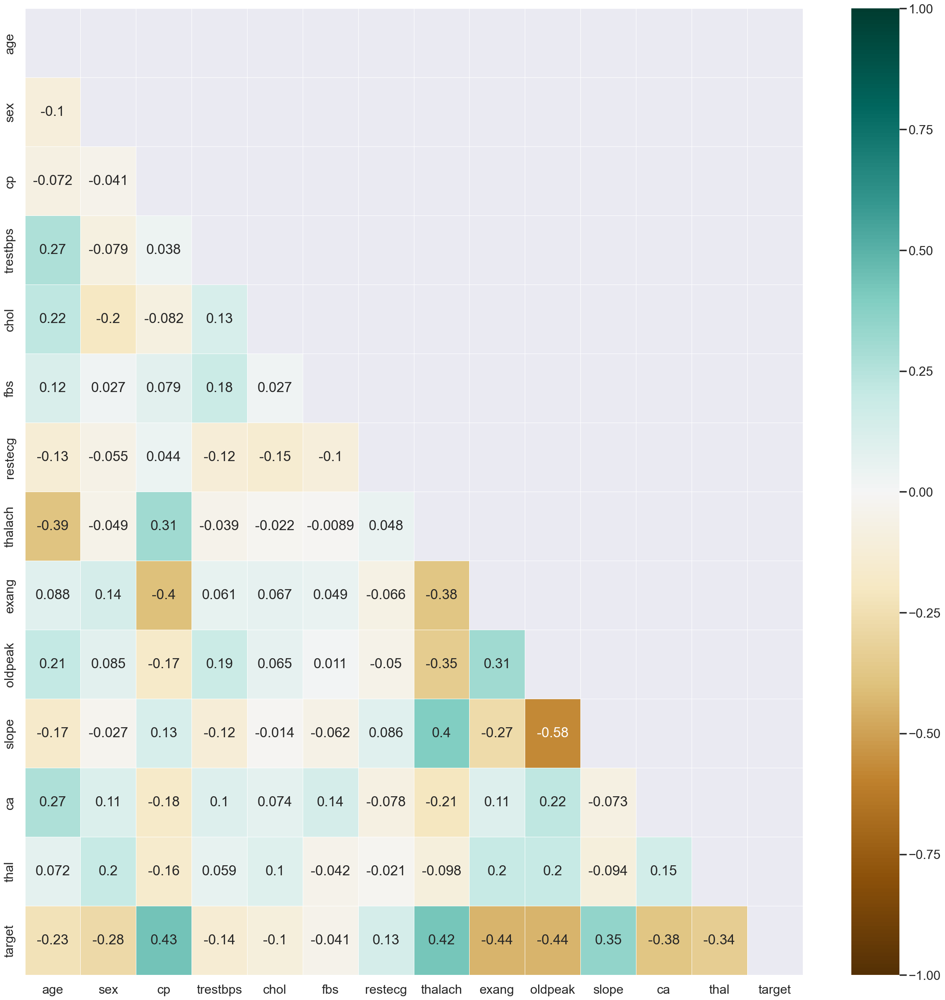

In [18]:
corr = dataset.corr()
plt.figure(figsize=(30,30))
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(corr,mask=mask,cmap='BrBG', vmin=-1, vmax= 1 , center=0, annot=True,linewidth=.5,square=False)

<AxesSubplot:>

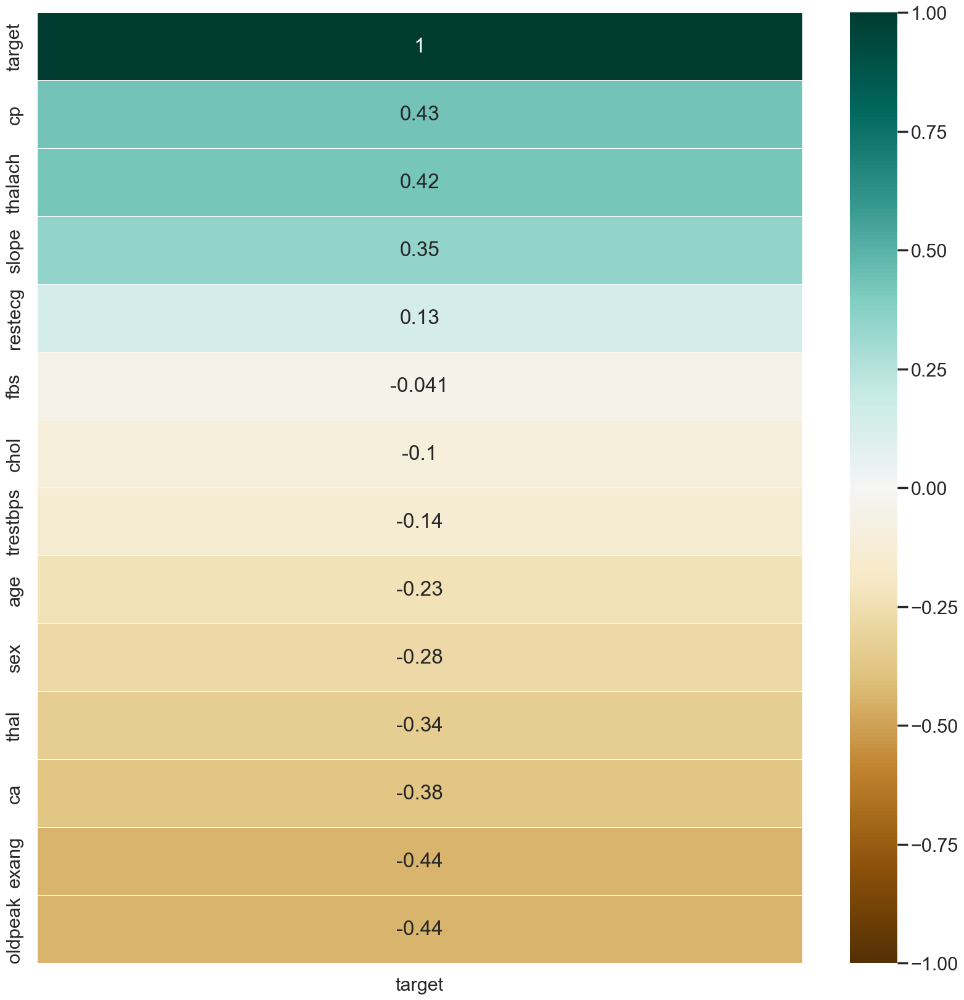

In [19]:
#Correlation between all features with heart disease.
plt.figure(figsize=(20,20))

sns.heatmap(dataset.corr()[['target']].sort_values(by='target', ascending=False),cmap='BrBG', vmin=-1, vmax= 1 , center=0, annot=True,linewidth=.5,square=False)

In [20]:
continuous_feature=[feature for feature in numerical_features if feature not in discrete_feature]
print("Continuous feature Count {}".format(len(continuous_feature)))
continuous_feature

Continuous feature Count 5


['age', 'trestbps', 'chol', 'thalach', 'oldpeak']

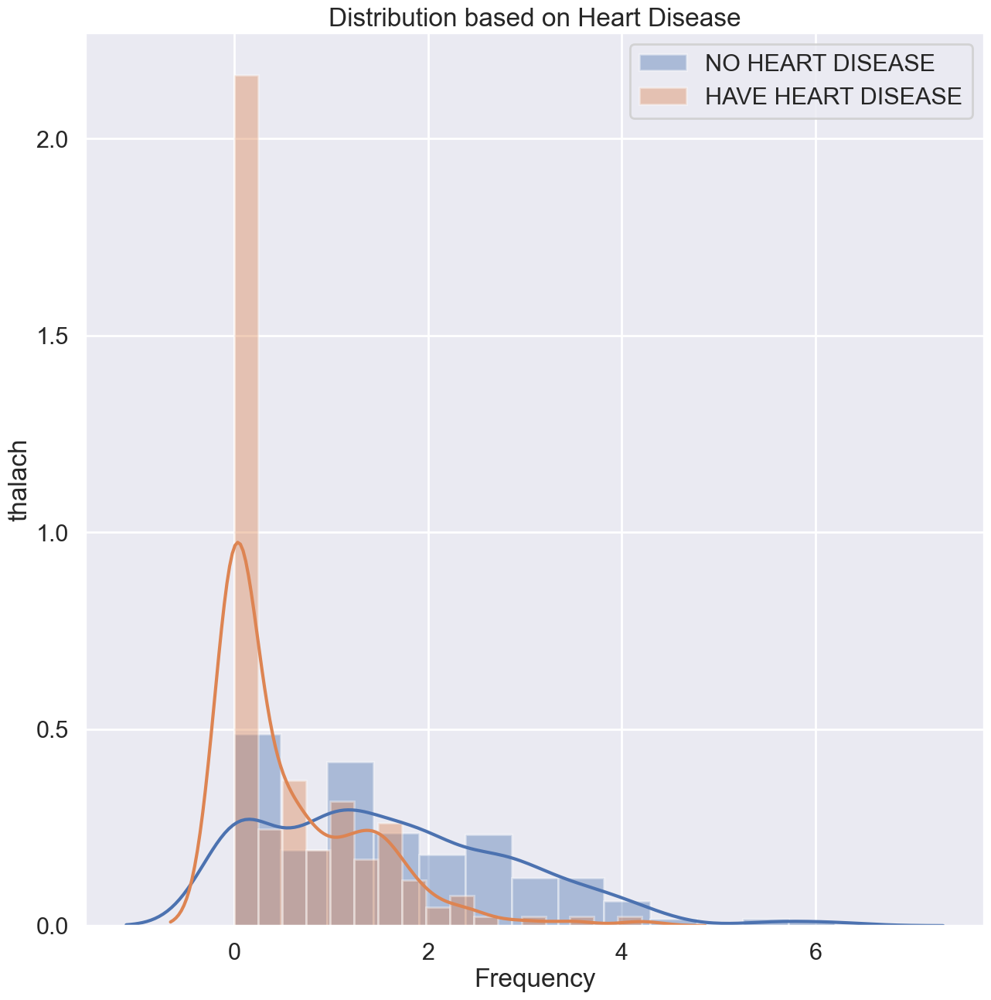

In [29]:
# Display age distribution based on heart disease
plt.figure(figsize=(15,15))
sns.distplot(dataset[dataset['target'] == 0]['oldpeak'], label='NO HEART DISEASE')
sns.distplot(dataset[dataset['target'] == 1]['oldpeak'], label = 'HAVE HEART DISEASE')
plt.xlabel('Frequency')
plt.ylabel('thalach')
plt.title('Distribution based on Heart Disease')
plt.legend()
plt.show()

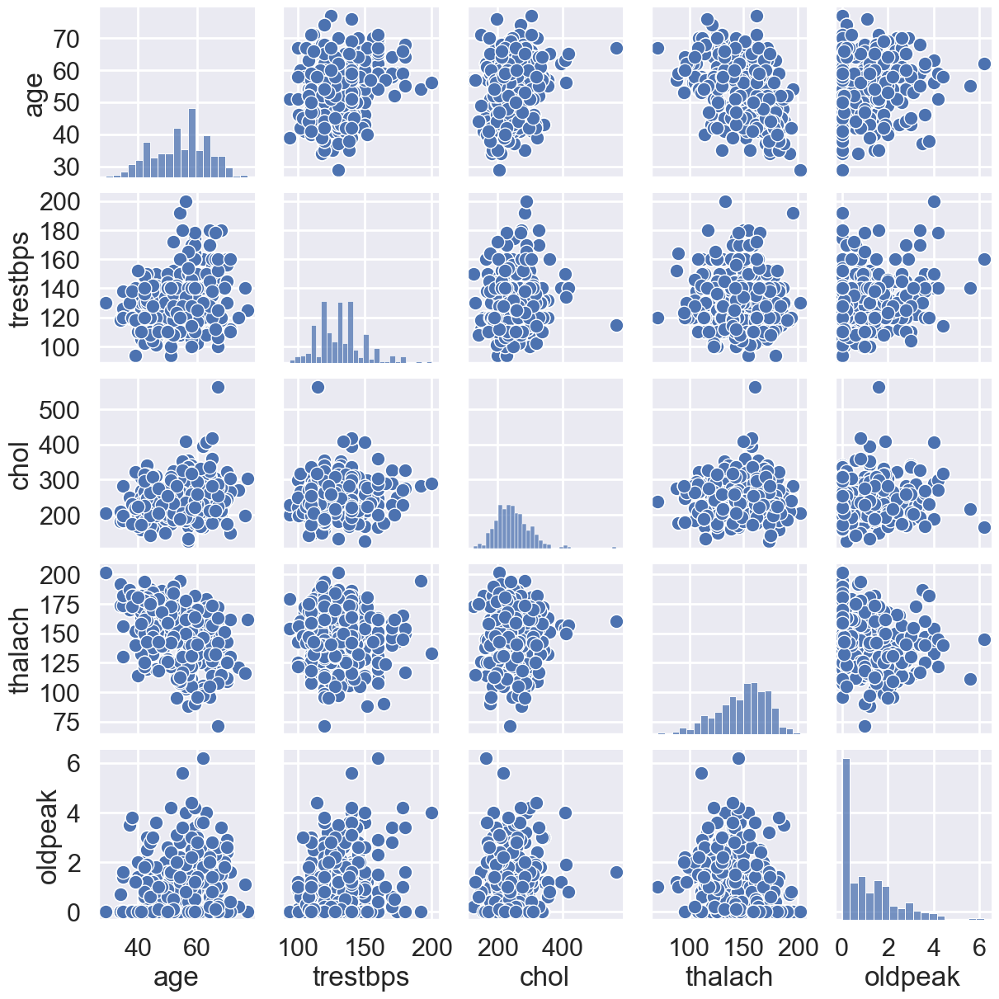

In [30]:
continuous = dataset[['age', 'trestbps', 'chol', 'thalach', 'oldpeak']]
sns.pairplot(continuous)
sns.set(rc={'figure.figsize':(30,30)})

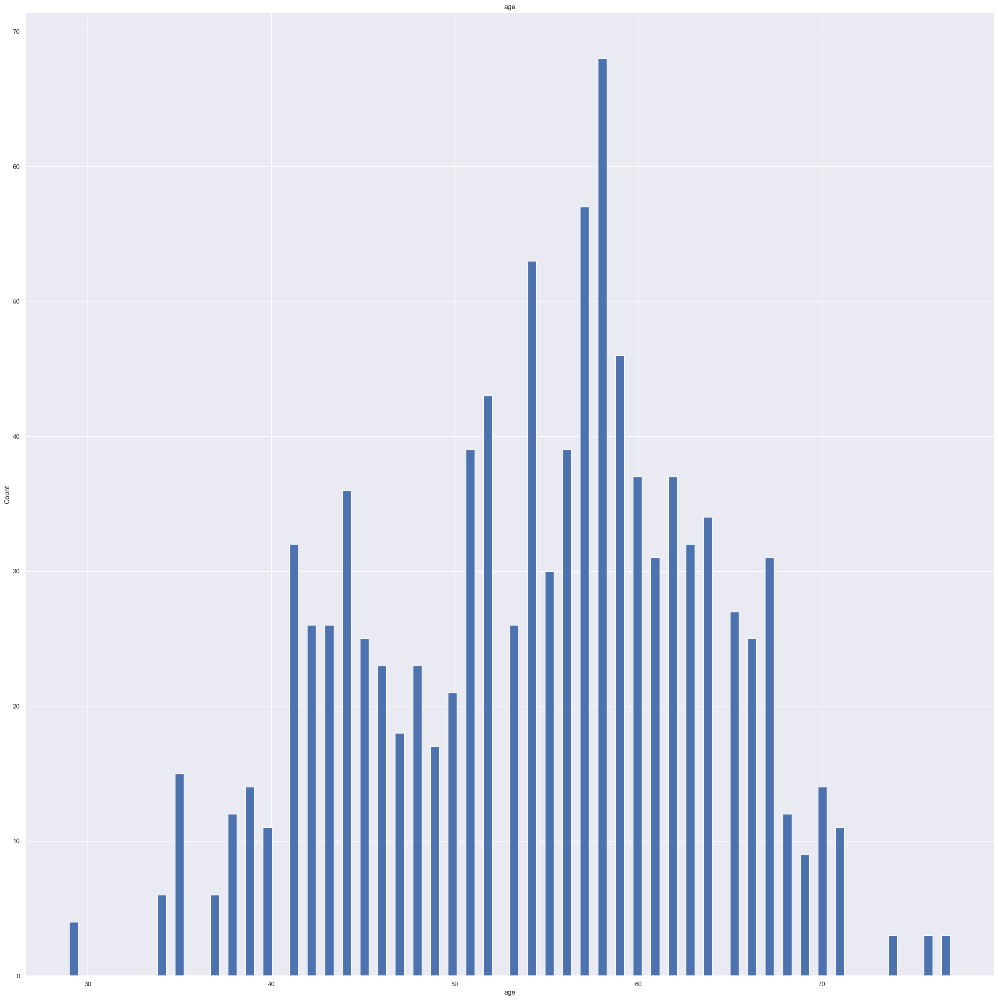

<Figure size 10x10 with 0 Axes>

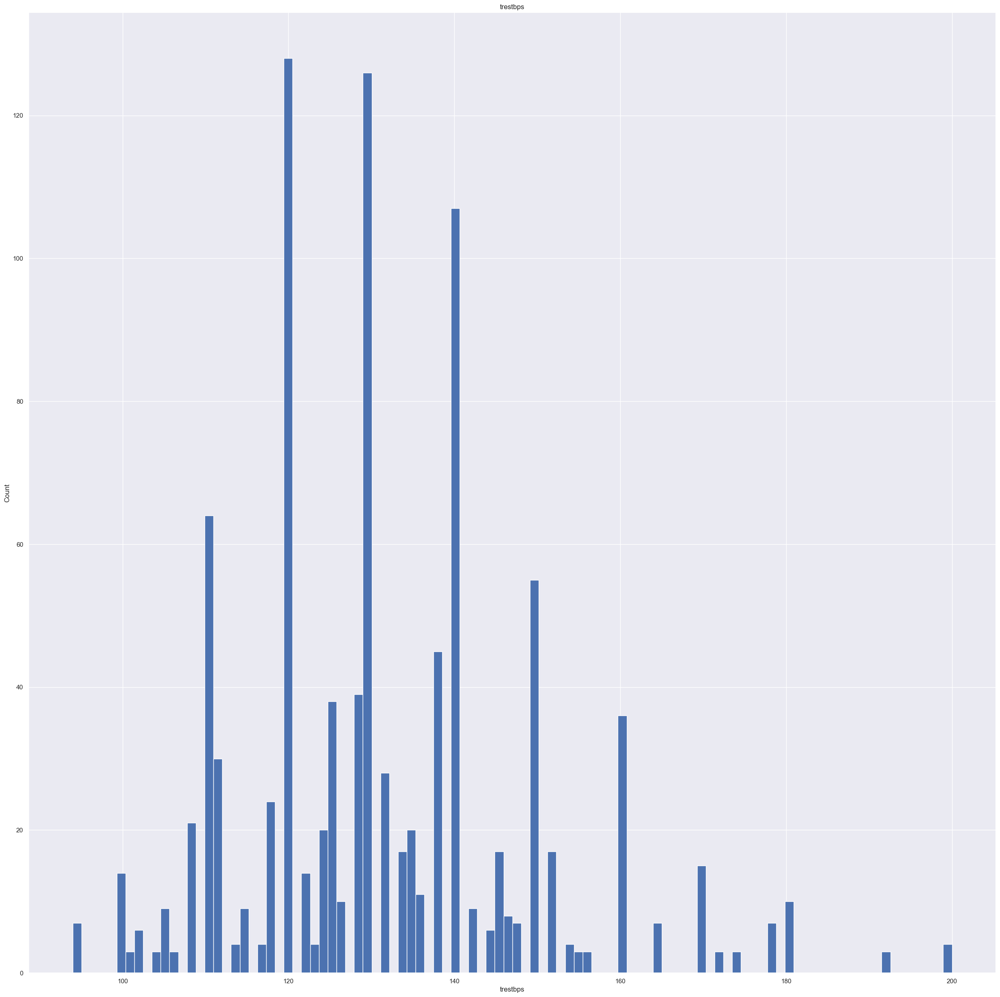

<Figure size 10x10 with 0 Axes>

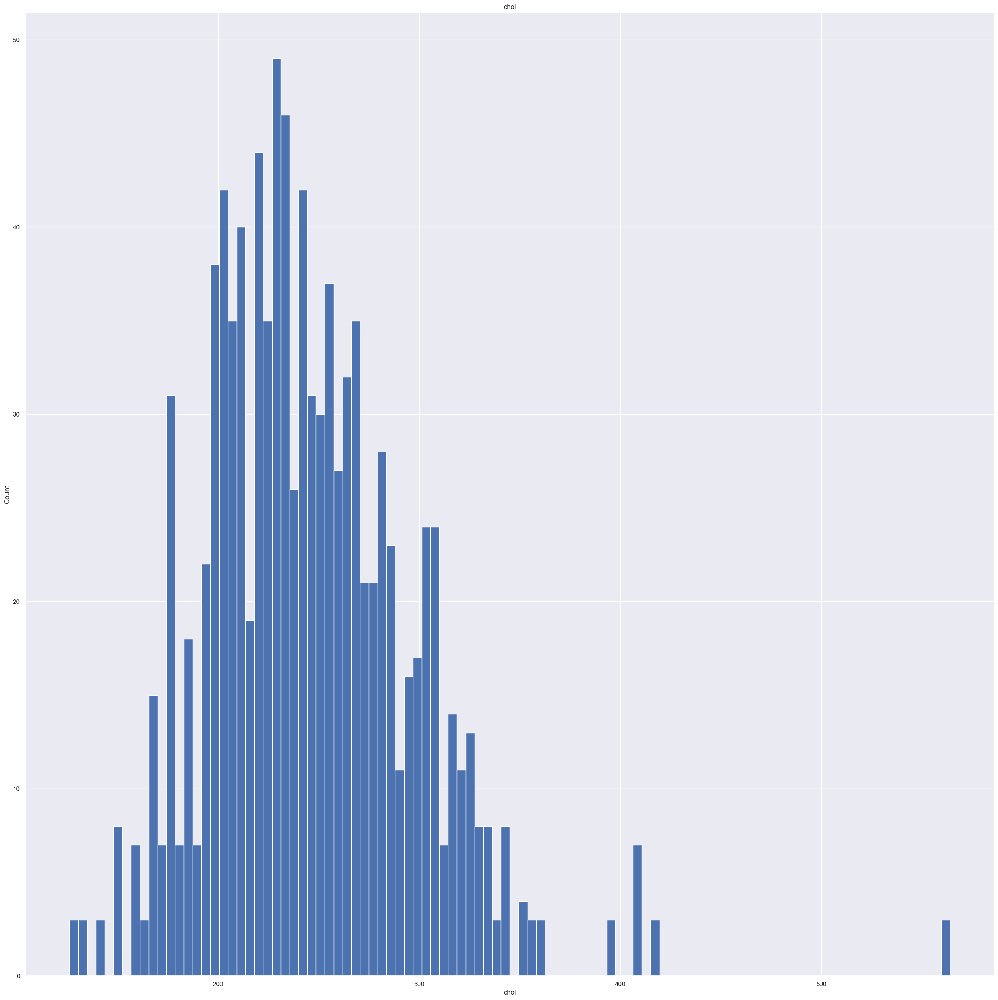

<Figure size 10x10 with 0 Axes>

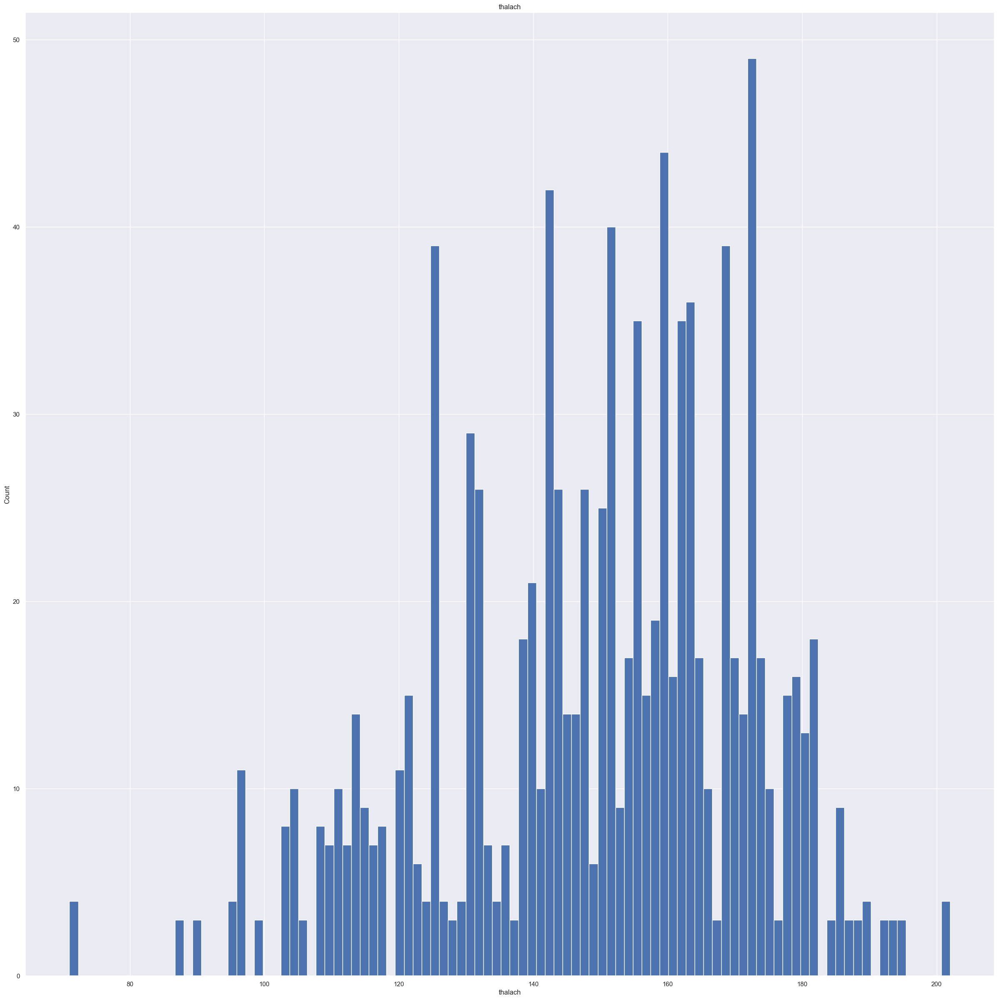

<Figure size 10x10 with 0 Axes>

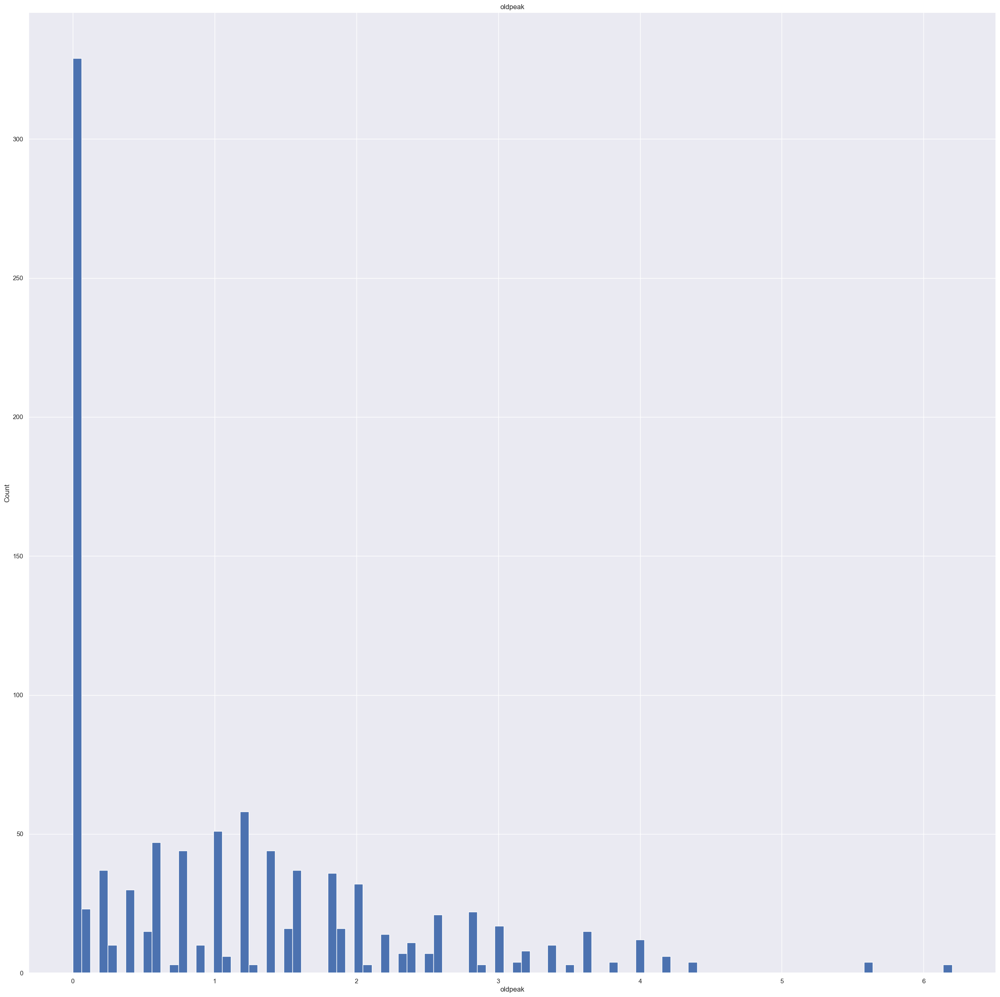

<Figure size 10x10 with 0 Axes>

In [16]:
## Lets analyse the continuous values by creating histograms to understand the distribution
for feature in continuous_feature:
    data=dataset.copy()
    data[feature].hist(bins=100)
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.title(feature)
    plt.figure(figsize=(0.1,0.1))
    plt.show()

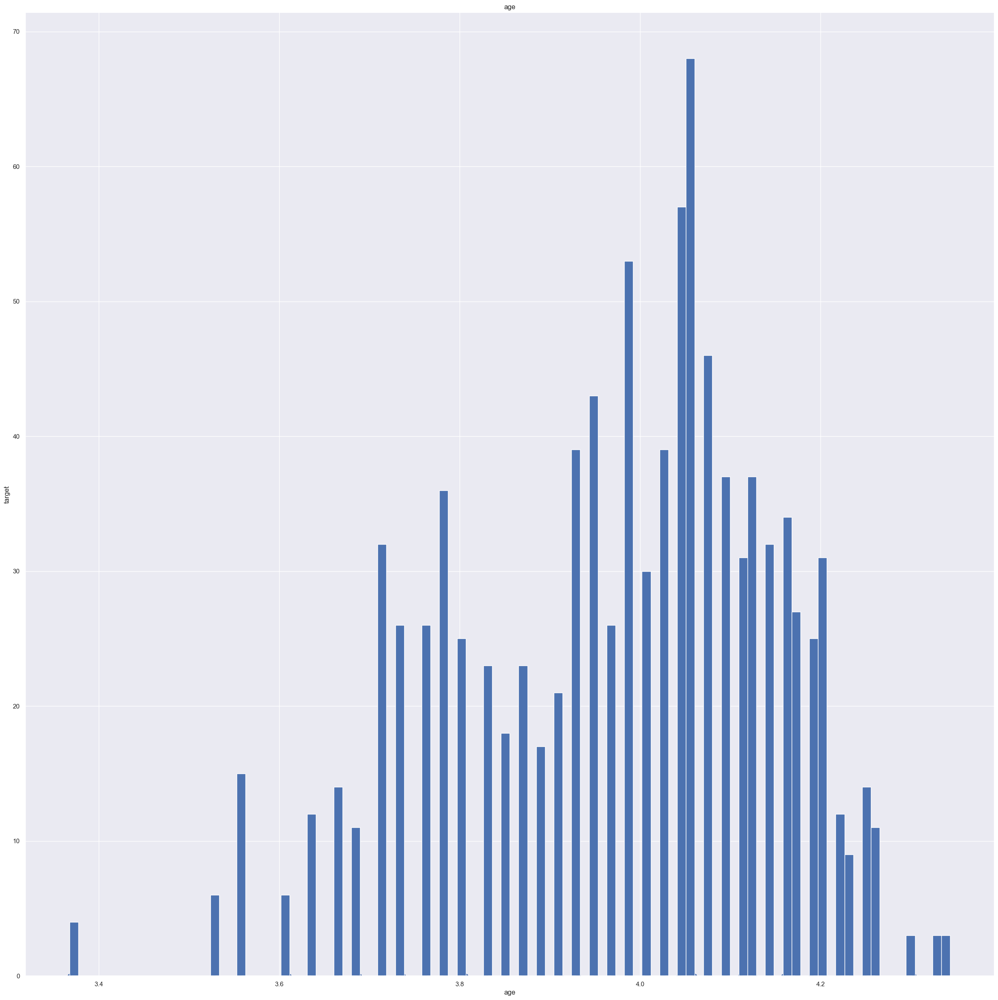

<Figure size 100x100 with 0 Axes>

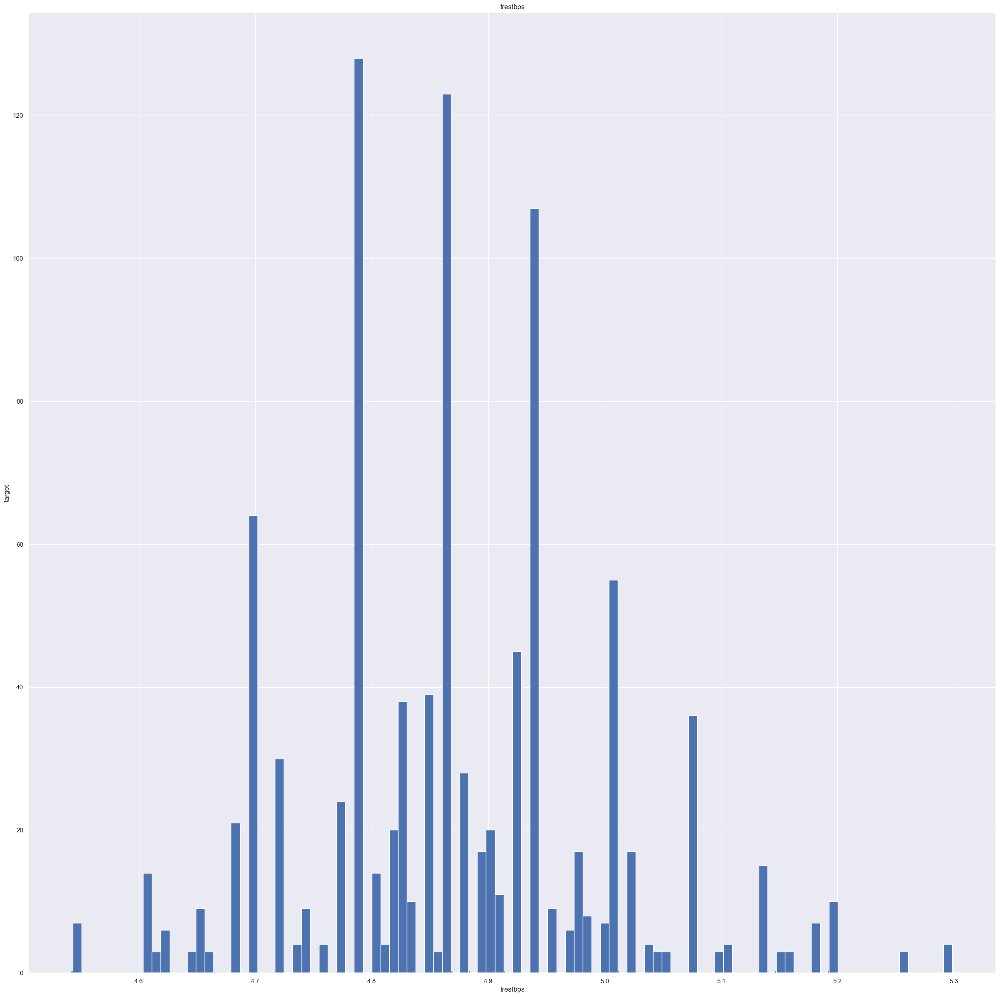

<Figure size 100x100 with 0 Axes>

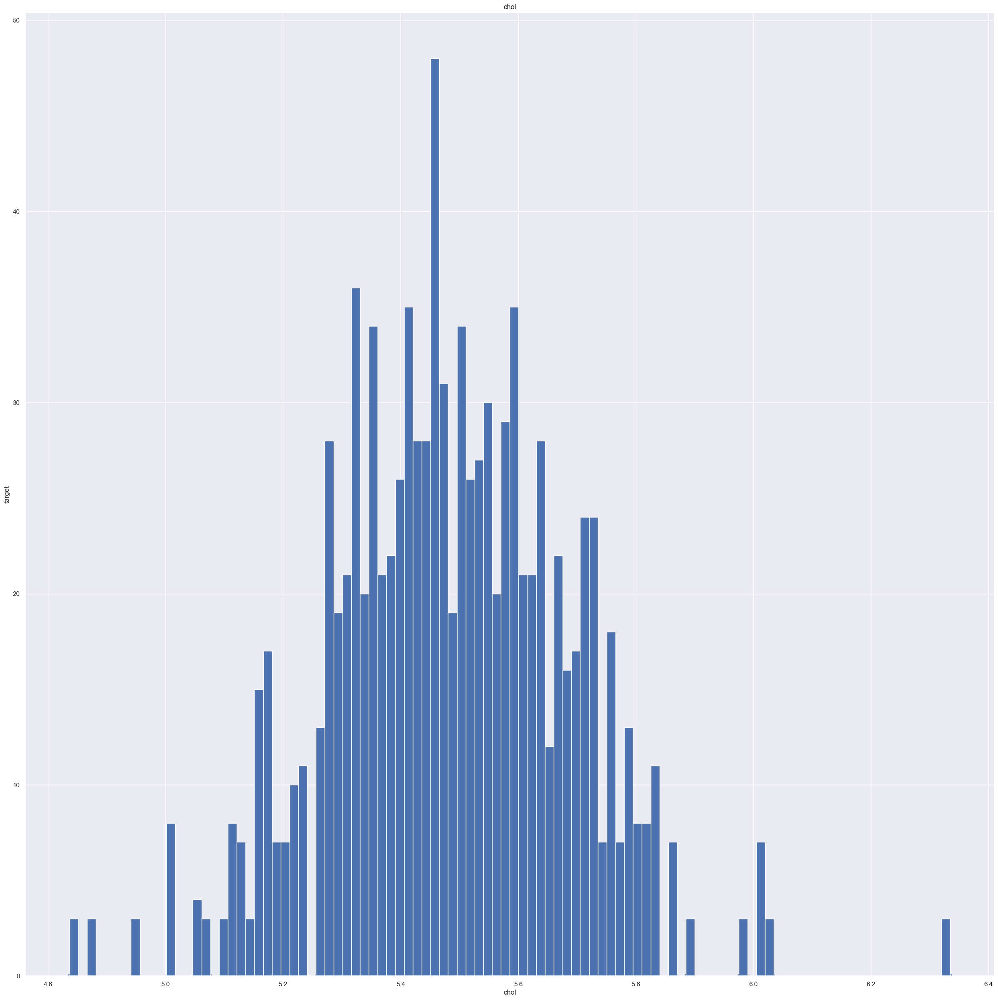

<Figure size 100x100 with 0 Axes>

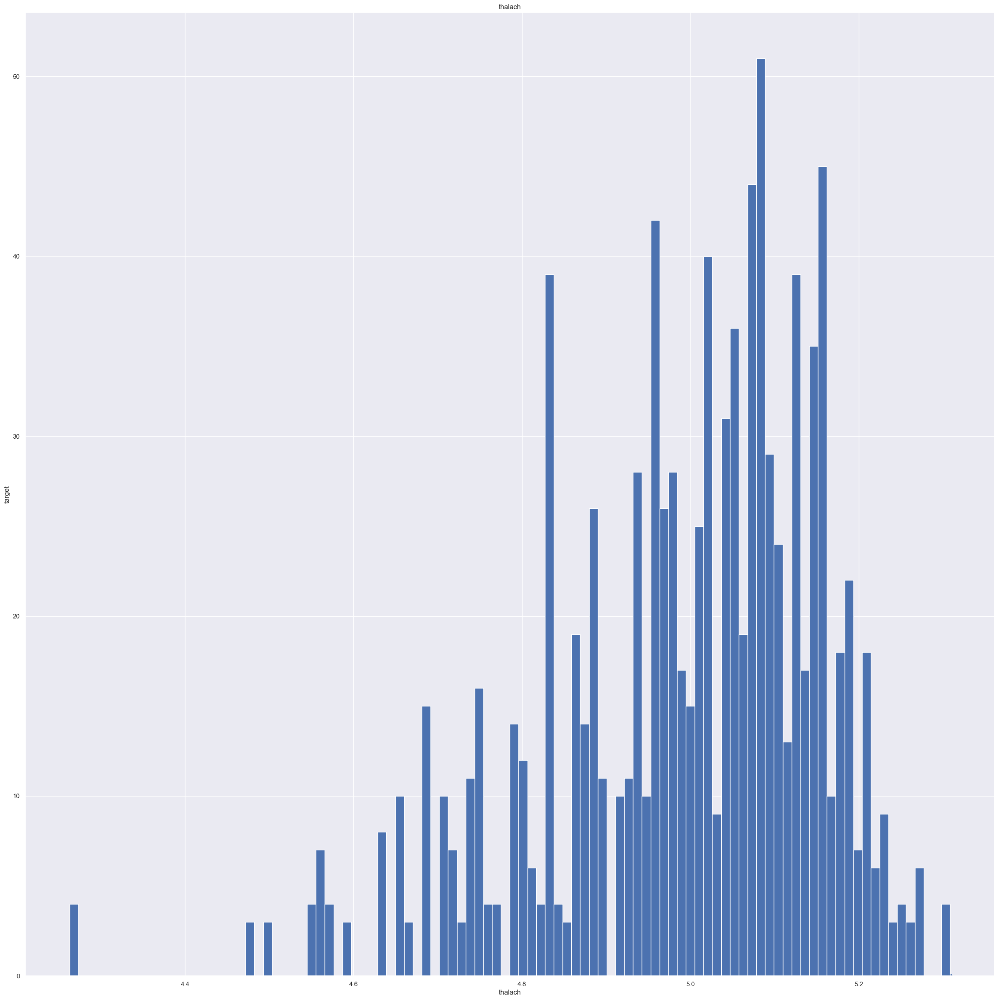

<Figure size 100x100 with 0 Axes>

In [17]:
## We will be using logarithmic transformation

for feature in continuous_feature:
    data=dataset.copy()
    if 0 in data[feature].unique():
        pass
    else:
        data[feature]=np.log(data[feature])
        data['target']=np.log(data['target'])
        plt.scatter(data[feature],data['target'])
        plt.xlabel(feature)
        data[feature].hist(bins=100)
        plt.ylabel('target')
        plt.title(feature)
        plt.figure(figsize=(1,1))
        plt.show()

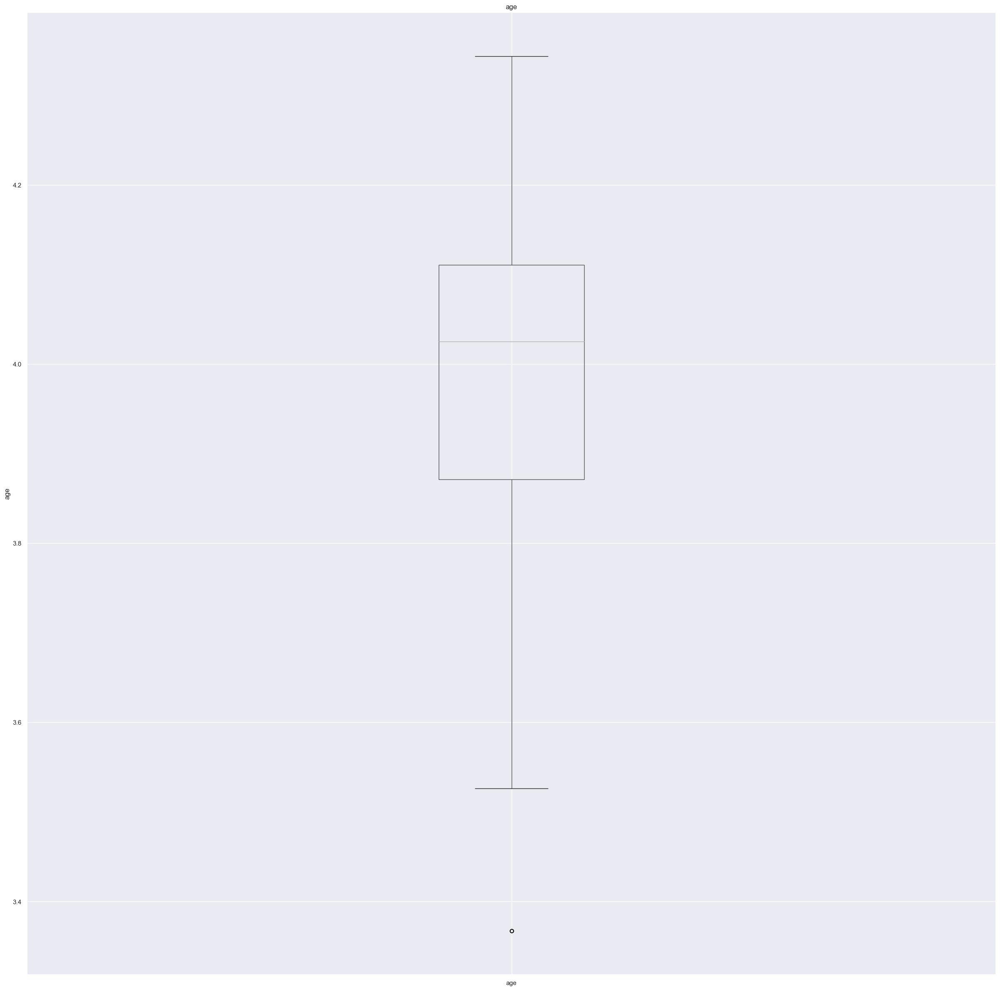

<Figure size 10x10 with 0 Axes>

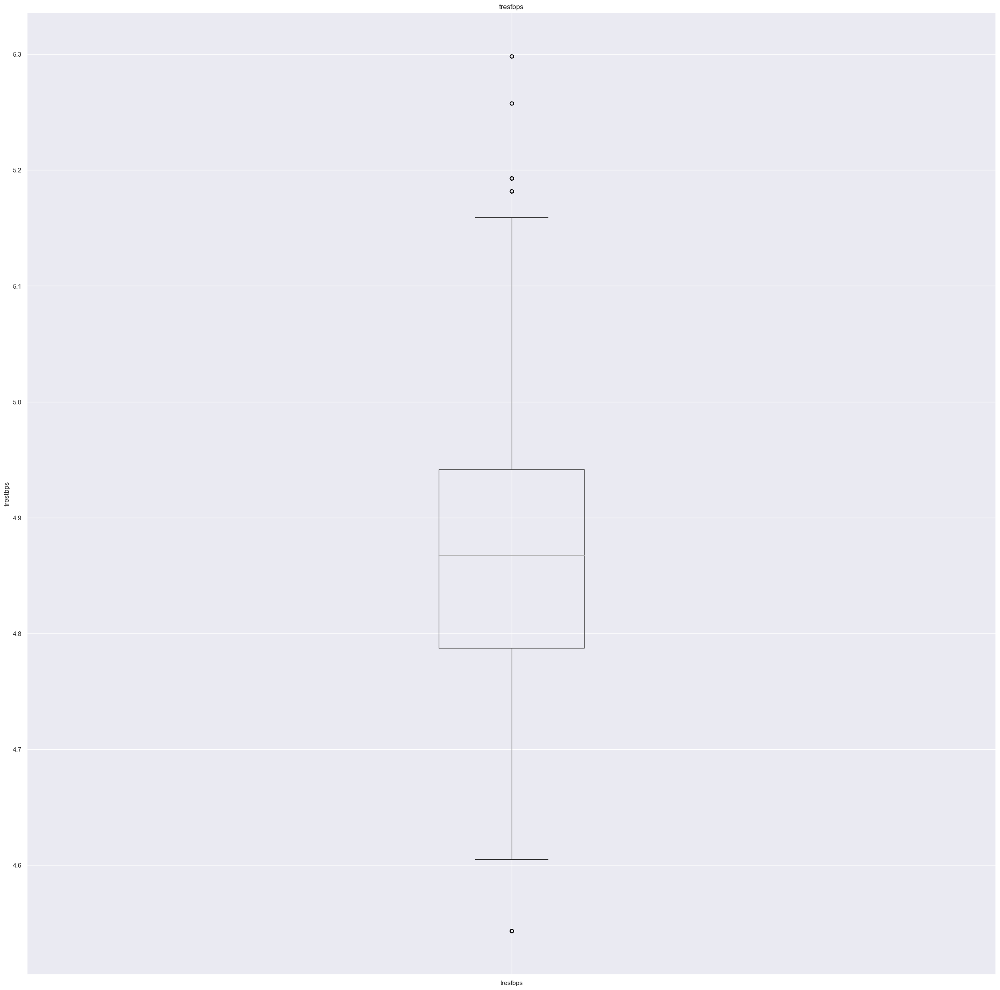

<Figure size 10x10 with 0 Axes>

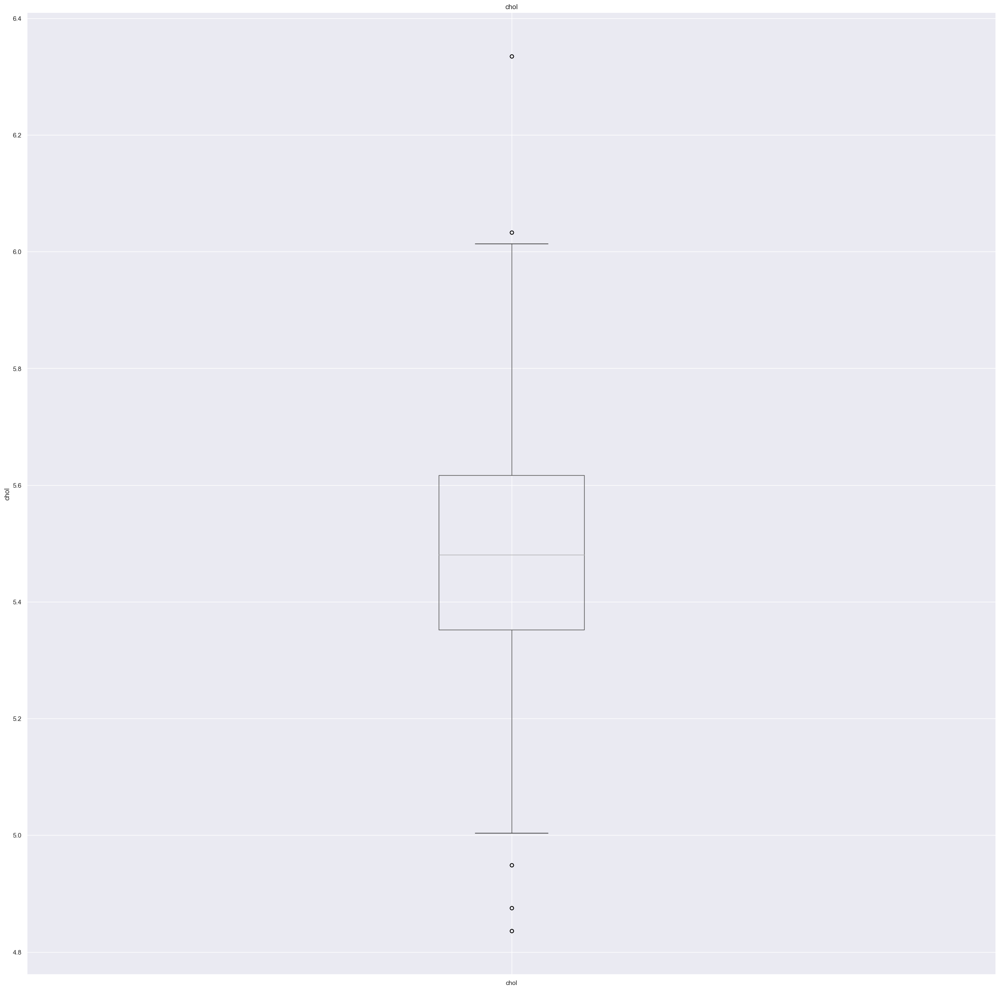

<Figure size 10x10 with 0 Axes>

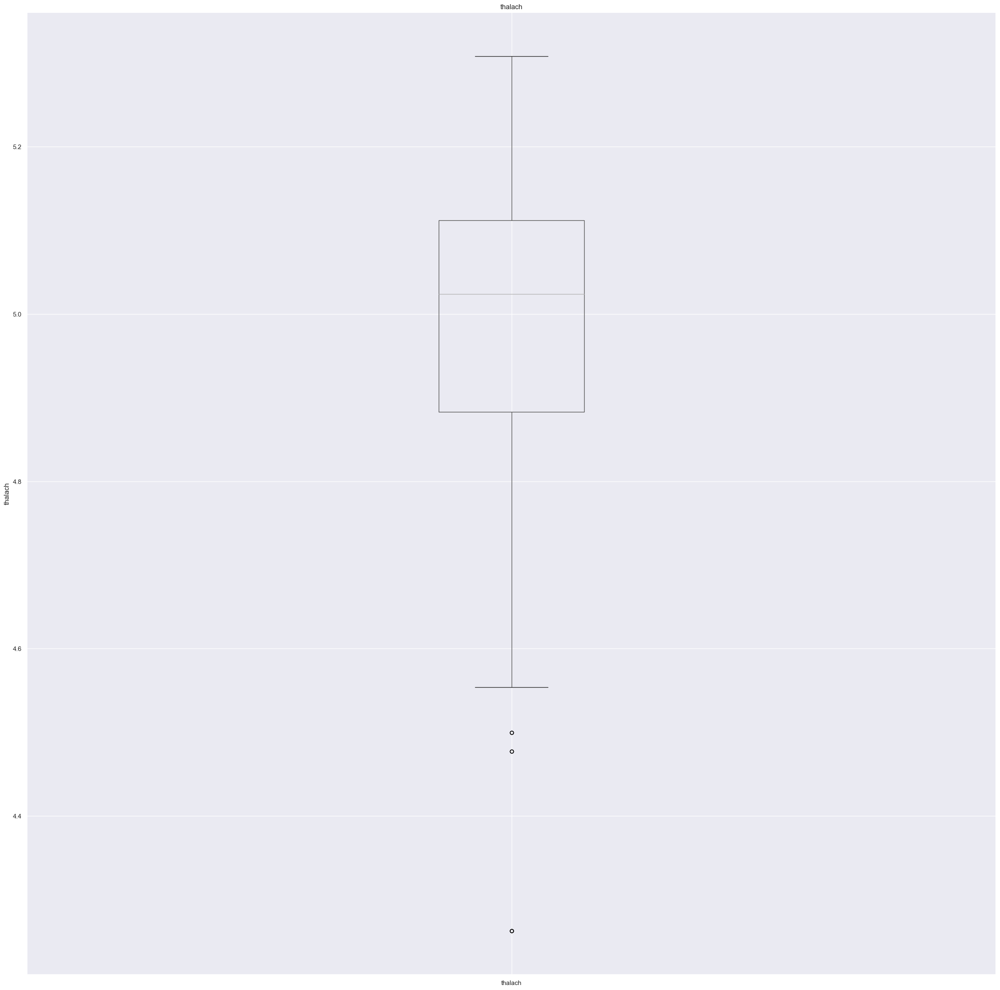

<Figure size 10x10 with 0 Axes>

In [18]:
#outline

for feature in continuous_feature:
    data=dataset.copy()
    if 0 in data[feature].unique():
        pass
    else:
        data[feature]=np.log(data[feature])
        data.boxplot(column=feature)
        plt.ylabel(feature)
        plt.title(feature)
        plt.figure(figsize=(0.1,0.1))
        plt.show()

In [19]:
# Categorical Variables
categorical_features=[feature for feature in dataset.columns if data[feature].dtypes=='O']
categorical_features

[]

it has no categorical features

# DATA SPLITTING

In [4]:
from sklearn.model_selection import train_test_split, GridSearchCV
X = dataset.drop('target', axis = 1)
y = dataset['target']

xtrain, xtest, ytrain, ytest = train_test_split(X, y, test_size = 0.25, stratify = y, random_state = 0)

# Data balancing

# 1.Smote Technique

In [5]:
smt = SMOTE(random_state = 0)
xtrain_res, ytrain_res = smt.fit_resample(xtrain, ytrain)

print(f'Distribution BEFORE balancing:\n{ytrain.value_counts()}')
print()
print(f'Distribution AFTER balancing:\n{ytrain_res.value_counts()}')

Distribution BEFORE balancing:
1    394
0    374
Name: target, dtype: int64

Distribution AFTER balancing:
1    394
0    394
Name: target, dtype: int64


# 2.Random oversampling

In [6]:
from imblearn.over_sampling import RandomOverSampler
ros = RandomOverSampler(random_state = 42)
  
X_res, y_res = ros.fit_resample(xtrain, ytrain)
   
X_res = pd.DataFrame(X_res)
Y_res = pd.DataFrame(y_res)
   
   
print(f'Distribution BEFORE balancing:\n{ytrain.value_counts()}')
print()
print(f'Distribution AFTER balancing:\n{Y_res.value_counts()}')
print(f'Distribution BEFORE balancing:\n{xtrain.value_counts()}')
print()
print(f'Distribution AFTER balancing:\n{X_res.value_counts()}')

Distribution BEFORE balancing:
1    394
0    374
Name: target, dtype: int64

Distribution AFTER balancing:
target
0         394
1         394
dtype: int64
Distribution BEFORE balancing:
age  sex  cp  trestbps  chol  fbs  restecg  thalach  exang  oldpeak  slope  ca  thal
38   1    2   138       175   0    1        173      0      0.0      2      4   2       7
29   1    1   130       204   0    0        202      0      0.0      2      0   2       4
55   0    0   180       327   0    2        117      1      3.4      1      0   2       4
65   1    3   138       282   1    0        174      0      1.4      1      1   2       4
47   1    2   108       243   0    1        152      0      0.0      2      0   2       4
                                                                                       ..
64   1    0   128       263   0    1        105      1      0.2      1      1   3       1
50   0    2   120       219   0    1        158      0      1.6      1      0   2       1
59   1   

In [7]:
continuous_feature

NameError: name 'continuous_feature' is not defined

# FEATURE SCALING

In [8]:
from sklearn.preprocessing import MinMaxScaler,StandardScaler
mms = MinMaxScaler() # Normalization
ss = StandardScaler() # Standardization

dataset['oldpeak'] = mms.fit_transform(dataset[['oldpeak']])
dataset['age'] = ss.fit_transform(dataset[['age']])
dataset['trestbps'] = ss.fit_transform(dataset[['trestbps']])
dataset['chol'] = ss.fit_transform(dataset[['chol']])
dataset['thalach'] = ss.fit_transform(dataset[['thalach']])
dataset['cp'] = ss.fit_transform(dataset[['cp']])
dataset['restecg'] = ss.fit_transform(dataset[['restecg']])
dataset['ca'] = ss.fit_transform(dataset[['ca']])
dataset['thal'] = ss.fit_transform(dataset[['thal']])
dataset.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,-0.268437,1,-0.915755,-0.377636,-0.659332,0,0.891255,0.821321,0,0.161290,2,1.209221,1.089852,0
1,-0.158157,1,-0.915755,0.479107,-0.833861,1,-1.004049,0.255968,1,0.500000,0,-0.731971,1.089852,0
2,1.716595,1,-0.915755,0.764688,-1.396233,0,0.891255,-1.048692,1,0.419355,0,-0.731971,1.089852,0
3,0.724079,1,-0.915755,0.936037,-0.833861,0,0.891255,0.516900,0,0.000000,2,0.238625,1.089852,0
4,0.834359,0,-0.915755,0.364875,0.930822,1,0.891255,-1.874977,0,0.306452,1,2.179817,-0.522122,0


In [9]:
scaling_feature=[feature for feature in dataset.columns if feature not in ['target']]
len(scaling_feature)

13

In [10]:
mask = ~np.isfinite(dataset)

# count the number of infinite or NaN values in each column
column_sum = mask.sum(axis=0)

# print the column(s) with infinite or NaN values and the number of occurrences
print(column_sum[column_sum > 0]) 

Series([], dtype: int64)


In [11]:
dataset.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,-0.268437,1,-0.915755,-0.377636,-0.659332,0,0.891255,0.821321,0,0.161290,2,1.209221,1.089852,0
1,-0.158157,1,-0.915755,0.479107,-0.833861,1,-1.004049,0.255968,1,0.500000,0,-0.731971,1.089852,0
2,1.716595,1,-0.915755,0.764688,-1.396233,0,0.891255,-1.048692,1,0.419355,0,-0.731971,1.089852,0
3,0.724079,1,-0.915755,0.936037,-0.833861,0,0.891255,0.516900,0,0.000000,2,0.238625,1.089852,0
4,0.834359,0,-0.915755,0.364875,0.930822,1,0.891255,-1.874977,0,0.306452,1,2.179817,-0.522122,0


# VARIANCE THRESHOLD

In [12]:
from sklearn.feature_selection import VarianceThreshold
var_thres=VarianceThreshold(threshold=0)
var_thres.fit(xtrain)

VarianceThreshold(threshold=0)

In [310]:
var_thres.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True])

In [311]:
sum(var_thres.get_support())

13

# PEARSONS COEFFICIENT

In [312]:
# feature selection using pearsons coefficient
xtrain.corr()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
age,1.000000,-0.127043,-0.070758,0.253927,0.257872,0.107903,-0.139470,-0.386468,0.081919,0.234250,-0.194288,0.262203,0.075619
sex,-0.127043,1.000000,-0.022050,-0.065689,-0.194873,0.042341,-0.042908,-0.033155,0.138569,0.068775,-0.004125,0.107292,0.200242
cp,-0.070758,-0.022050,1.000000,0.022695,-0.072429,0.116617,0.011706,0.293313,-0.386935,-0.211021,0.153326,-0.173493,-0.165080
trestbps,0.253927,-0.065689,0.022695,1.000000,0.153635,0.177988,-0.148547,-0.051827,0.070141,0.190727,-0.126825,0.104551,0.100913
chol,0.257872,-0.194873,-0.072429,0.153635,1.000000,0.019108,-0.136149,-0.026669,0.060993,0.081291,-0.010428,0.081512,0.080080
fbs,0.107903,0.042341,0.116617,0.177988,0.019108,1.000000,-0.100194,0.015702,0.029059,-0.022943,-0.055889,0.137550,-0.030225
restecg,-0.139470,-0.042908,0.011706,-0.148547,-0.136149,-0.100194,1.000000,0.040970,-0.018793,-0.038455,0.074862,-0.091891,-0.043480
thalach,-0.386468,-0.033155,0.293313,-0.051827,-0.026669,0.015702,0.040970,1.000000,-0.389262,-0.383325,0.412109,-0.196012,-0.091317
exang,0.081919,0.138569,-0.386935,0.070141,0.060993,0.029059,-0.018793,-0.389262,1.000000,0.312378,-0.264912,0.099204,0.175308
oldpeak,0.234250,0.068775,-0.211021,0.190727,0.081291,-0.022943,-0.038455,-0.383325,0.312378,1.000000,-0.580559,0.236790,0.197964


In [313]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [314]:
corr_features = correlation(xtrain, 0.7)
len(set(corr_features))
corr_features

set()

# MUTUAL INFORMATION FEATURE SELECTION

In [315]:
from sklearn.feature_selection import mutual_info_classif

In [316]:
mutual_info=mutual_info_classif(X,y)

In [317]:
mutual_data=pd.Series(mutual_info,index=X.columns)
mutual_data.sort_values(ascending=False)

chol        0.265378
thal        0.163952
thalach     0.160508
oldpeak     0.156206
cp          0.138214
ca          0.134052
trestbps    0.092657
exang       0.090553
sex         0.074036
age         0.061218
slope       0.039351
fbs         0.011015
restecg     0.000000
dtype: float64

<Figure size 1000x1000 with 0 Axes>

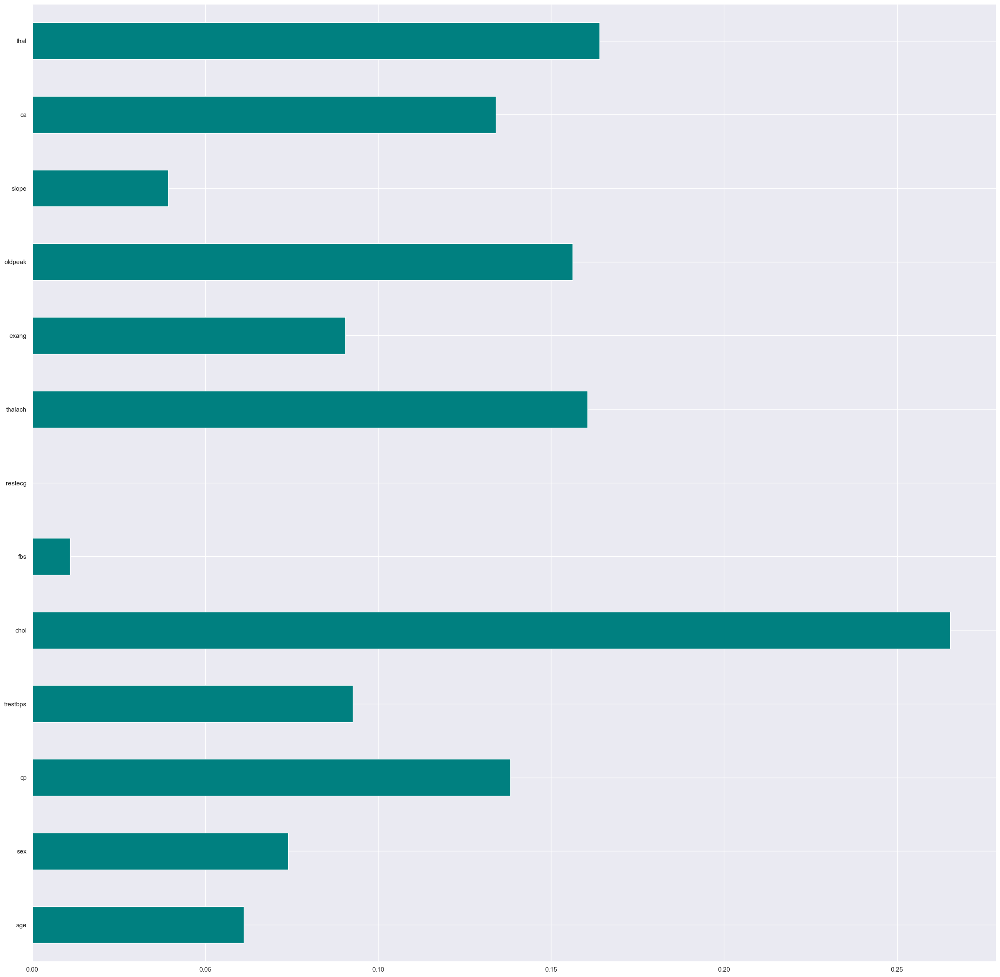

<Figure size 1000x1000 with 0 Axes>

In [318]:
from matplotlib.pyplot import figure
mutual_data.plot(kind='barh',color='teal')
figure(figsize=(10, 10) )

In [319]:
pip install mlxtend

Note: you may need to restart the kernel to use updated packages.


# FORWARD FEATURE SELECTION

In [320]:
from mlxtend.feature_selection import SequentialFeatureSelector
from sklearn.ensemble import ExtraTreesClassifier

In [321]:
forward_feature_selection= SequentialFeatureSelector(ExtraTreesClassifier(n_jobs=-1), k_features=(1,7), forward=True,floating=False, verbose=2,scoring='accuracy',cv=5).fit(xtrain,ytrain)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.7s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  13 out of  13 | elapsed:   20.5s finished

[2023-06-18 19:20:58] Features: 1/7 -- score: 0.7708683473389355[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  12 out of  12 | elapsed:   18.0s finished

[2023-06-18 19:21:16] Features: 2/7 -- score: 0.8619472031236738[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.6s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  11 out of  11 | elapsed:   17.0s finished

[2023-06-18 19:21:33] Features: 3/7 -- score: 0.9726508785332315[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 

In [322]:
forward_feature_selection.k_feature_names_

('age', 'cp', 'chol', 'restecg', 'thalach', 'ca', 'thal')

In [323]:
forward_feature_selection.k_score_

0.9895934131228248

In [324]:
pd.DataFrame.from_dict(forward_feature_selection.get_metric_dict()).T

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(12,)","[0.7402597402597403, 0.7597402597402597, 0.785...",0.770868,"(thal,)",0.035333,0.02749,0.013745
2,"(4, 12)","[0.8896103896103896, 0.8506493506493507, 0.870...",0.861947,"(chol, thal)",0.029467,0.022927,0.011463
3,"(0, 4, 12)","[0.987012987012987, 0.9675324675324676, 0.9675...",0.972651,"(age, chol, thal)",0.009764,0.007597,0.003798
4,"(0, 4, 11, 12)","[0.987012987012987, 0.961038961038961, 0.97402...",0.976572,"(age, chol, ca, thal)",0.011292,0.008786,0.004393
5,"(0, 2, 4, 11, 12)","[0.987012987012987, 0.9675324675324676, 0.9935...",0.986996,"(age, cp, chol, ca, thal)",0.013966,0.010866,0.005433
6,"(0, 2, 4, 6, 11, 12)","[0.987012987012987, 0.9675324675324676, 0.9935...",0.988303,"(age, cp, chol, restecg, ca, thal)",0.014354,0.011168,0.005584
7,"(0, 2, 4, 6, 7, 11, 12)","[0.987012987012987, 0.9805194805194806, 0.9935...",0.989593,"(age, cp, chol, restecg, thalach, ca, thal)",0.00852,0.006629,0.003314


In [19]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import plot_roc_curve
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.metrics import precision_recall_curve

# Model creation without feature selection

In [20]:
def model(classifier):
    
    classifier.fit(xtrain,ytrain)
    prediction = classifier.predict(xtest)
    cv = RepeatedStratifiedKFold(n_splits = 10,n_repeats = 3,random_state = 1)
    print("Accuracy : ",'{0:.2%}'.format(accuracy_score(ytest,prediction)))
    print("Cross Validation Score : ",'{0:.2%}'.format(cross_val_score(classifier,xtrain,ytrain,cv = cv,scoring = 'roc_auc').mean()))
    print("ROC_AUC Score : ",'{0:.2%}'.format(roc_auc_score(ytest,prediction)))
    print("Error Rate: ",'{0:.2%}'.format(1-accuracy_score(ytest,prediction)))
    plot_roc_curve(classifier, xtest,ytest)
    plt.title('ROC_AUC_Plot')
    plt.show()

    
def model_evaluation(classifier):
    
    # Confusion Matrix
    cm = confusion_matrix(ytest,classifier.predict(xtest))
    names = ['True Neg','False Pos','False Neg','True Pos']
    counts = [value for value in cm.flatten()]
    percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(names,counts,percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cm,annot = labels,cmap ='BrBG' ,fmt ='')
    
    # Classification Report
    print(classification_report(ytest,classifier.predict(xtest)))



# 1. Logistic regression

In [108]:
from sklearn.linear_model import LogisticRegression
from scipy.stats import loguniform
from sklearn.linear_model import Ridge
from sklearn.model_selection import RepeatedKFold
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)

In [109]:
# normal logistic regression
classifier_lr = LogisticRegression(random_state = 0,C=10,penalty= 'l2',solver='newton-cg',class_weight='balanced')

In [110]:
# Classification for GridSearchCV
classifier=LogisticRegression()

In [111]:
classifier.fit(xtrain,ytrain)

LogisticRegression()

In [112]:
from sklearn.model_selection import GridSearchCV
parameter={'penalty':['l1','l2','elasticnet'],'C':[1,2,3,4,5,6,10,20,30,40,50],'max_iter':[100,200,300],'solver':['newton-cg','lbfgs','liblinear']}

In [113]:
classifier_regressor=GridSearchCV(classifier_lr,param_grid=parameter,scoring='accuracy',cv=cv)

In [114]:
classifier_regressor.fit(xtrain,ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=LogisticRegression(C=10, class_weight='balanced',
                                          random_state=0, solver='newton-cg'),
             param_grid={'C': [1, 2, 3, 4, 5, 6, 10, 20, 30, 40, 50],
                         'max_iter': [100, 200, 300],
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear']},
             scoring='accuracy')

In [115]:
print(classifier_regressor.best_params_)

{'C': 2, 'max_iter': 100, 'penalty': 'l2', 'solver': 'liblinear'}


In [116]:
print(classifier_regressor.best_score_)

0.8558498519024834


In [117]:
##prediction
y_pred=classifier_regressor.predict(xtest)

In [118]:
## accuracy score
from sklearn.metrics import accuracy_score,classification_report

In [119]:
score=accuracy_score(y_pred,ytest)
print(score)

0.8365758754863813


In [120]:
# imbalanced and via grid search
print(classification_report(y_pred,ytest))

              precision    recall  f1-score   support

           0       0.82      0.84      0.83       123
           1       0.85      0.84      0.84       134

    accuracy                           0.84       257
   macro avg       0.84      0.84      0.84       257
weighted avg       0.84      0.84      0.84       257



Accuracy :  84.44%
Cross Validation Score :  91.49%
ROC_AUC Score :  84.36%
Error Rate:  15.56%


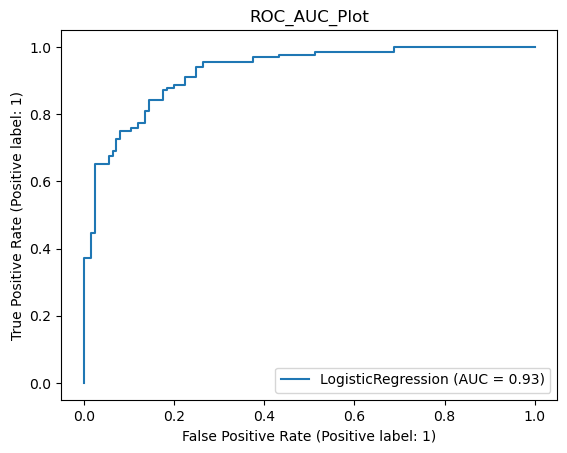

In [27]:
#not balanced and without grid search hyperparameters
model(classifier)

Accuracy :  82.49%
Cross Validation Score :  91.55%
ROC_AUC Score :  82.47%
Error Rate:  17.51%


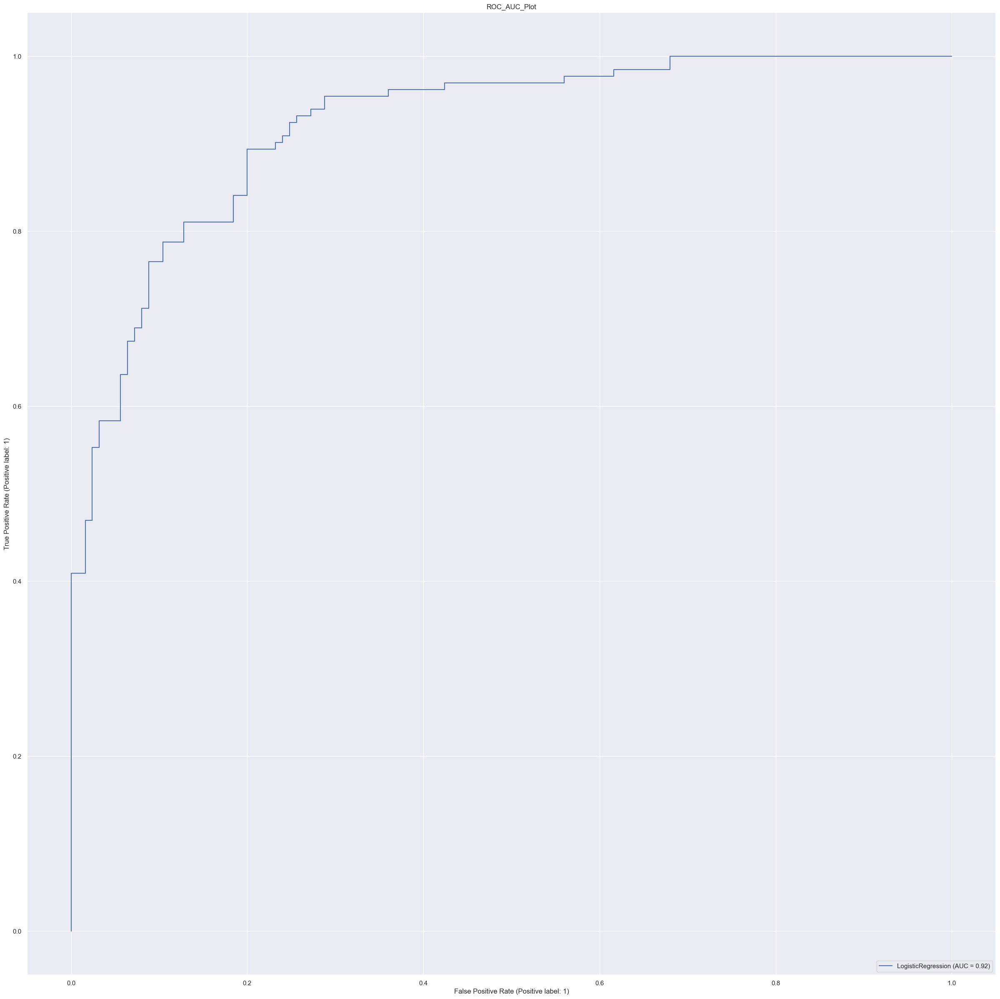

In [340]:
# balanced but without GridSearchCV hyperparameters
model(classifier_lr)

              precision    recall  f1-score   support

           0       0.82      0.82      0.82       125
           1       0.83      0.83      0.83       132

    accuracy                           0.82       257
   macro avg       0.82      0.82      0.82       257
weighted avg       0.82      0.82      0.82       257



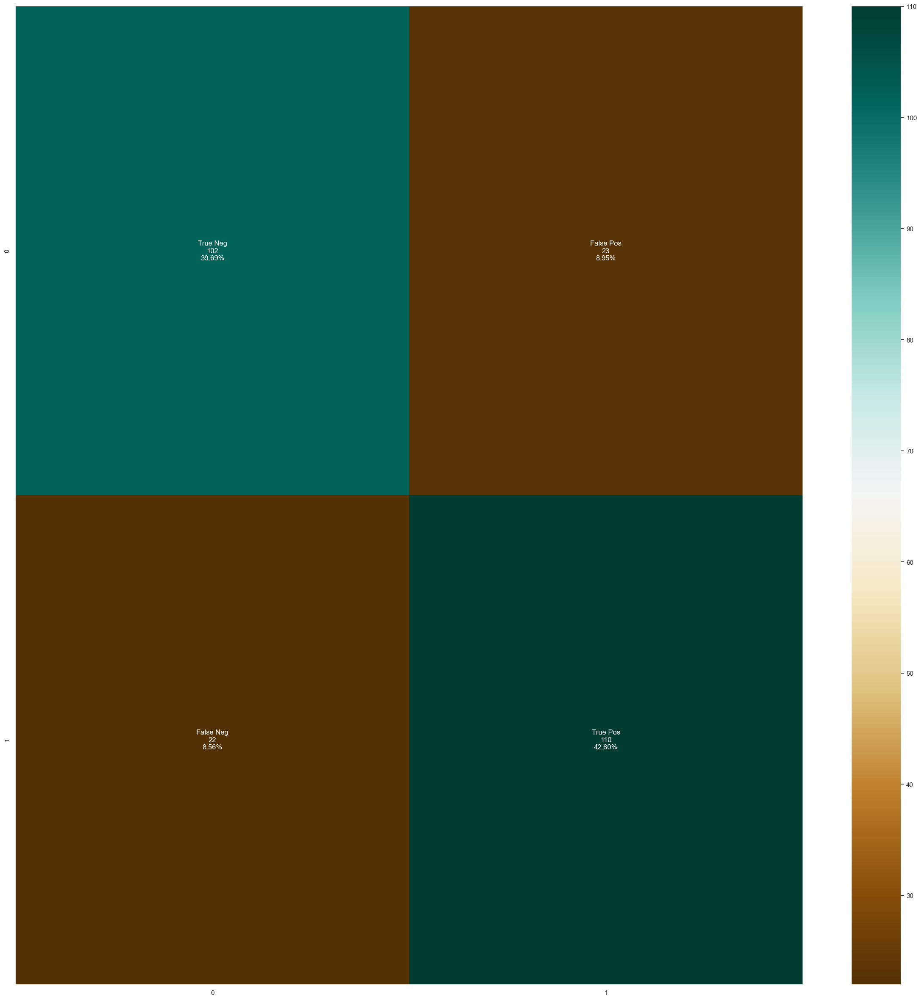

In [341]:
#Report generated after classifier without gridsearchcv 
model_evaluation(classifier_lr)

              precision    recall  f1-score   support

           0       0.86      0.82      0.84       125
           1       0.83      0.87      0.85       132

    accuracy                           0.84       257
   macro avg       0.85      0.84      0.84       257
weighted avg       0.84      0.84      0.84       257



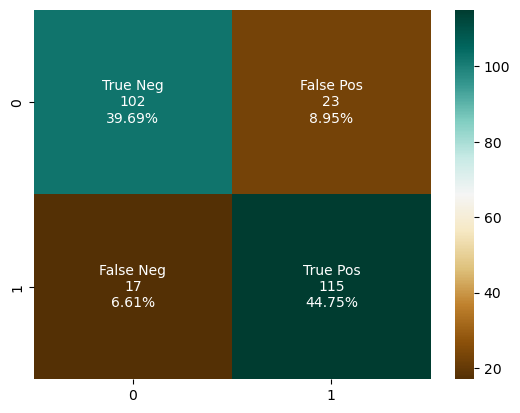

In [28]:
model_evaluation(classifier)

# 2.Decision Tree Classifier

In [29]:
from sklearn.tree import DecisionTreeClassifier

In [30]:
classifier_dtbalanced = DecisionTreeClassifier(random_state = 1000,max_depth = 4,min_samples_leaf = 1, class_weight='balanced')

In [31]:
classifier1=DecisionTreeClassifier()

In [32]:
classifier1.fit(xtrain,ytrain)

DecisionTreeClassifier()

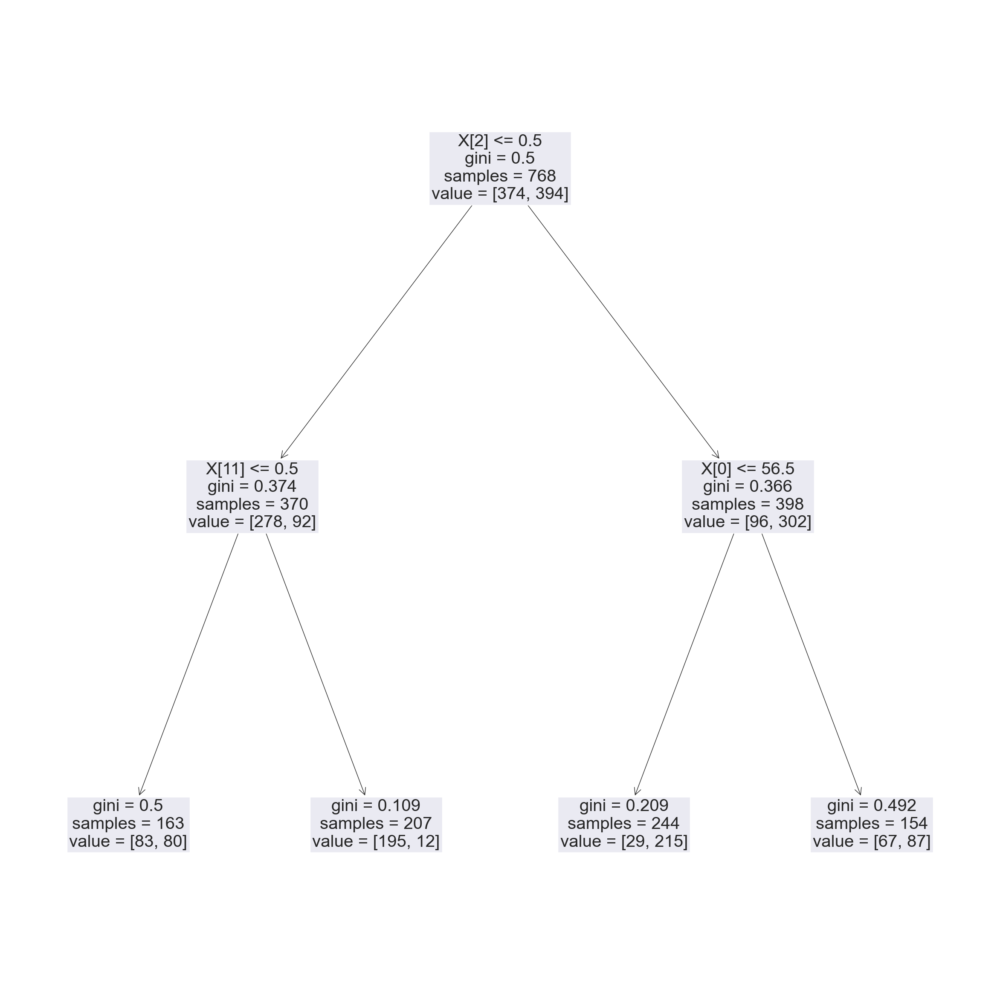

<Figure size 10000x10000 with 0 Axes>

<Figure size 10000x10000 with 0 Axes>

In [345]:
tree=DecisionTreeClassifier(max_depth=2)
tree.fit(xtrain,ytrain)
from sklearn.tree import plot_tree
plot_tree(tree,fontsize=29)
plt.show()
plt.figure(figsize=(100,100))

In [122]:
parameter1 ={'criterion':['gini','entropy','log_loss'],'splitter':['best','random'],'max_depth':[1,2,3,4,5],'max_features':['auto', 'sqrt', 'log2']}

In [123]:
classifier_decisiontree=GridSearchCV(classifier_dtbalanced,param_grid=parameter1,scoring='accuracy',cv=cv)

In [124]:
classifier_decisiontree.fit(xtrain,ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=DecisionTreeClassifier(class_weight='balanced',
                                              max_depth=4, random_state=1000),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [1, 2, 3, 4, 5],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'splitter': ['best', 'random']},
             scoring='accuracy')

In [125]:
print(classifier_decisiontree.best_params_)

{'criterion': 'gini', 'max_depth': 5, 'max_features': 'auto', 'splitter': 'random'}


In [126]:
print(classifier_decisiontree.best_score_)

0.8393597630439735


In [127]:
##prediction
y_pred1=classifier_decisiontree.predict(xtest)

In [128]:
score=accuracy_score(y_pred1,ytest)
error=1-accuracy_score(y_pred1,ytest)
print("accuracy is ",score)
print("error rate is",error)

accuracy is  0.8638132295719845
error rate is 0.13618677042801552


In [129]:
# imbalanced and via grid search
print(classification_report(y_pred1,ytest))

              precision    recall  f1-score   support

           0       0.86      0.86      0.86       124
           1       0.87      0.86      0.87       133

    accuracy                           0.86       257
   macro avg       0.86      0.86      0.86       257
weighted avg       0.86      0.86      0.86       257



Accuracy :  86.38%
Cross Validation Score :  91.82%
ROC_AUC Score :  86.38%
Error Rate:  13.62%


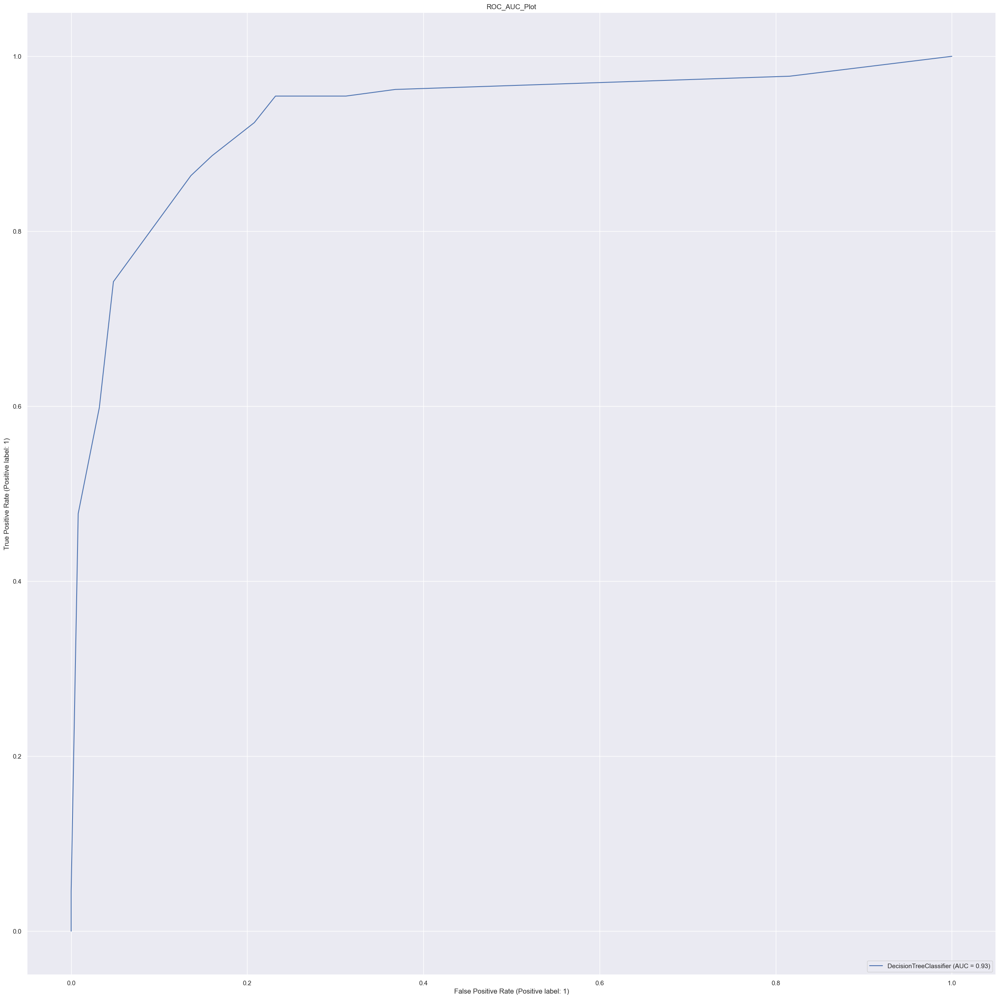

In [354]:
#balanced but no gridsearch hyperparameters applied
model(classifier_dtbalanced)

Accuracy :  98.83%
Cross Validation Score :  98.55%
ROC_AUC Score :  98.86%
Error Rate:  1.17%


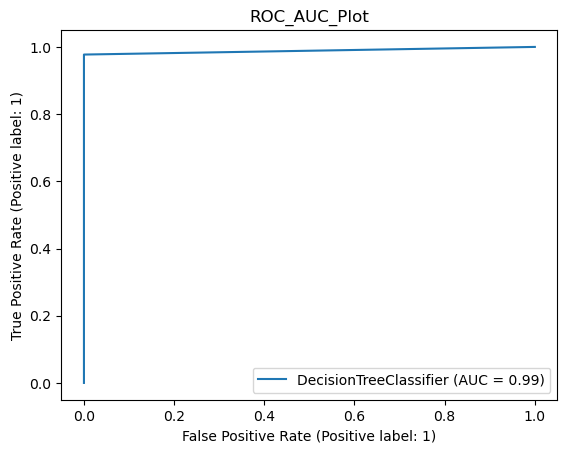

In [33]:
#not balanced and without grid search hyperparameters
model(classifier1)

              precision    recall  f1-score   support

           0       0.92      0.73      0.81       125
           1       0.78      0.94      0.86       132

    accuracy                           0.84       257
   macro avg       0.85      0.83      0.83       257
weighted avg       0.85      0.84      0.83       257



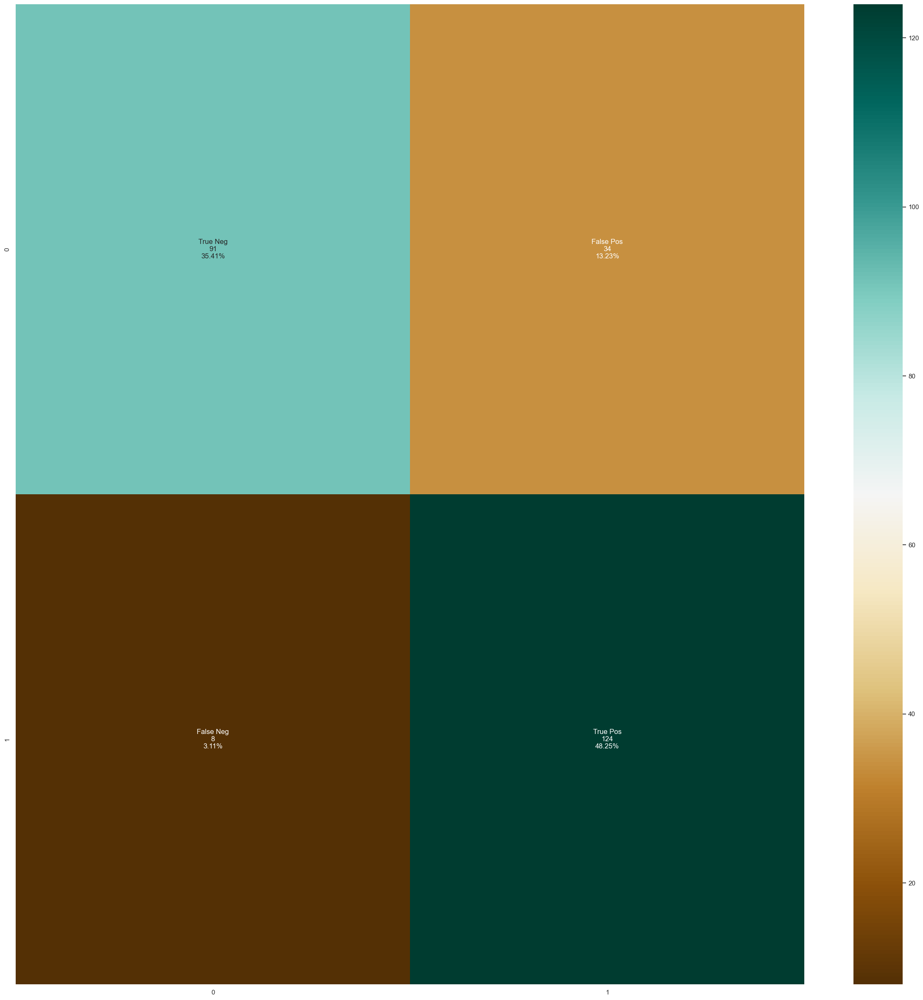

In [356]:
#not balanced but grid search tree applied
model_evaluation(classifier_decisiontree)

              precision    recall  f1-score   support

           0       0.98      1.00      0.99       125
           1       1.00      0.98      0.99       132

    accuracy                           0.99       257
   macro avg       0.99      0.99      0.99       257
weighted avg       0.99      0.99      0.99       257



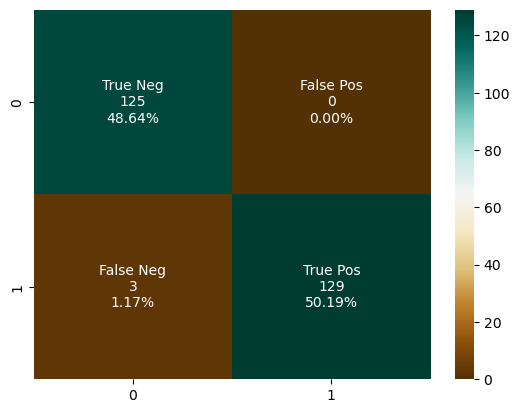

In [34]:
# not balanced and without grid searchtree 
model_evaluation(classifier1)

              precision    recall  f1-score   support

           0       0.86      0.86      0.86       125
           1       0.87      0.86      0.87       132

    accuracy                           0.86       257
   macro avg       0.86      0.86      0.86       257
weighted avg       0.86      0.86      0.86       257



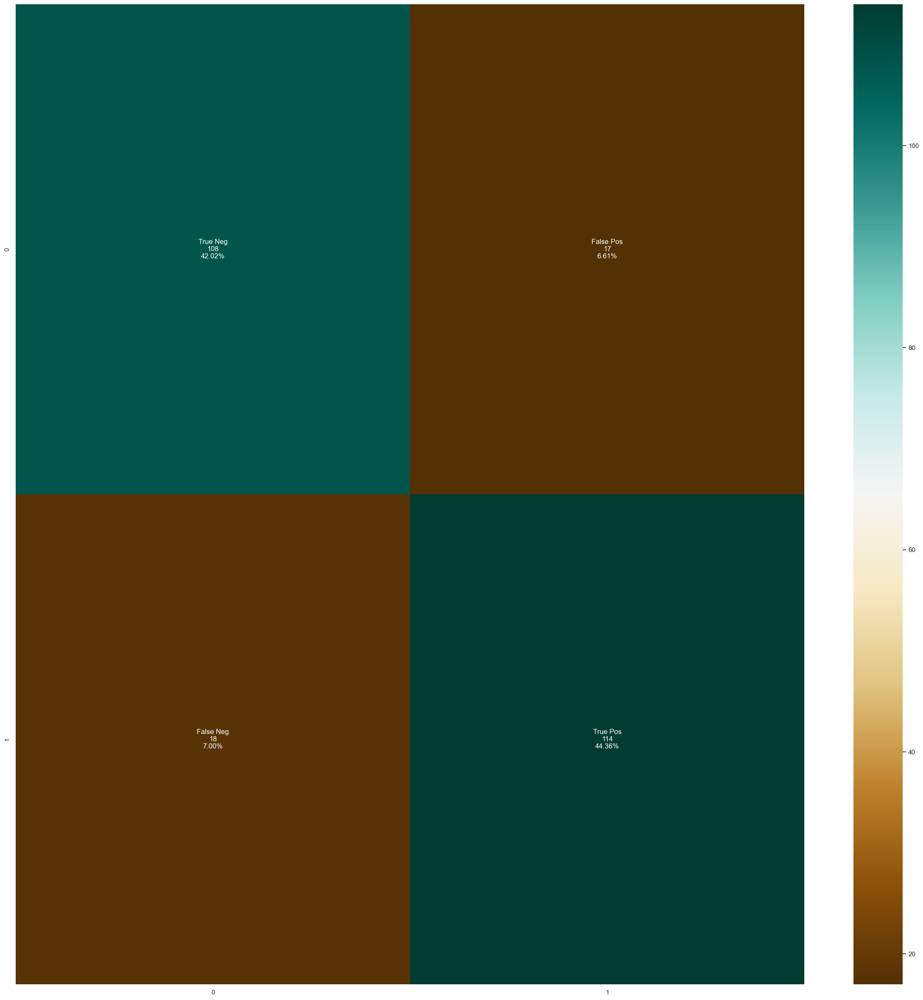

In [358]:
# balanced but not gridsearch applied
model_evaluation(classifier_dtbalanced)

# 3.Support Vector Classifier

In [130]:
from sklearn.svm import SVC

In [131]:
classifier_svc = SVC(kernel = 'linear',C = 0.1)

In [132]:
classifier_svcbalanced = SVC(kernel = 'linear',C = 0.1,class_weight='balanced')

In [133]:
parameter2 ={'C':[1, 10, 100],'gamma':[0.001, 0.0001],'kernel': ['linear','rbf']}

In [134]:
classifier_supervector=GridSearchCV(classifier_svcbalanced,param_grid=parameter2,scoring='accuracy',cv=cv)

In [135]:
classifier_svc.fit(xtrain,ytrain)

SVC(C=0.1, kernel='linear')

In [ ]:
classifier_supervector.fit(xtrain,ytrain)

In [ ]:
print(classifier_supervector.best_params_)

In [37]:
##prediction
y_pred2=classifier_supervector.predict(xtest)

In [38]:
print(classifier_supervector.best_score_)

0.8211462450592886


In [40]:
score=accuracy_score(y_pred2,ytest)
error=1-accuracy_score(y_pred2,ytest)
print(score)
print(error)

0.8421052631578947
0.1578947368421053


In [41]:
# imbalanced and via grid search
print(classification_report(y_pred2,ytest))

              precision    recall  f1-score   support

           0       0.77      0.87      0.82        31
           1       0.90      0.82      0.86        45

    accuracy                           0.84        76
   macro avg       0.84      0.85      0.84        76
weighted avg       0.85      0.84      0.84        76



Accuracy :  82.89%
Cross Validation Score :  89.29%
ROC_AUC Score :  82.47%
Error Rate:  17.11%


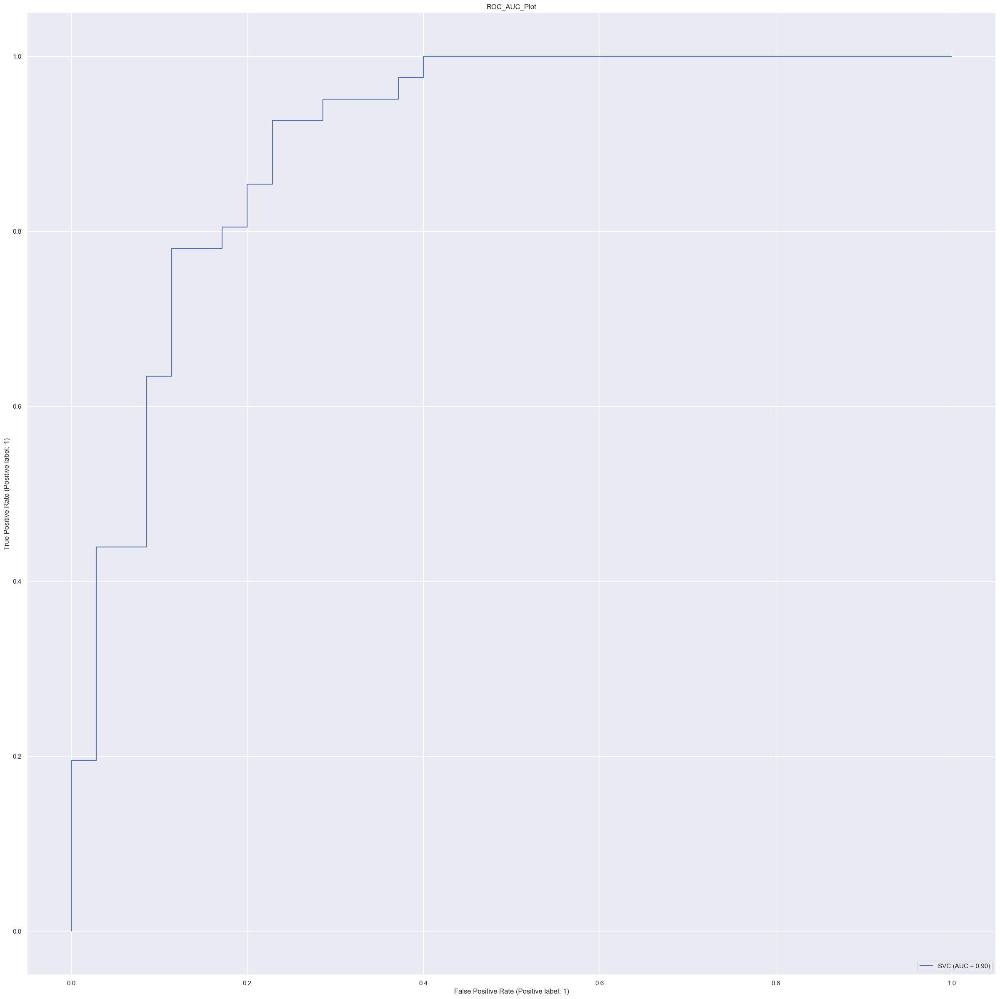

In [42]:
#balanced but no gridsearch hyperparameters applied
model(classifier_svcbalanced)

Accuracy :  84.21%
Cross Validation Score :  89.48%
ROC_AUC Score :  83.69%
Error Rate:  15.79%


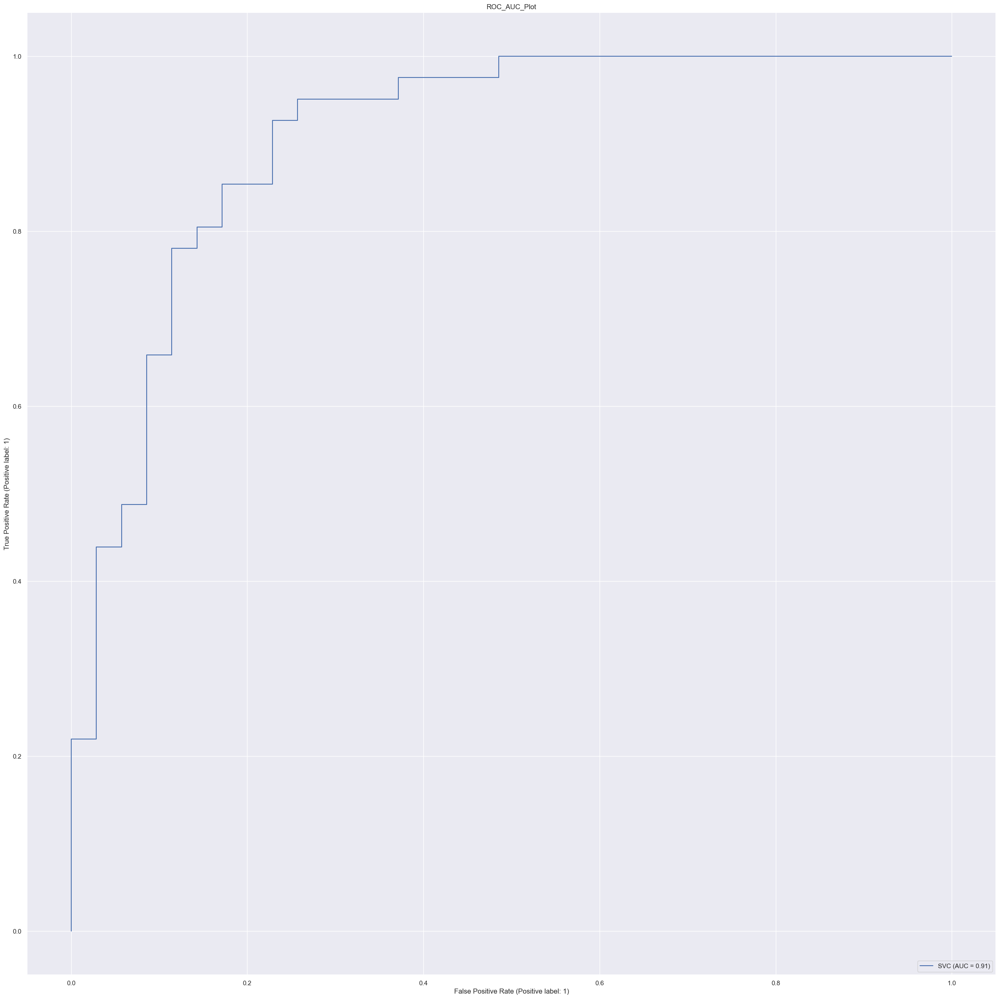

In [43]:
#not balanced and without grid search hyperparameters
model(classifier_svc)

              precision    recall  f1-score   support

           0       0.84      0.77      0.81        35
           1       0.82      0.88      0.85        41

    accuracy                           0.83        76
   macro avg       0.83      0.82      0.83        76
weighted avg       0.83      0.83      0.83        76



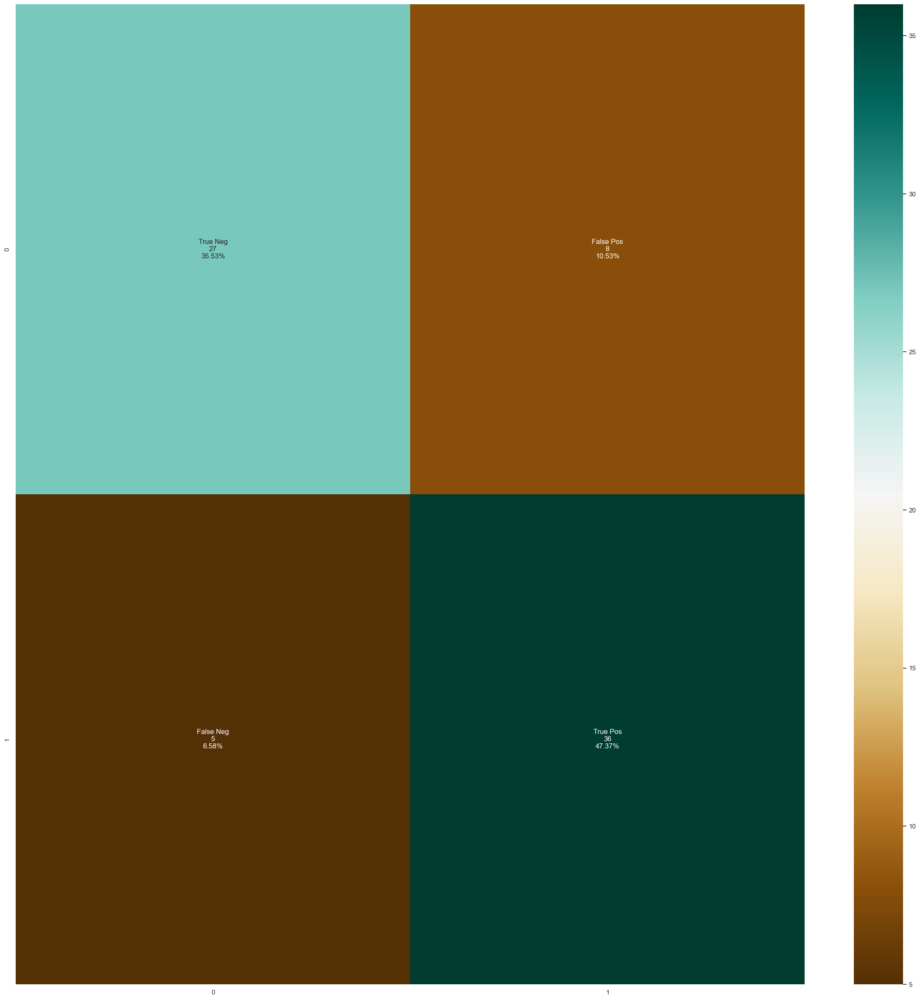

In [44]:
model_evaluation(classifier_svcbalanced)

              precision    recall  f1-score   support

           0       0.88      0.79      0.83       125
           1       0.82      0.89      0.86       132

    accuracy                           0.84       257
   macro avg       0.85      0.84      0.84       257
weighted avg       0.85      0.84      0.84       257



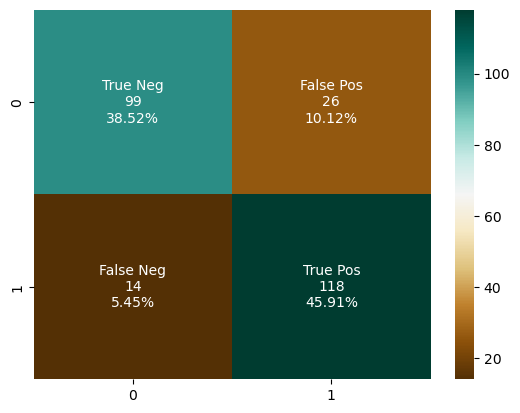

In [38]:
model_evaluation(classifier_svc)

              precision    recall  f1-score   support

           0       0.87      0.77      0.82        35
           1       0.82      0.90      0.86        41

    accuracy                           0.84        76
   macro avg       0.85      0.84      0.84        76
weighted avg       0.84      0.84      0.84        76



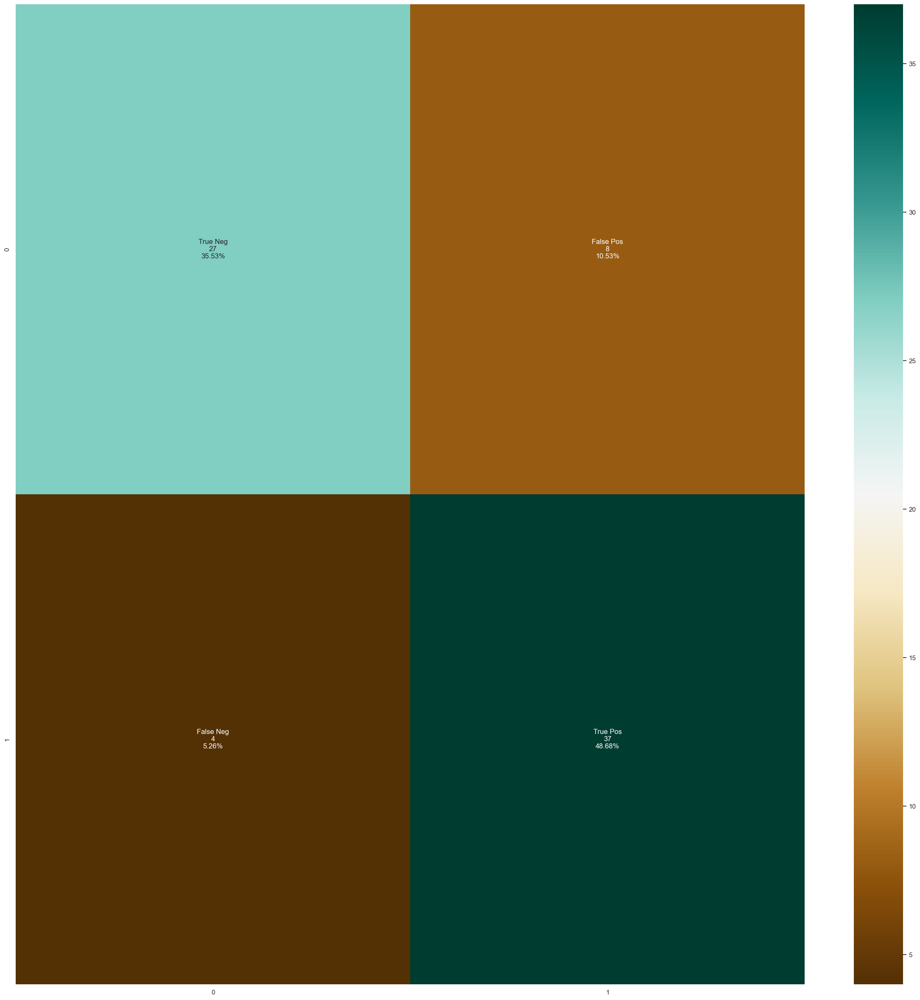

In [46]:
model_evaluation(classifier_supervector)

# 4.Random Forest Classifier

In [39]:
from sklearn.ensemble import RandomForestClassifier

In [40]:
classifier_rf = RandomForestClassifier(max_depth = 4,random_state = 0)

In [41]:
classifier_rf.fit(xtrain,ytrain)

RandomForestClassifier(max_depth=4, random_state=0)

In [368]:
classifier_rfbalanced = RandomForestClassifier(max_depth = 4,random_state = 0,class_weight='balanced')

In [369]:
n_estimators=[100]
max_features=['auto','sqrt']
max_depth=[2,4]
min_samples_leaf=[1,2]
bootstrap=[True,False]
min_samples_split=[2,5]

In [370]:
param_grid={'max_features':max_features,'max_depth':max_depth,'min_samples_leaf':min_samples_leaf,'bootstrap':bootstrap,'min_samples_split':min_samples_split}

In [371]:
randomtree=RandomForestClassifier(max_depth=2,n_estimators=100)
randomtree.fit(xtrain,ytrain)

RandomForestClassifier(max_depth=2)

In [372]:
classifier_randomsearch=GridSearchCV(classifier_rf,param_grid,scoring='accuracy',cv=cv)

In [373]:
classifier_randomsearch.fit(xtrain,ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=RandomForestClassifier(max_depth=4, random_state=0),
             param_grid={'bootstrap': [True, False], 'max_depth': [2, 4],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 5]},
             scoring='accuracy')

In [376]:
print(classifier_randomsearch.best_params_)

{'bootstrap': False, 'max_depth': 4, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 5}


In [377]:
##prediction
y_pred2=classifier_randomsearch.predict(xtest)

In [378]:
print(classifier_randomsearch.best_score_)

0.8806447938026886


In [379]:
score=accuracy_score(y_pred2,ytest)
print(score)

0.9182879377431906


In [380]:
# imbalanced and via grid search
print(classification_report(y_pred2,ytest))

              precision    recall  f1-score   support

           0       0.88      0.95      0.91       116
           1       0.95      0.89      0.92       141

    accuracy                           0.92       257
   macro avg       0.92      0.92      0.92       257
weighted avg       0.92      0.92      0.92       257



Accuracy :  91.44%
Cross Validation Score :  95.49%
ROC_AUC Score :  91.35%
Error Rate:  8.56%


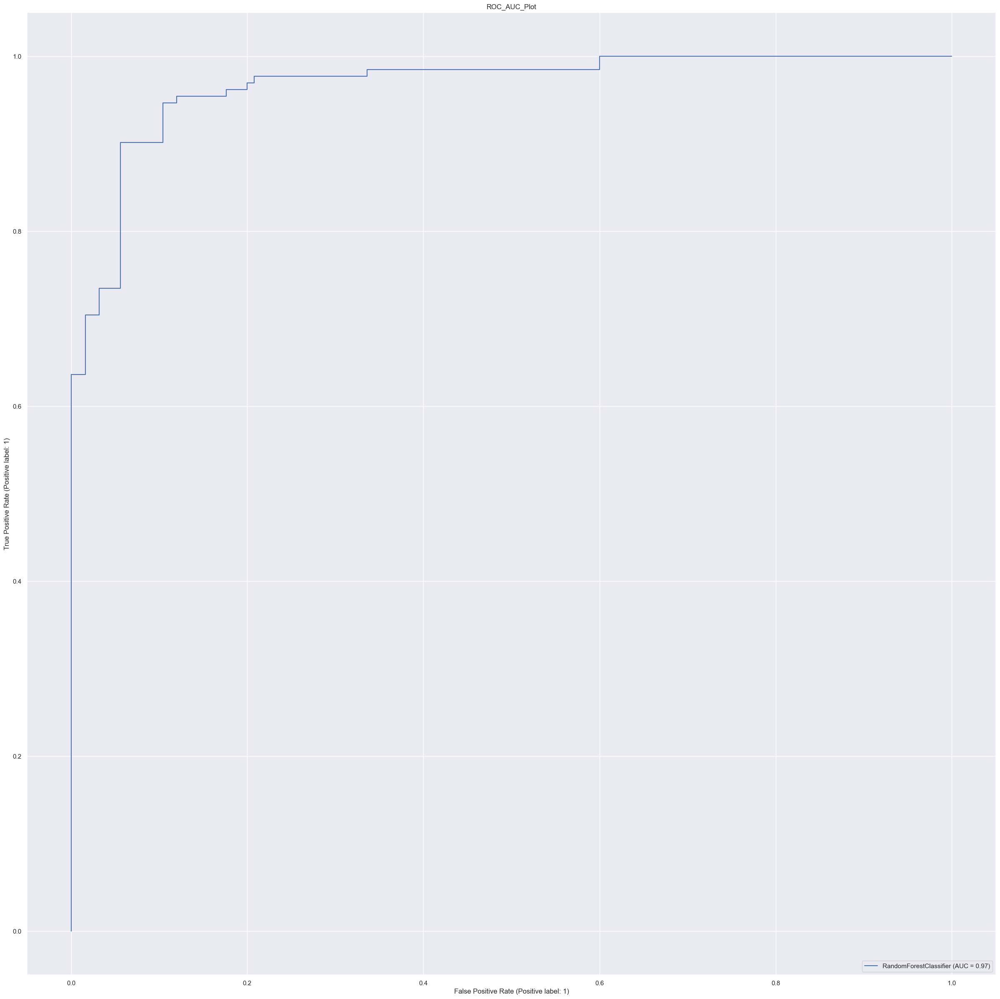

In [381]:
#balanced but no gridsearch hyperparameters applied
model(classifier_rfbalanced)

Accuracy :  91.05%
Cross Validation Score :  95.50%
ROC_AUC Score :  90.93%
Error Rate:  8.95%


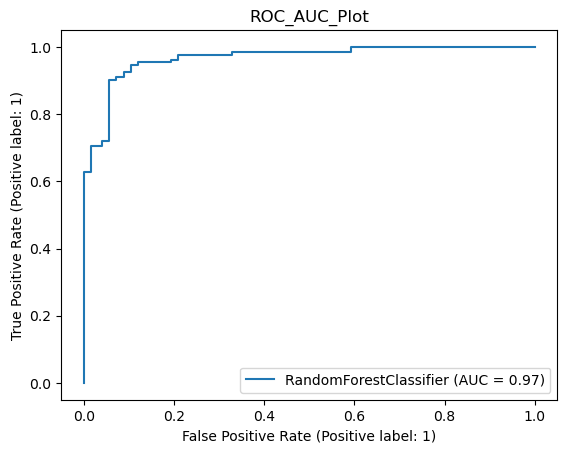

In [42]:
#not balanced and without grid search hyperparameters
model(classifier_rf)

              precision    recall  f1-score   support

           0       0.94      0.88      0.91       125
           1       0.89      0.95      0.92       132

    accuracy                           0.91       257
   macro avg       0.92      0.91      0.91       257
weighted avg       0.92      0.91      0.91       257



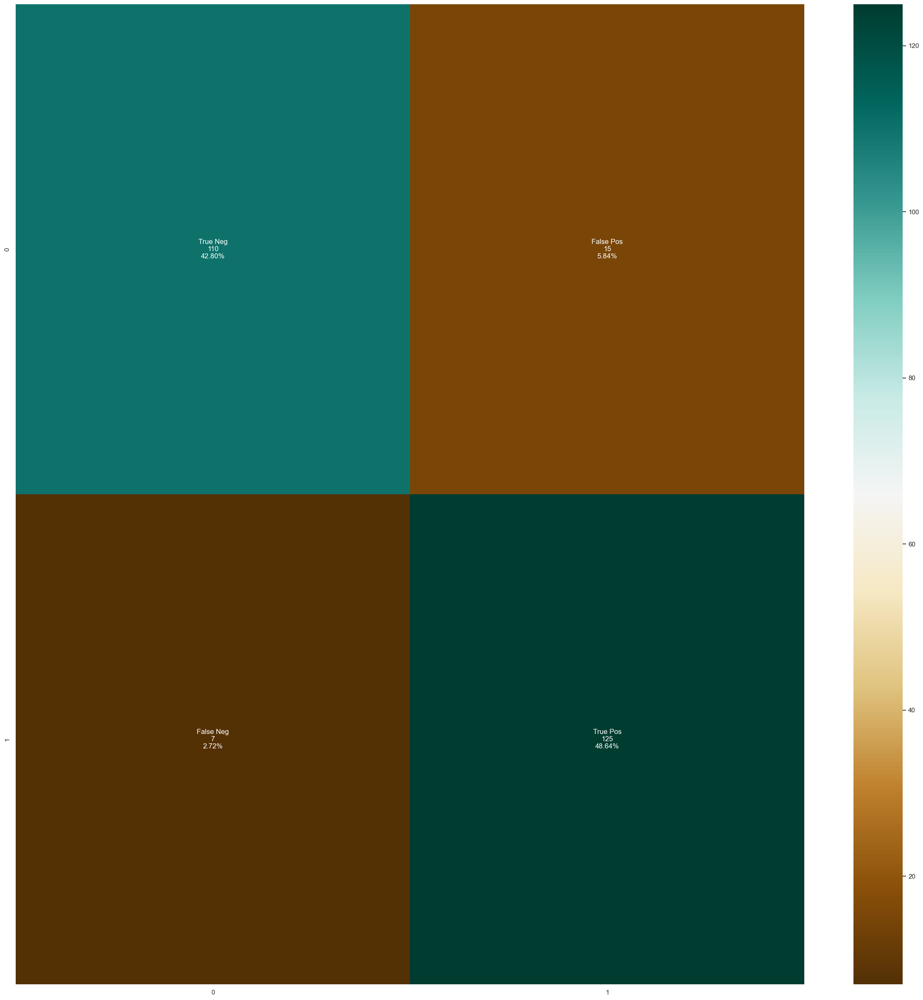

In [383]:
model_evaluation(classifier_rfbalanced)

              precision    recall  f1-score   support

           0       0.95      0.86      0.90       125
           1       0.88      0.95      0.92       132

    accuracy                           0.91       257
   macro avg       0.91      0.91      0.91       257
weighted avg       0.91      0.91      0.91       257



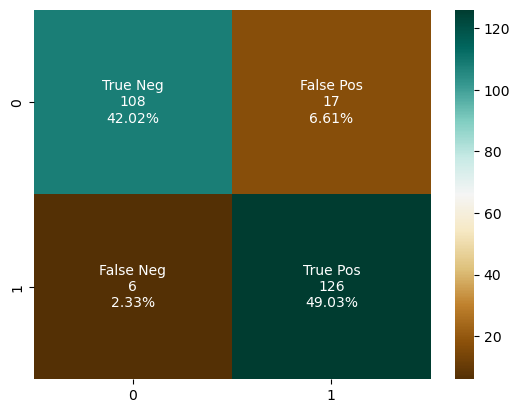

In [43]:
model_evaluation(classifier_rf)

              precision    recall  f1-score   support

           0       0.95      0.88      0.91       125
           1       0.89      0.95      0.92       132

    accuracy                           0.92       257
   macro avg       0.92      0.92      0.92       257
weighted avg       0.92      0.92      0.92       257



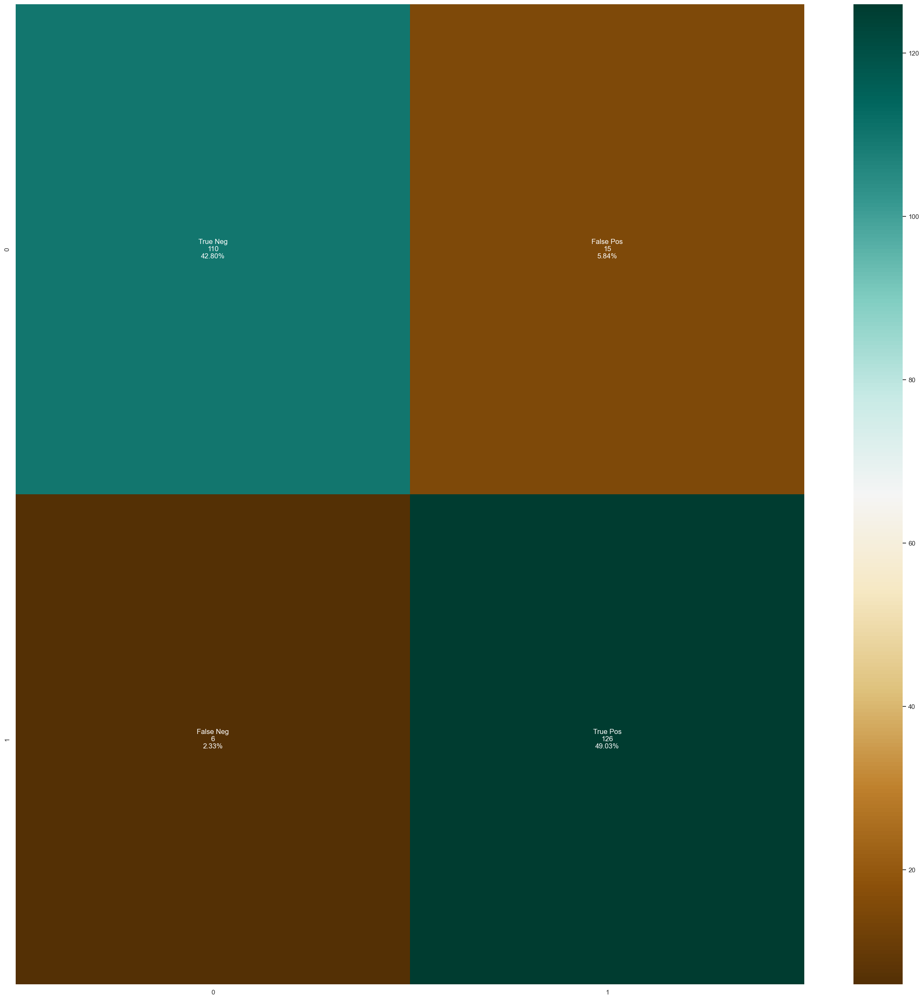

In [385]:
model_evaluation(classifier_randomsearch)

[Text(0.5, 0.8333333333333334, 'X[12] <= 2.5\ngini = 0.5\nsamples = 495\nvalue = [387, 381]'),
 Text(0.25, 0.5, 'X[1] <= 0.5\ngini = 0.423\nsamples = 286\nvalue = [135, 309]'),
 Text(0.125, 0.16666666666666666, 'gini = 0.324\nsamples = 122\nvalue = [40, 157]'),
 Text(0.375, 0.16666666666666666, 'gini = 0.473\nsamples = 164\nvalue = [95, 152]'),
 Text(0.75, 0.5, 'X[9] <= 0.7\ngini = 0.346\nsamples = 209\nvalue = [252, 72]'),
 Text(0.625, 0.16666666666666666, 'gini = 0.5\nsamples = 69\nvalue = [54, 52]'),
 Text(0.875, 0.16666666666666666, 'gini = 0.167\nsamples = 140\nvalue = [198, 20]')]

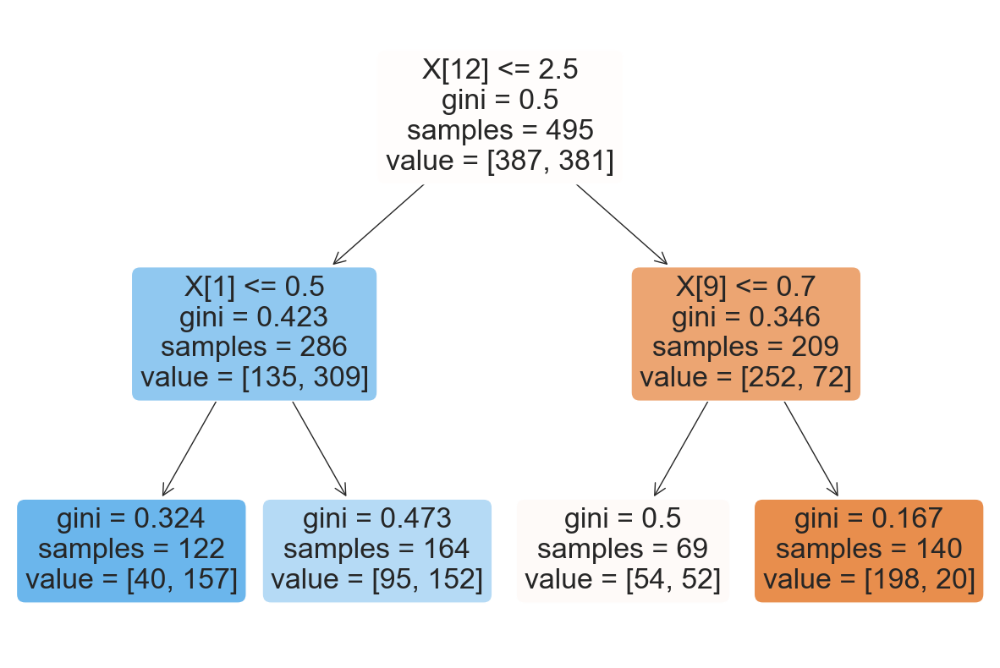

In [386]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

fig = plt.figure(figsize=(15, 10))
plot_tree(randomtree.estimators_[0], filled=True, impurity=True,rounded=True)

# 5.Naive Bayes

In [44]:
from sklearn.naive_bayes import GaussianNB

In [45]:
classifier_NB = GaussianNB()

Accuracy :  82.88%
Cross Validation Score :  90.02%
ROC_AUC Score :  82.87%
Error Rate:  17.12%


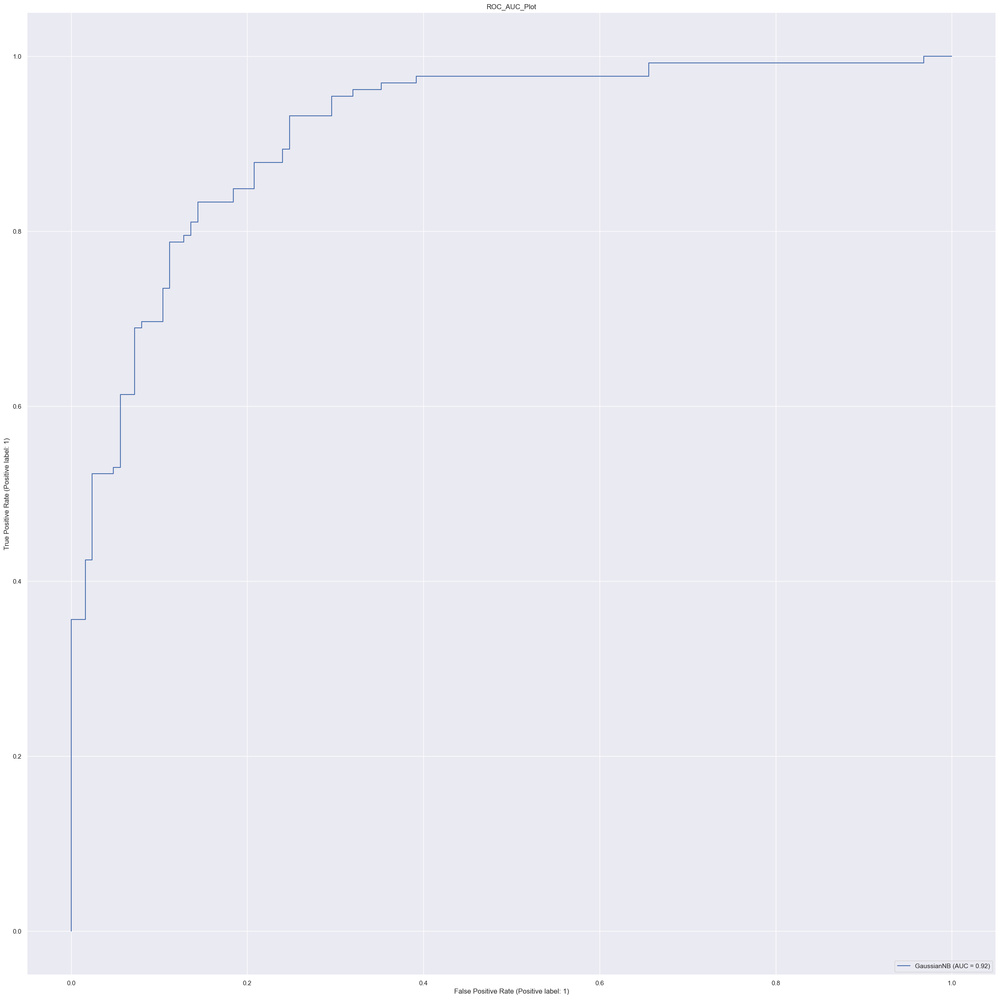

In [389]:
model(classifier_NB)

              precision    recall  f1-score   support

           0       0.82      0.82      0.82       125
           1       0.83      0.83      0.83       132

    accuracy                           0.83       257
   macro avg       0.83      0.83      0.83       257
weighted avg       0.83      0.83      0.83       257



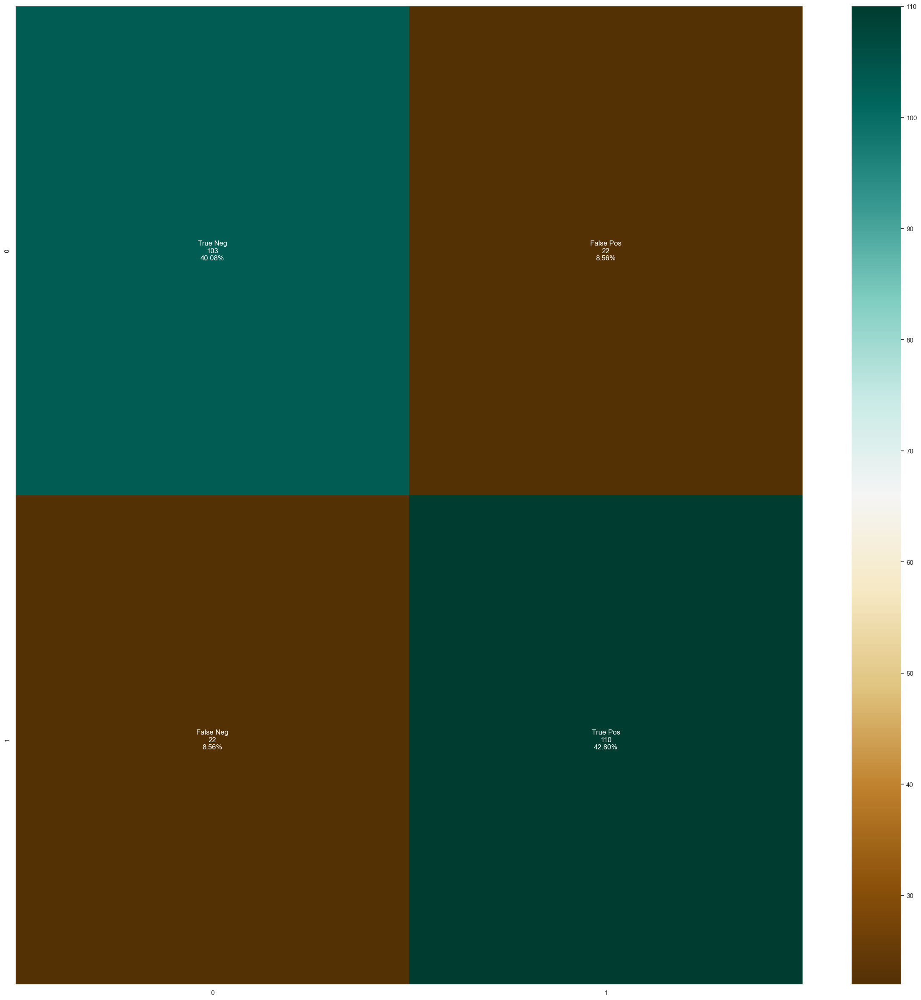

In [390]:
model_evaluation(classifier_NB)

# 6.AdaBoost Classifier
# 7.Gradient Classifier

In [82]:
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier

In [392]:
gb = GradientBoostingClassifier(random_state = 1)
ab=AdaBoostClassifier()

In [393]:
from scipy.stats import uniform as sp_randFloat
from scipy.stats import randint as sp_randInt

parameters={'learning_rate': [0.1,0.7],
            'subsample':[0.1,0.9],
            'n_estimators':[100,1000],
            'max_depth':[4,10]
           }

In [394]:
classifier_Gb=GridSearchCV(gb,param_grid=parameters,scoring='accuracy',cv=cv)

In [401]:
classifier_Gb.fit(xtrain,ytrain)

KeyboardInterrupt: 

In [125]:
print(classifier_Gb.best_params_)

{'learning_rate': 0.7, 'max_depth': 10, 'n_estimators': 100, 'subsample': 0.9}


In [126]:
print(classifier_Gb.best_score_)

0.7916996047430831


In [127]:
##prediction
y_pred1=classifier_Gb.predict(xtest)

In [128]:
score=accuracy_score(y_pred1,ytest)
error=1-accuracy_score(y_pred1,ytest)
print("accuracy is ",score)
print("error rate is",error)

accuracy is  0.7894736842105263
error rate is 0.21052631578947367


In [129]:
# imbalanced and via grid search
print(classification_report(y_pred1,ytest))

              precision    recall  f1-score   support

           0       0.77      0.77      0.77        35
           1       0.80      0.80      0.80        41

    accuracy                           0.79        76
   macro avg       0.79      0.79      0.79        76
weighted avg       0.79      0.79      0.79        76



              precision    recall  f1-score   support

           0       0.77      0.77      0.77        35
           1       0.80      0.80      0.80        41

    accuracy                           0.79        76
   macro avg       0.79      0.79      0.79        76
weighted avg       0.79      0.79      0.79        76



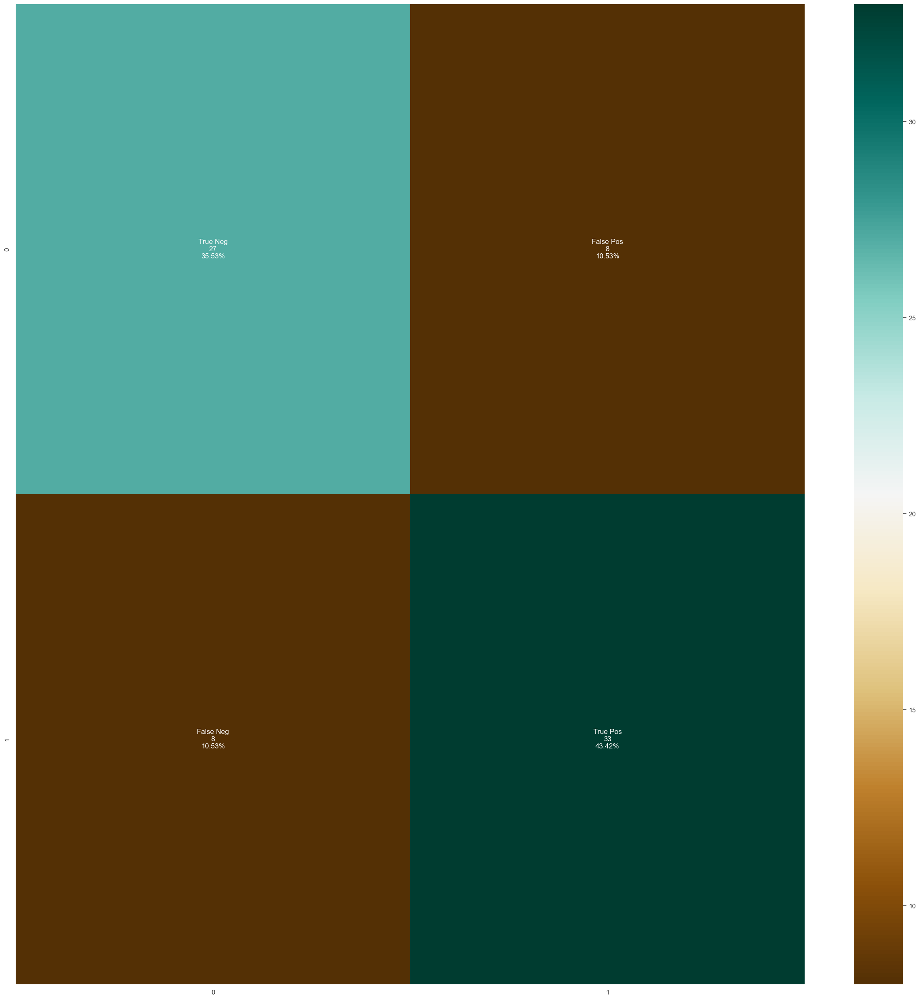

In [130]:
model_evaluation(classifier_Gb)

Accuracy :  96.50%
Cross Validation Score :  99.38%
ROC_AUC Score :  96.48%
Error Rate:  3.50%


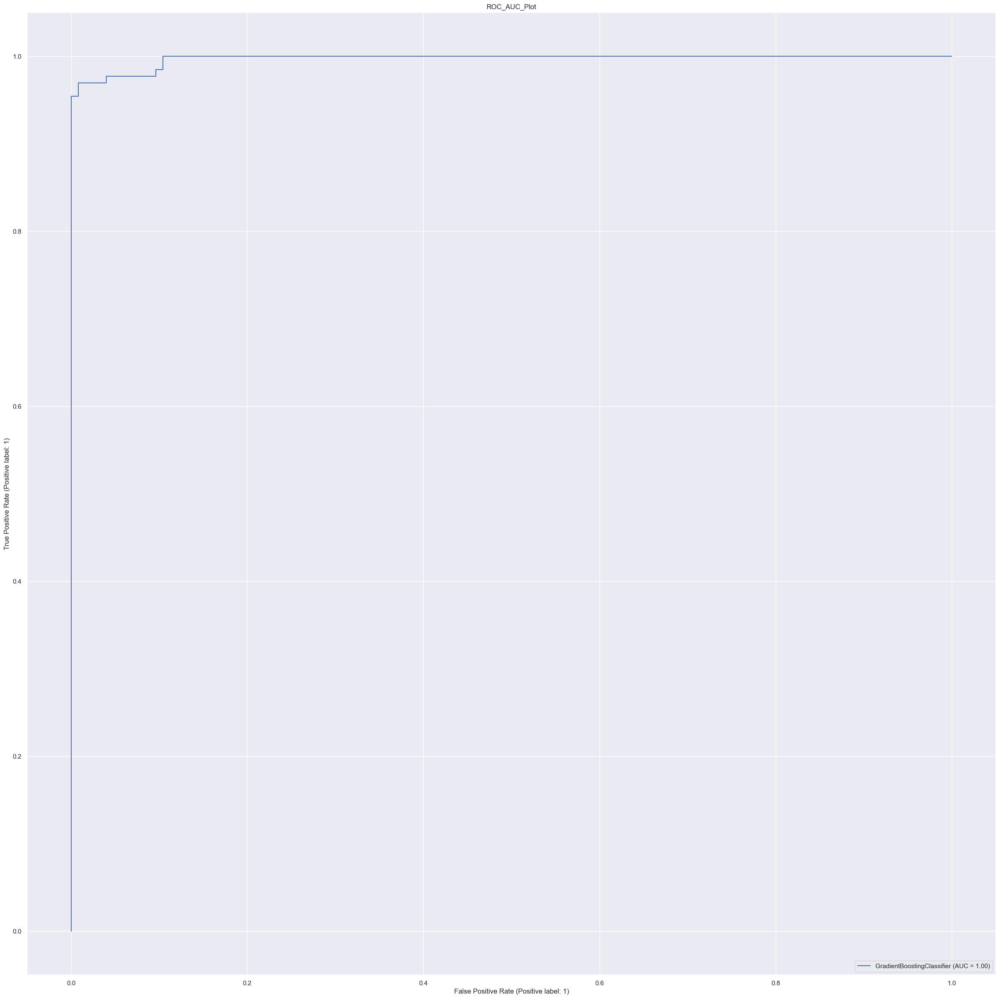

In [396]:
model(gb)

Accuracy :  89.88%
Cross Validation Score :  96.28%
ROC_AUC Score :  89.90%
Error Rate:  10.12%


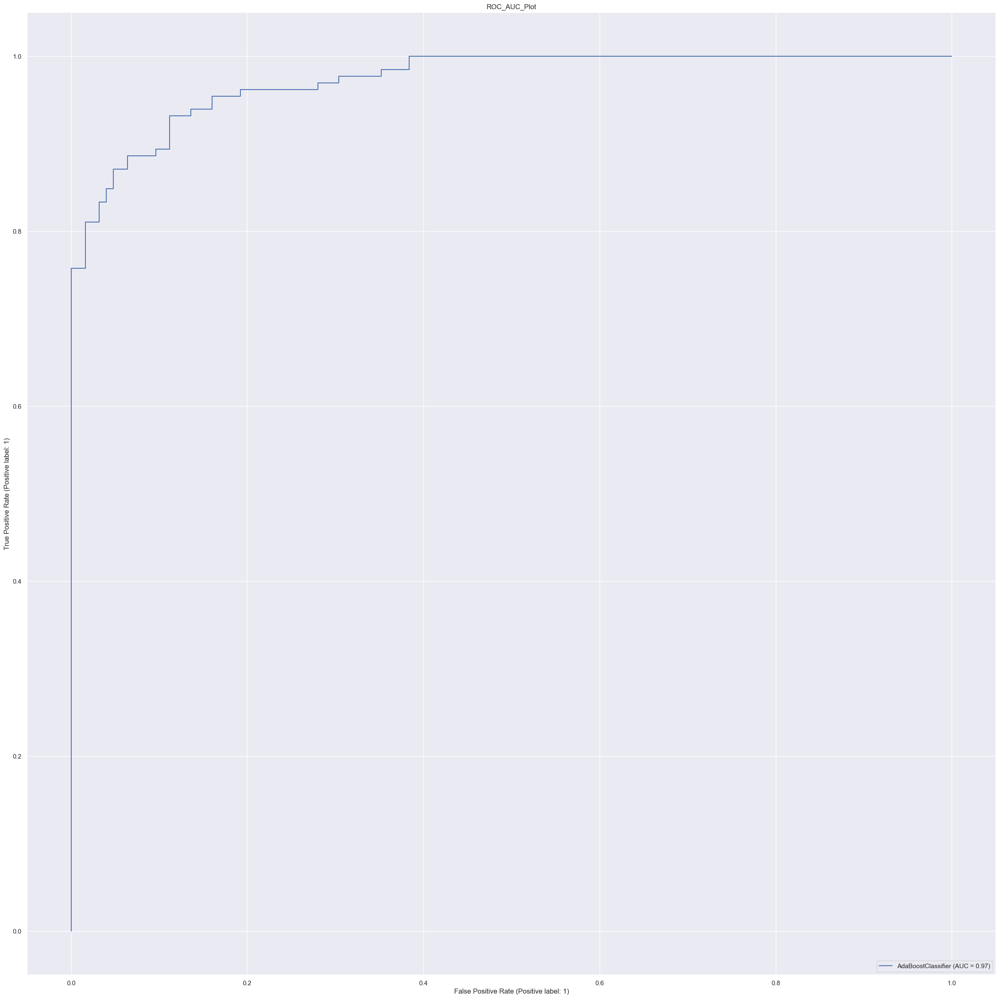

In [397]:
model(ab)

              precision    recall  f1-score   support

           0       0.97      0.96      0.96       125
           1       0.96      0.97      0.97       132

    accuracy                           0.96       257
   macro avg       0.97      0.96      0.96       257
weighted avg       0.97      0.96      0.96       257



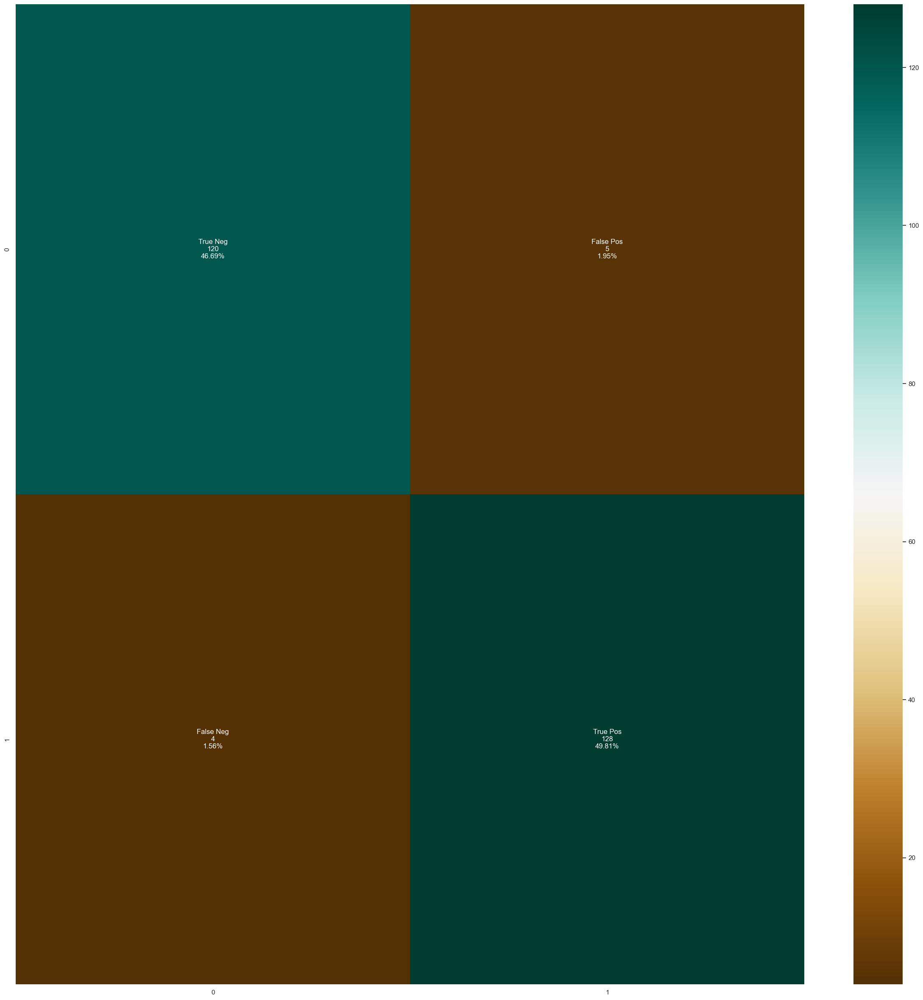

In [398]:
model_evaluation(gb)

              precision    recall  f1-score   support

           0       0.89      0.90      0.90       125
           1       0.91      0.89      0.90       132

    accuracy                           0.90       257
   macro avg       0.90      0.90      0.90       257
weighted avg       0.90      0.90      0.90       257



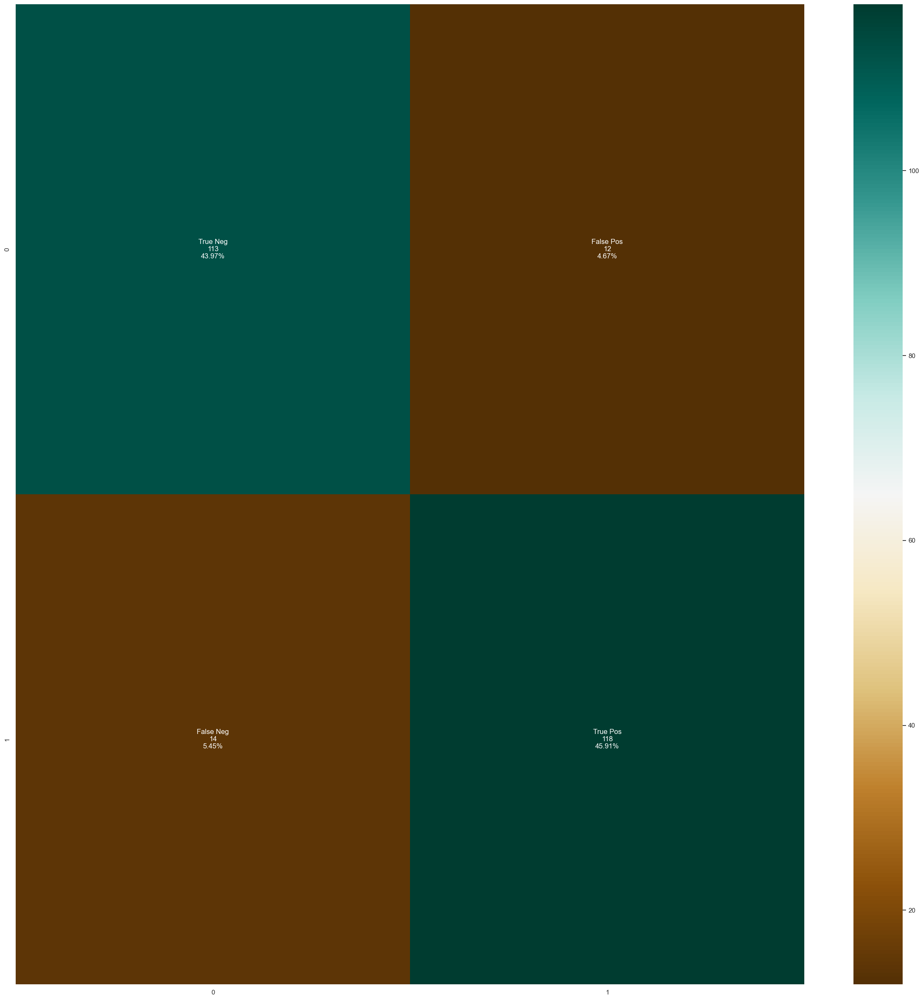

In [399]:
model_evaluation(ab)

# Particle Swarm Optimization

In [46]:
from sklearn.svm import SVC
from niapy.problems import Problem
from niapy.task import Task
from niapy.algorithms.basic import ParticleSwarmOptimization

In [47]:
X_new=dataset.drop(columns=['target'])
y_new=dataset['target']

In [48]:
X=X_new.to_numpy()
y=y_new.to_numpy()

In [49]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=1234)

In [50]:
class FeatureSelection(Problem):
    def __init__(self, X_train, y_train, alpha=0.99):
        super().__init__(dimension=X_train.shape[1], lower=0, upper=1)
        self.X_train = X_train
        self.y_train = y_train
       # self.alpha = alpha

    def _evaluate(self, x):
        selected = x > 0.5
        num_selected = selected.sum()
        if num_selected == 0:
            return 1.0
       # accuracy = cross_val_score(SVC(), self.X_train[:, selected], self.y_train, cv=2, n_jobs=-1).mean()
        #score = 1 - accuracy
        num_features = self.X_train.shape[1]
        return num_features
       # return self.alpha * score + (1 - self.alpha) * (num_selected / num_features)

In [51]:
problem = FeatureSelection(X_train, y_train)
task = Task(problem, max_iters=100)
algorithm = ParticleSwarmOptimization( population_size=10, limit=100,seed=1234)
best_features, best_fitness = algorithm.run(task)

In [52]:
dataset_features=dataset.drop(columns=['target'])
best_features

array([0.97669977, 0.38019574, 0.92324623, 0.26169242, 0.31909706,
       0.11809123, 0.24176629, 0.31853393, 0.96407925, 0.2636498 ,
       0.44100612, 0.60987081, 0.8636213 ])

In [53]:
feature_names=dataset_features.columns.to_numpy()

In [54]:
selected_features = best_features > 0.5
print('Number of selected features:', selected_features.sum())

print('Selected features:', ', '.join(feature_names[selected_features].tolist()))

print(selected_features)

Number of selected features: 5
Selected features: age, cp, exang, ca, thal
[ True False  True False False False False False  True False False  True
  True]


In [55]:
df=dataset[['age','cp','exang','ca','thal','target']].copy()

In [56]:
df

,age,cp,exang,ca,thal,target
0,-0.268437,-0.915755,0,1.209221,1.089852,0
1,-0.158157,-0.915755,1,-0.731971,1.089852,0
2,1.716595,-0.915755,1,-0.731971,1.089852,0
3,0.724079,-0.915755,0,0.238625,1.089852,0
4,0.834359,-0.915755,0,2.179817,-0.522122,0
...,...,...,...,...,...,...
1020,0.503520,0.055931,1,-0.731971,-0.522122,1
1021,0.613800,-0.915755,1,0.238625,1.089852,0
1022,-0.819834,-0.915755,1,0.238625,-0.522122,0
1023,-0.488996,-0.915755,0,-0.731971,-0.522122,1


In [57]:
from sklearn.model_selection import train_test_split, GridSearchCV
x = df.drop('target', axis = 1)
Y = df['target']
Xtrain, Xtest, Ytrain, Ytest = train_test_split(x, Y, test_size = 0.25, stratify = Y, random_state = 0)

# Model creation after PSO Algorithm

In [58]:
def model(classifier):
    
    classifier.fit(Xtrain,Ytrain)
    prediction = classifier.predict(Xtest)
    cv = RepeatedStratifiedKFold(n_splits = 10,n_repeats = 3,random_state = 1)
    print("Accuracy : ",'{0:.2%}'.format(accuracy_score(Ytest,prediction)))
    print("Cross Validation Score : ",'{0:.2%}'.format(cross_val_score(classifier,Xtrain,Ytrain,cv = cv,scoring = 'roc_auc').mean()))
    print("ROC_AUC Score : ",'{0:.2%}'.format(roc_auc_score(Ytest,prediction)))
    plot_roc_curve(classifier, Xtest,Ytest)
    plt.title('ROC_AUC_Plot')
    plt.show()

    
def model_evaluation(classifier):
    
    # Confusion Matrix
    cm = confusion_matrix(Ytest,classifier.predict(Xtest))
    names = ['True Neg','False Pos','False Neg','True Pos']
    counts = [value for value in cm.flatten()]
    percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(names,counts,percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cm,annot = labels,cmap ='BrBG' ,fmt ='')
    
    # Classification Report
    print(classification_report(Ytest,classifier.predict(Xtest)))



In [59]:
# normal logistic regression
classifier_lrbal= LogisticRegression(random_state = 0,C=20,penalty= 'l2',solver='newton-cg',class_weight='balanced')

In [74]:
classifier=LogisticRegression(random_state = 10,C=20,penalty= 'l2',solver='newton-cg')

In [72]:
parameter={'penalty':['l1','l2','elasticnet'],'C':[1,2,3,4,5,6,10,20,30,40,50],'max_iter':[100,200,300],'solver':['newton-cg','lbfgs','liblinear']}

In [62]:
classifier_regressor=GridSearchCV(classifier,param_grid=parameter,scoring='accuracy',cv=cv)

In [419]:
classifier_regressor.fit(Xtrain,Ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=LogisticRegression(),
             param_grid={'C': [1, 2, 3, 4, 5, 6, 10, 20, 30, 40, 50],
                         'max_iter': [100, 200, 300],
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear']},
             scoring='accuracy')

In [420]:
print(classifier_regressor.best_params_)

{'C': 3, 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear'}


In [421]:
print(classifier_regressor.best_score_)

0.7638869902027798


In [422]:
##prediction
y_pred=classifier_regressor.predict(Xtest)

In [423]:
score=accuracy_score(y_pred,Ytest)
print(score)

0.8132295719844358


In [424]:
# imbalanced and via grid search
print(classification_report(y_pred,Ytest))

              precision    recall  f1-score   support

           0       0.76      0.84      0.80       113
           1       0.86      0.79      0.83       144

    accuracy                           0.81       257
   macro avg       0.81      0.82      0.81       257
weighted avg       0.82      0.81      0.81       257



In [508]:
model(classifier_regressor)

Accuracy :  81.32%


KeyboardInterrupt: 

Accuracy :  81.32%
Cross Validation Score :  85.95%
ROC_AUC Score :  81.18%


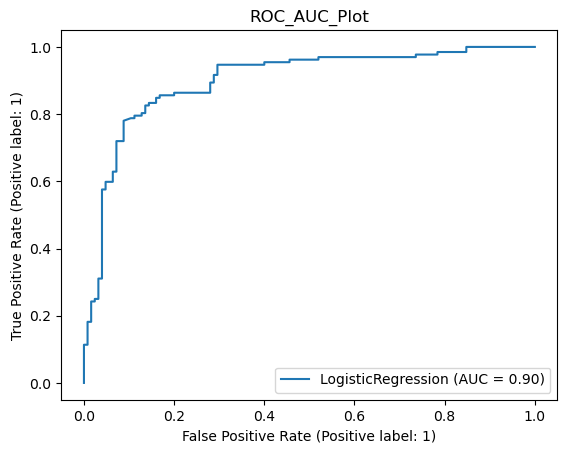

In [75]:
model(classifier)

Accuracy :  81.71%
Cross Validation Score :  85.95%
ROC_AUC Score :  81.58%


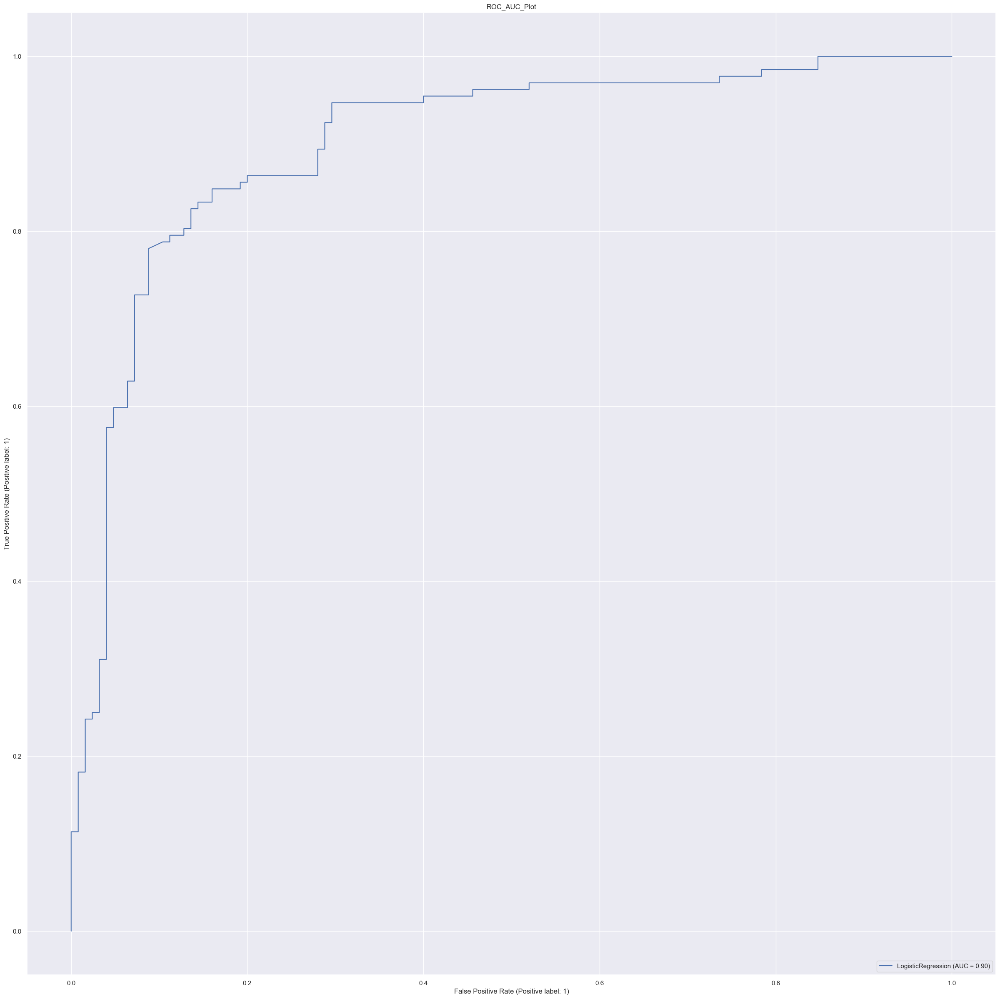

In [429]:
model(classifier_lrbal)

              precision    recall  f1-score   support

           0       0.84      0.76      0.80       125
           1       0.79      0.86      0.83       132

    accuracy                           0.81       257
   macro avg       0.82      0.81      0.81       257
weighted avg       0.82      0.81      0.81       257



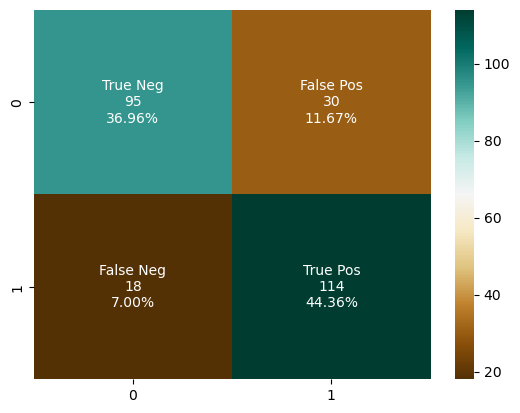

In [76]:
model_evaluation(classifier)

              precision    recall  f1-score   support

           0       0.84      0.77      0.80       125
           1       0.80      0.86      0.83       132

    accuracy                           0.82       257
   macro avg       0.82      0.82      0.82       257
weighted avg       0.82      0.82      0.82       257



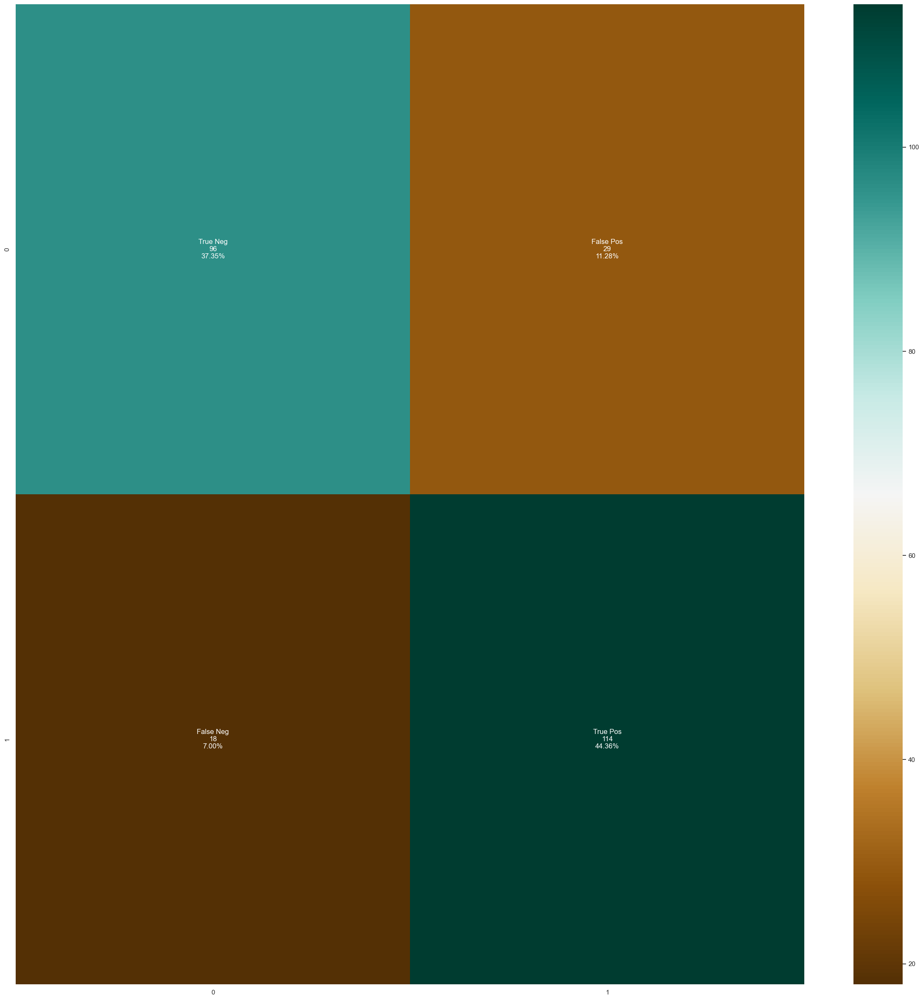

In [433]:
model_evaluation(classifier_lrbal)

              precision    recall  f1-score   support

           0       0.84      0.76      0.80       125
           1       0.79      0.86      0.83       132

    accuracy                           0.81       257
   macro avg       0.82      0.81      0.81       257
weighted avg       0.82      0.81      0.81       257



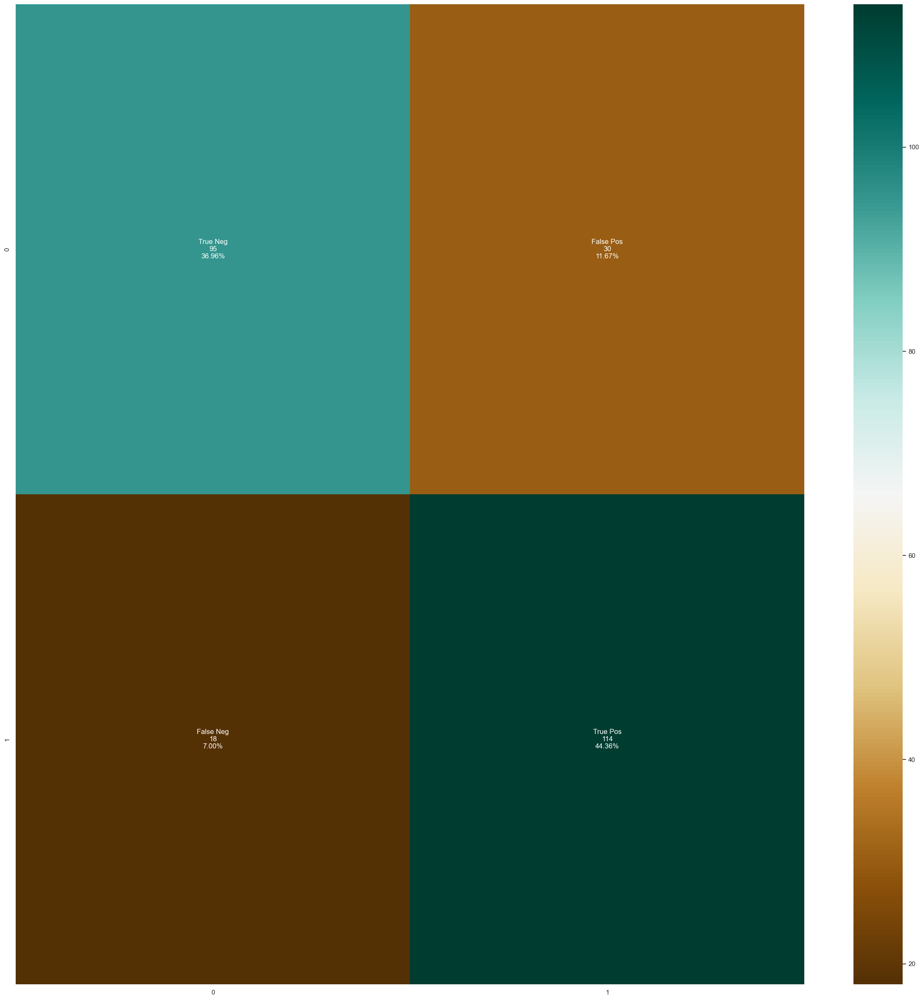

In [434]:
model_evaluation(classifier_regressor)

In [77]:
classifier_dtbalanced = DecisionTreeClassifier(random_state = 1000,max_depth = 4,min_samples_leaf = 1,class_weight='balanced')

In [78]:
classifier1=DecisionTreeClassifier()

In [438]:
parameter1 ={'criterion':['gini','entropy','log_loss'],'splitter':['best','random'],'max_depth':[1,2,3,4,5],'max_features':['auto', 'sqrt', 'log2']}

In [439]:
classifier_decisiontree=GridSearchCV(classifier1,param_grid=parameter1,scoring='accuracy',cv=cv)

In [440]:
classifier_decisiontree.fit(Xtrain,Ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [1, 2, 3, 4, 5],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'splitter': ['best', 'random']},
             scoring='accuracy')

In [441]:
print(classifier_decisiontree.best_params_)

{'criterion': 'entropy', 'max_depth': 5, 'max_features': 'auto', 'splitter': 'best'}


In [442]:
print(classifier_decisiontree.best_score_)

0.8350535429482797


In [443]:
##prediction
y_pred1=classifier_decisiontree.predict(Xtest)

In [444]:
score=accuracy_score(y_pred1,ytest)
error=1-accuracy_score(y_pred1,ytest)
print("accuracy is ",score)
print("error rate is",error)

accuracy is  0.8715953307392996
error rate is 0.12840466926070038


In [445]:
# imbalanced and via grid search
print(classification_report(y_pred1,ytest))

              precision    recall  f1-score   support

           0       0.80      0.93      0.86       108
           1       0.94      0.83      0.88       149

    accuracy                           0.87       257
   macro avg       0.87      0.88      0.87       257
weighted avg       0.88      0.87      0.87       257



Accuracy :  87.16%
Cross Validation Score :  89.72%
ROC_AUC Score :  87.22%


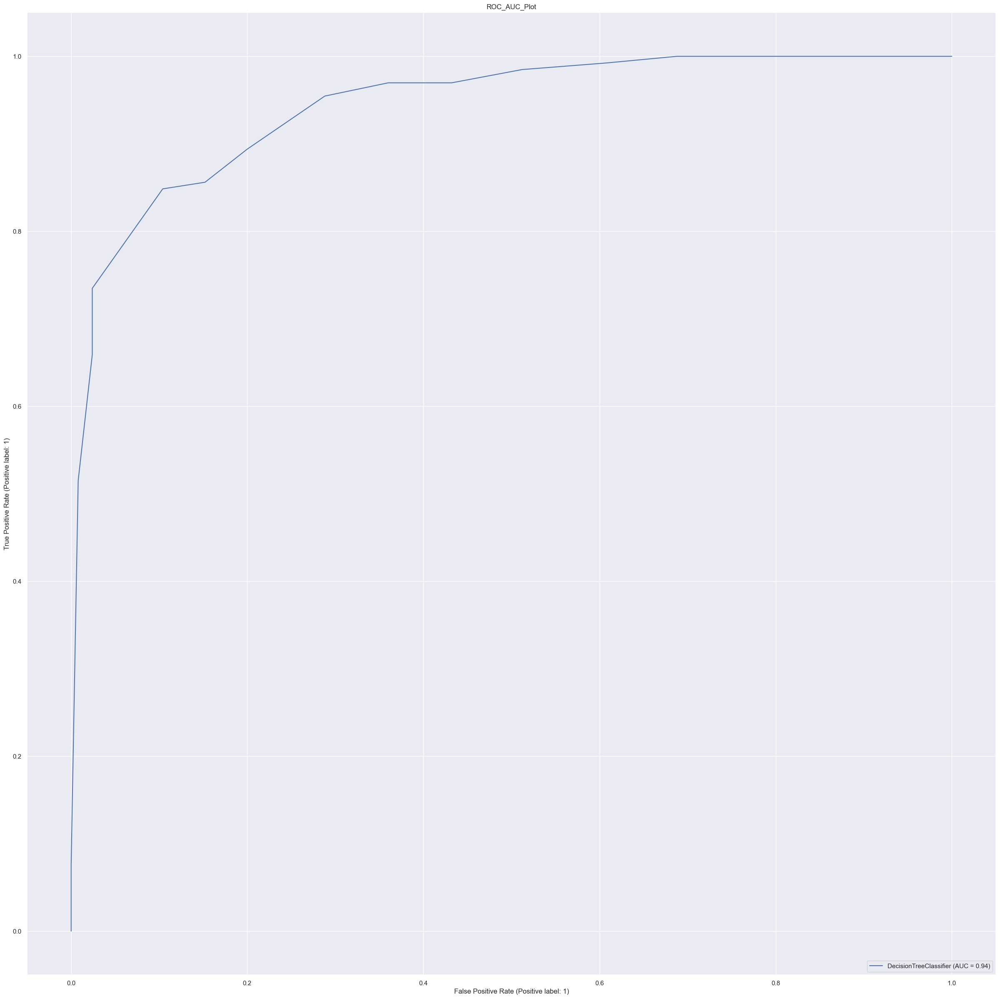

In [446]:
#balanced but no gridsearch hyperparameters applied
model(classifier_dtbalanced)

Accuracy :  98.05%
Cross Validation Score :  98.65%
ROC_AUC Score :  98.04%


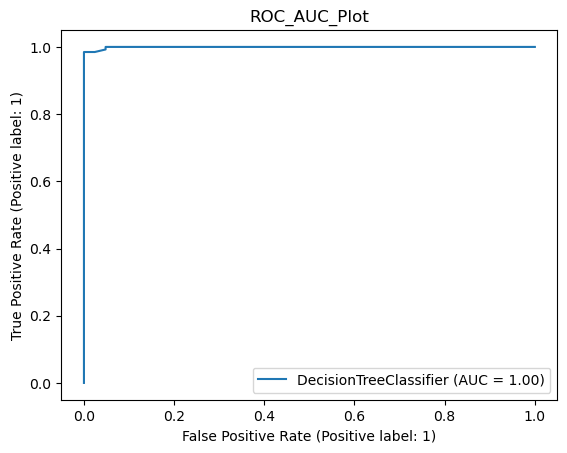

In [79]:
#not balanced and without grid search hyperparameters
model(classifier1)

              precision    recall  f1-score   support

           0       0.85      0.90      0.87       125
           1       0.90      0.85      0.87       132

    accuracy                           0.87       257
   macro avg       0.87      0.87      0.87       257
weighted avg       0.87      0.87      0.87       257



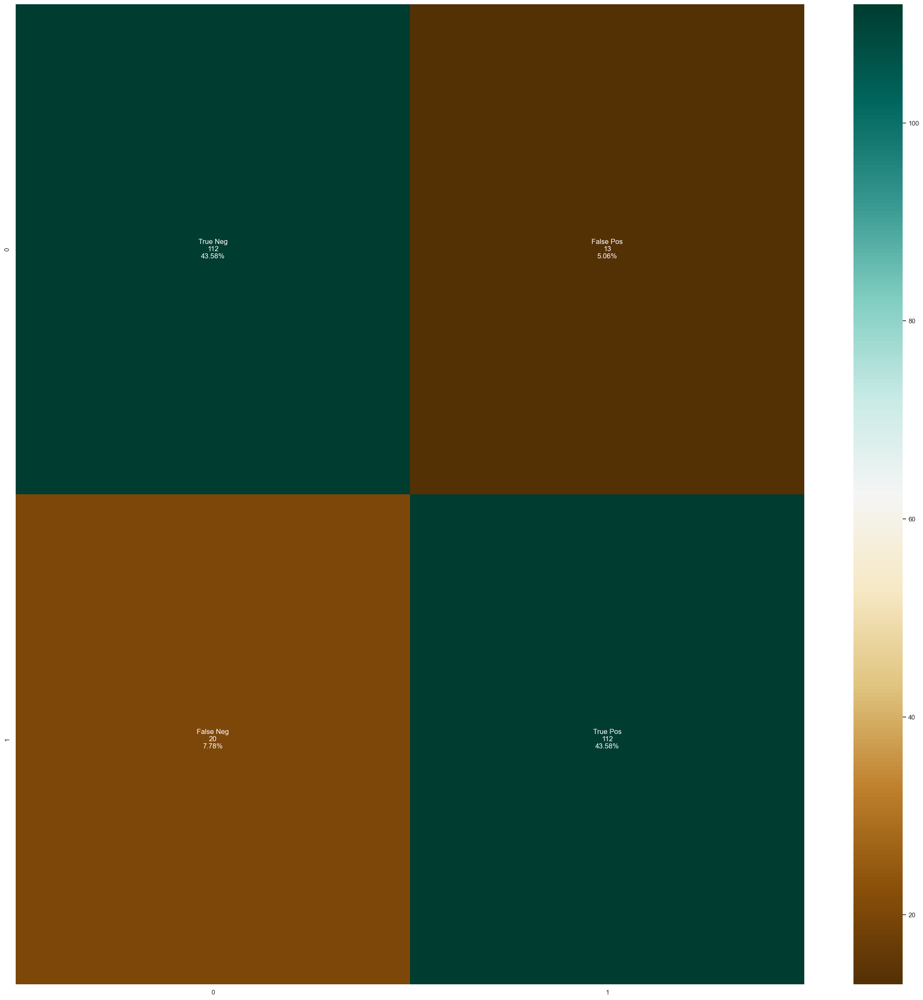

In [452]:
model_evaluation(classifier_dtbalanced)

In [453]:
classifier_svcbalanced = SVC(kernel = 'linear',C = 0.1,class_weight='balanced')

Accuracy :  83.66%
Cross Validation Score :  85.20%
ROC_AUC Score :  83.56%


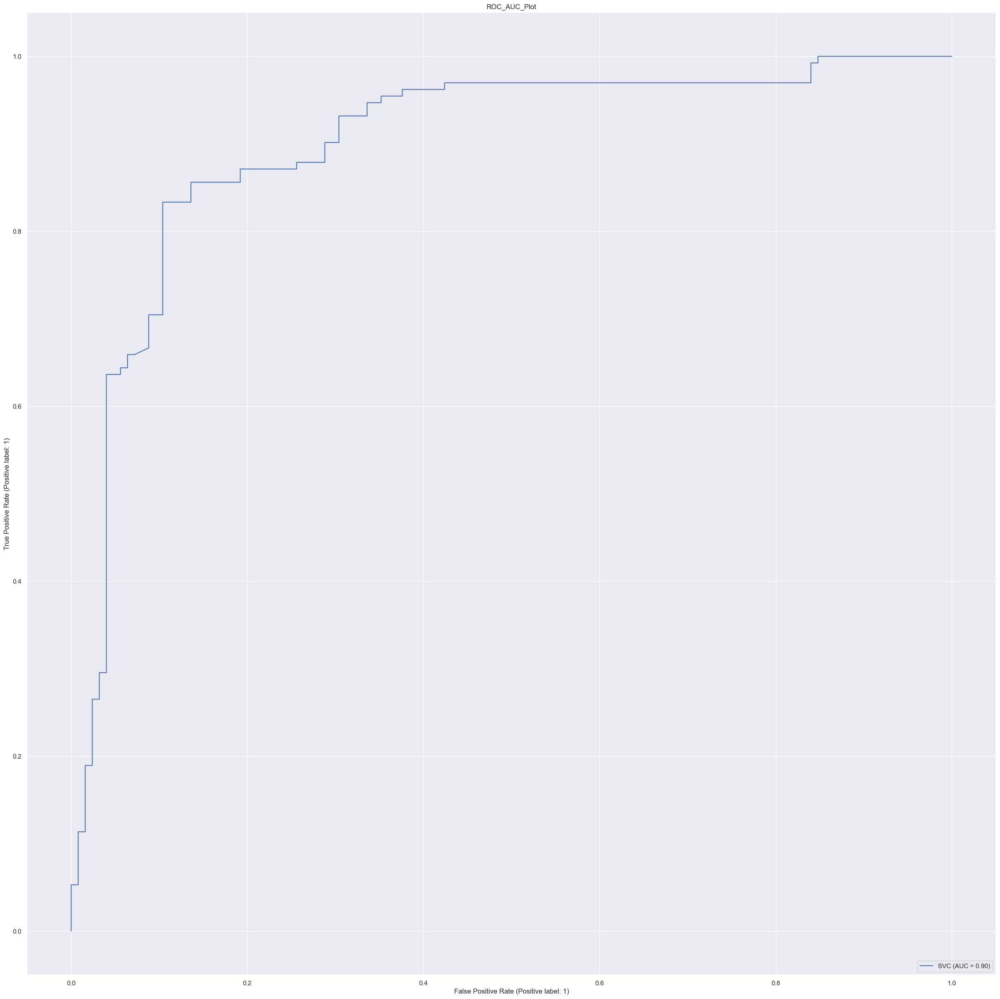

In [454]:
model(classifier_svcbalanced)

In [455]:
classifier_svc = SVC(kernel = 'linear',C = 0.1)

In [456]:
parameter2 ={'C':[1, 10, 100],'gamma':[0.001, 0.0001],'kernel': ['linear','rbf']}

In [457]:
classifier_supervector=GridSearchCV(classifier_svc,param_grid=parameter2,scoring='accuracy',cv=cv)

In [458]:
classifier_supervector.fit(Xtrain,Ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=SVC(C=0.1, kernel='linear'),
             param_grid={'C': [1, 10, 100], 'gamma': [0.001, 0.0001],
                         'kernel': ['linear', 'rbf']},
             scoring='accuracy')

In [459]:
print(classifier_supervector.best_params_)

{'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}


In [460]:
##prediction
y_pred2=classifier_supervector.predict(Xtest)

In [461]:
print(classifier_supervector.best_score_)

0.7817099567099567


In [462]:
score=accuracy_score(y_pred2,Ytest)
error=1-accuracy_score(y_pred1,Ytest)
print(score)
print(error)

0.8365758754863813
0.12840466926070038


In [463]:
# imbalanced and via grid search
print(classification_report(y_pred2,ytest))

              precision    recall  f1-score   support

           0       0.80      0.85      0.83       117
           1       0.87      0.82      0.85       140

    accuracy                           0.84       257
   macro avg       0.84      0.84      0.84       257
weighted avg       0.84      0.84      0.84       257



Accuracy :  83.66%
Cross Validation Score :  85.34%
ROC_AUC Score :  83.56%


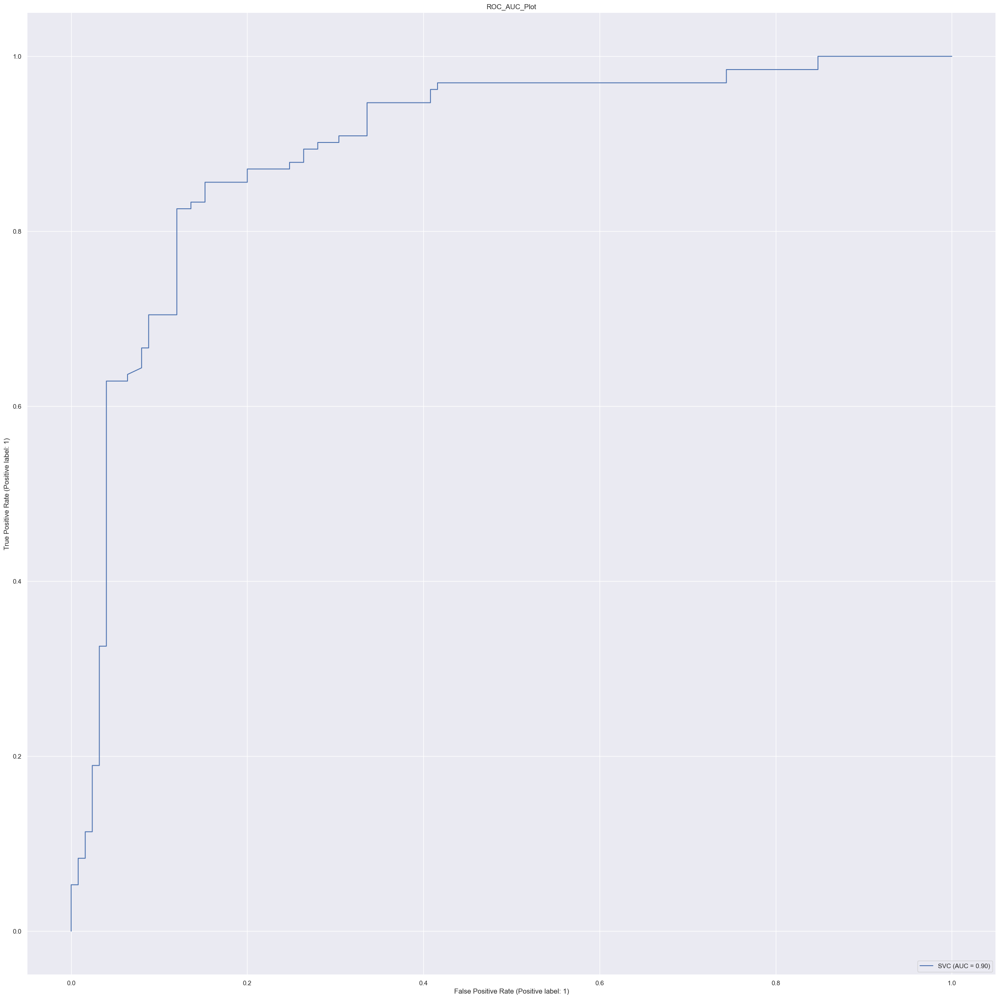

In [464]:
#not balanced and without grid search hyperparameters
model(classifier_svc)

In [102]:
model(classifier_svcbalanced)

NameError: name 'classifier_svcbalanced' is not defined

              precision    recall  f1-score   support

           0       0.85      0.80      0.83       125
           1       0.82      0.87      0.85       132

    accuracy                           0.84       257
   macro avg       0.84      0.84      0.84       257
weighted avg       0.84      0.84      0.84       257



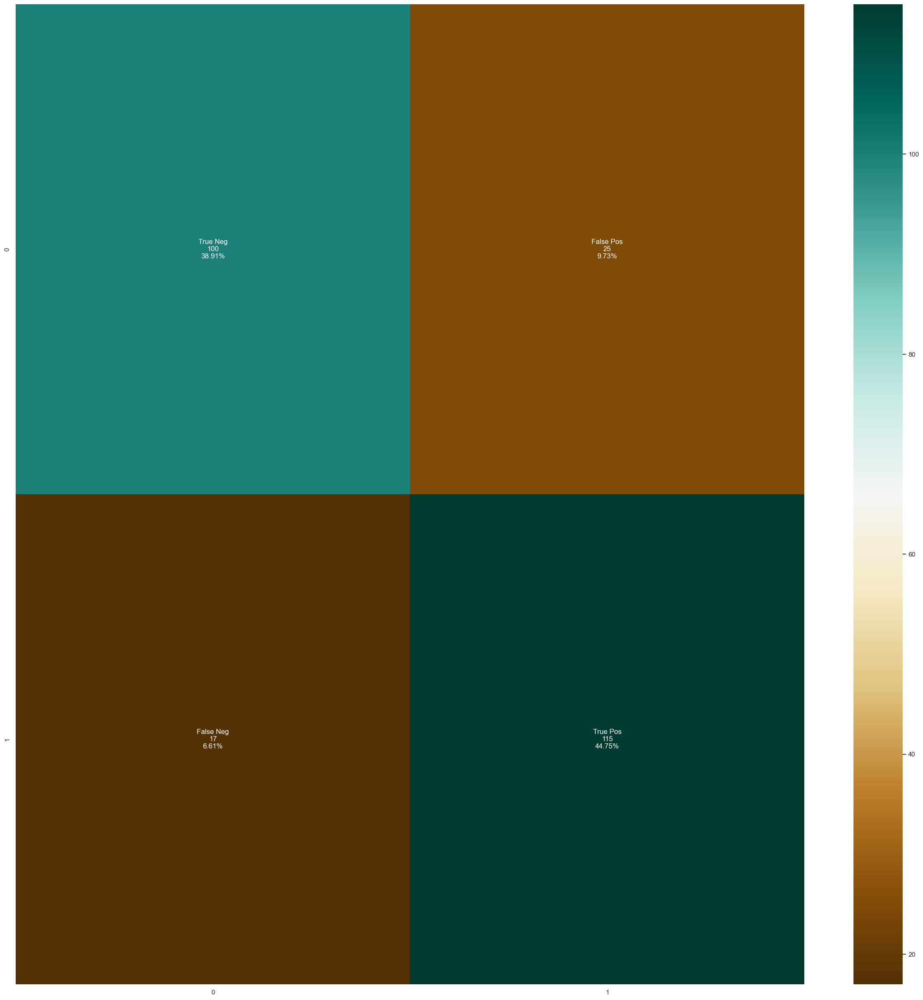

In [465]:
model_evaluation(classifier_svcbalanced)

              precision    recall  f1-score   support

           0       0.85      0.80      0.83       125
           1       0.82      0.87      0.85       132

    accuracy                           0.84       257
   macro avg       0.84      0.84      0.84       257
weighted avg       0.84      0.84      0.84       257



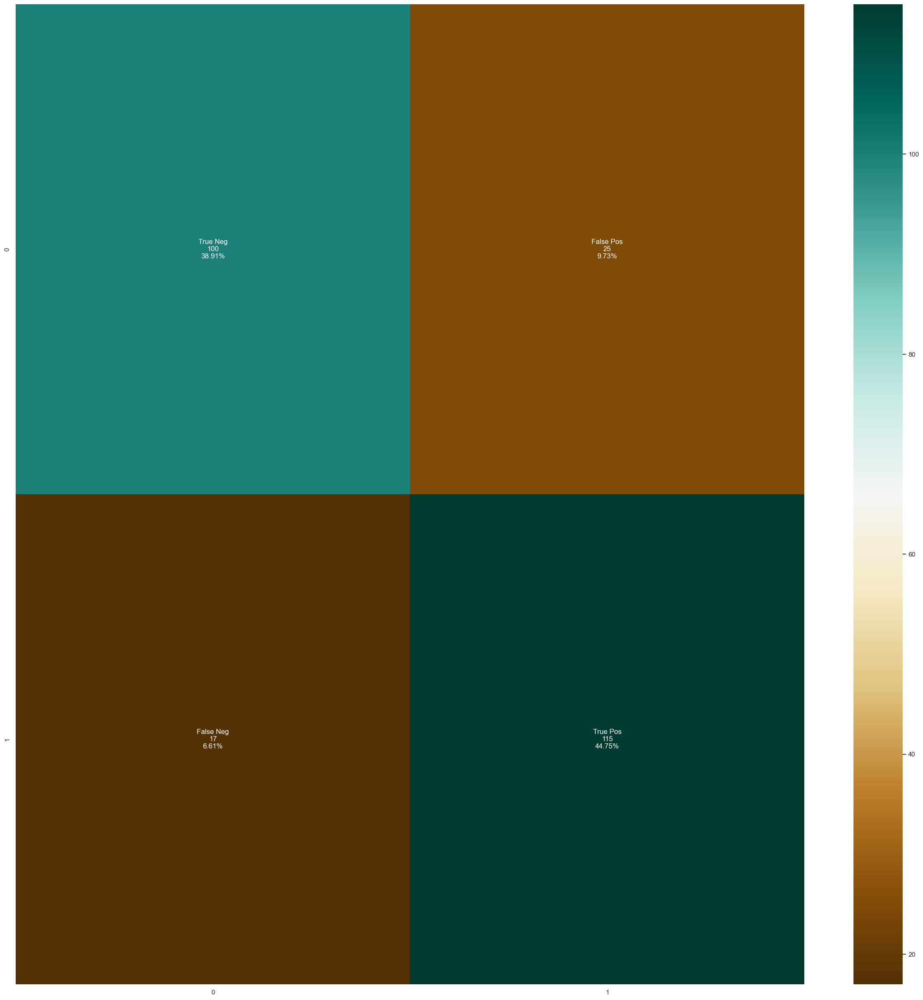

In [466]:
model_evaluation(classifier_svc)

              precision    recall  f1-score   support

           0       0.85      0.80      0.83       125
           1       0.82      0.87      0.85       132

    accuracy                           0.84       257
   macro avg       0.84      0.84      0.84       257
weighted avg       0.84      0.84      0.84       257



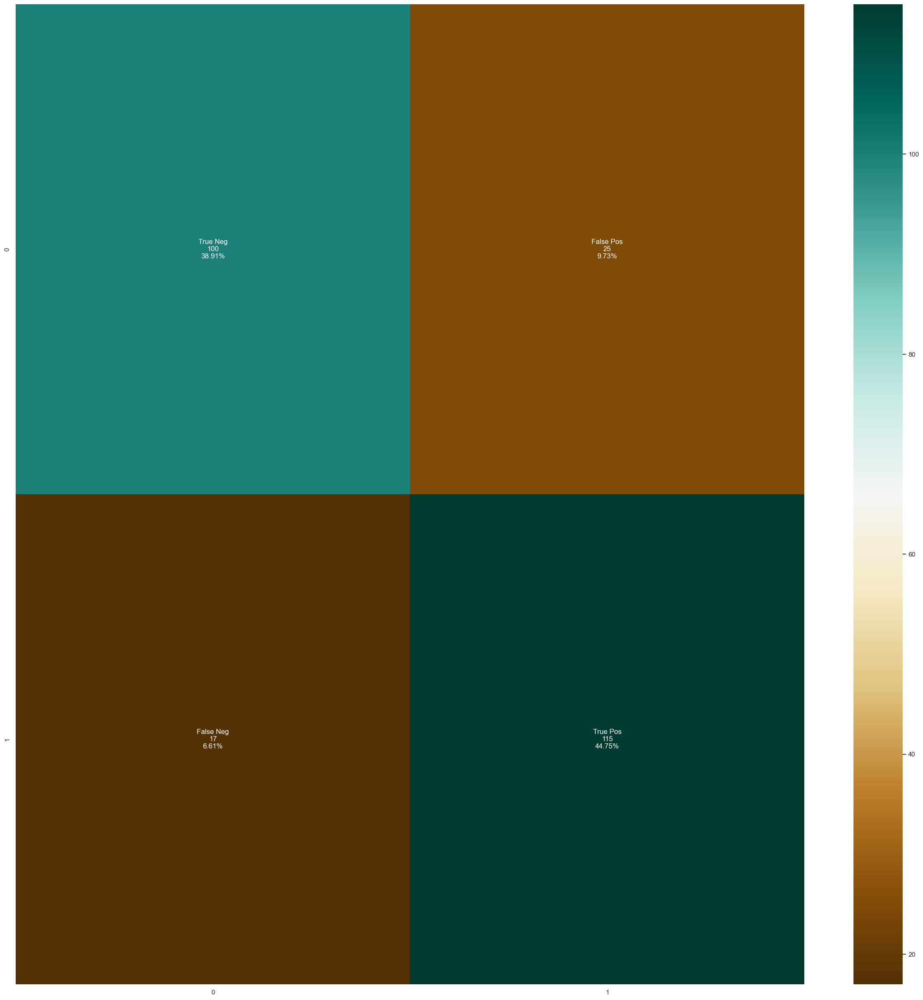

In [467]:
model_evaluation(classifier_supervector)

In [471]:
classifier_rf = RandomForestClassifier(max_depth = 4,random_state = 0)

In [472]:
classifier_rfbalanced = RandomForestClassifier(max_depth = 4,random_state = 0,class_weight='balanced')

In [473]:
n_estimators=[100]
max_features=['auto','sqrt']
max_depth=[2,4]
min_samples_leaf=[1,2]
bootstrap=[True,False]
min_samples_split=[2,5]

In [474]:
param_grid={'max_features':max_features,'max_depth':max_depth,'min_samples_leaf':min_samples_leaf,'bootstrap':bootstrap,'min_samples_split':min_samples_split}

In [475]:
randomtree=RandomForestClassifier(max_depth=2,n_estimators=100)
randomtree.fit(Xtrain,Ytrain)

RandomForestClassifier(max_depth=2)

In [476]:
classifier_randomsearch=GridSearchCV(classifier_rf,param_grid,scoring='accuracy',cv=cv)

In [477]:
classifier_randomsearch.fit(Xtrain,Ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=RandomForestClassifier(max_depth=4, random_state=0),
             param_grid={'bootstrap': [True, False], 'max_depth': [2, 4],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 5]},
             scoring='accuracy')

In [478]:
print(classifier_randomsearch.best_params_)

{'bootstrap': False, 'max_depth': 4, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2}


In [479]:
##prediction
y_pred2=classifier_randomsearch.predict(Xtest)

In [480]:
print(classifier_randomsearch.best_score_)

0.8524777853725223


In [481]:
score=accuracy_score(y_pred2,Ytest)
print(score)

0.8871595330739299


In [482]:
# imbalanced and via grid search
print(classification_report(y_pred2,Ytest))

              precision    recall  f1-score   support

           0       0.85      0.91      0.88       116
           1       0.92      0.87      0.89       141

    accuracy                           0.89       257
   macro avg       0.89      0.89      0.89       257
weighted avg       0.89      0.89      0.89       257



Accuracy :  88.72%
Cross Validation Score :  92.36%
ROC_AUC Score :  88.61%


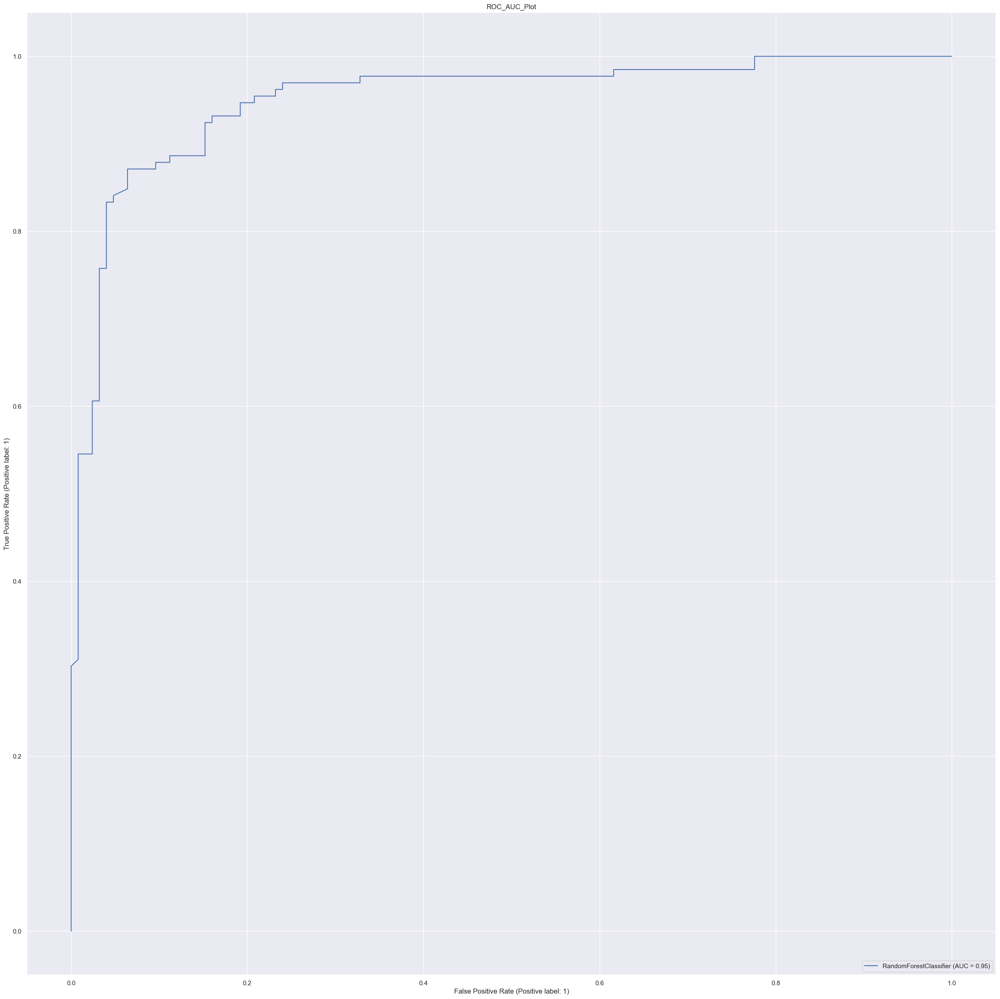

In [483]:
#balanced but no gridsearch hyperparameters applied
model(classifier_rfbalanced)

Accuracy :  88.72%
Cross Validation Score :  92.36%
ROC_AUC Score :  88.61%


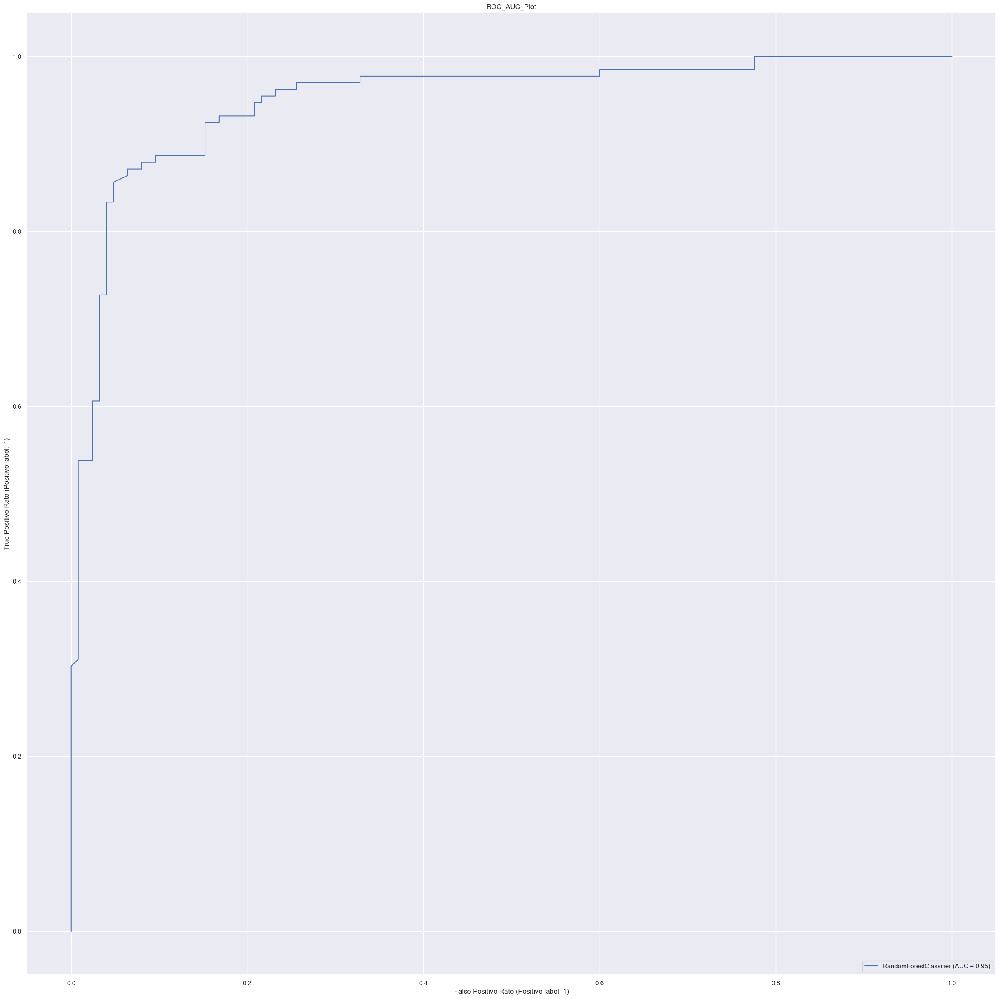

In [484]:
#not balanced and without grid search hyperparameters
model(classifier_rf)

              precision    recall  f1-score   support

           0       0.91      0.85      0.88       125
           1       0.87      0.92      0.89       132

    accuracy                           0.89       257
   macro avg       0.89      0.89      0.89       257
weighted avg       0.89      0.89      0.89       257



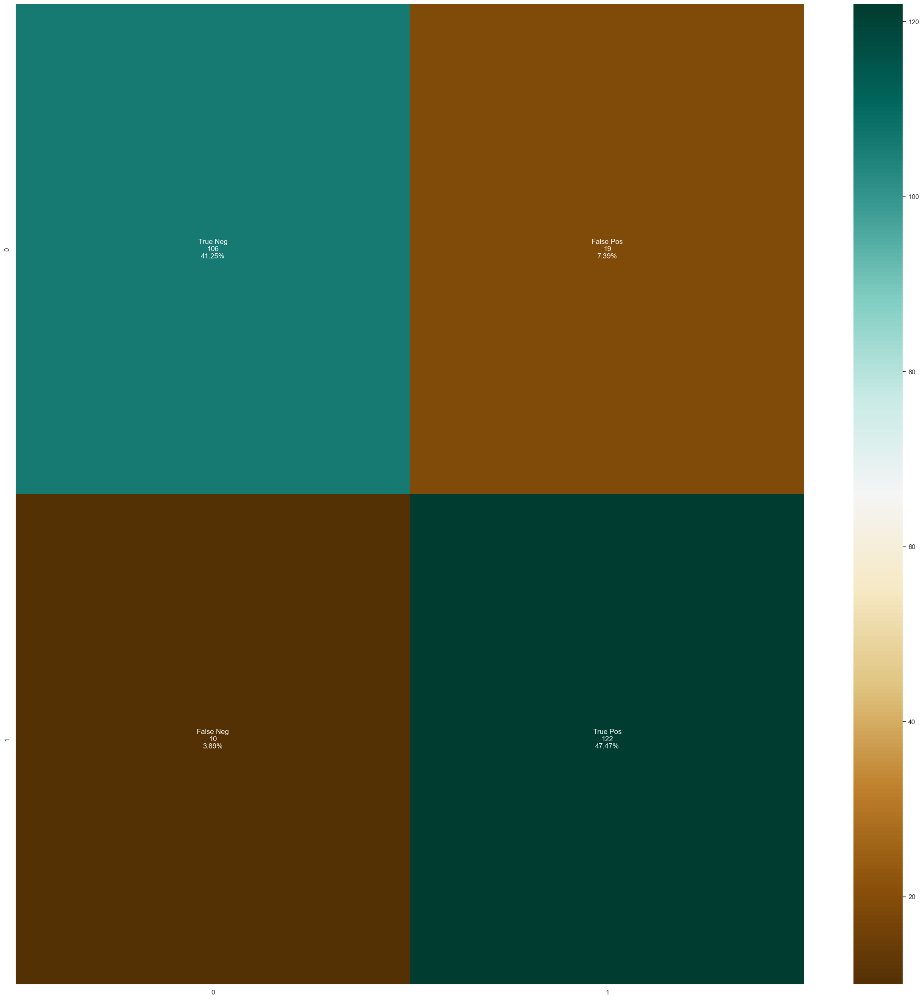

In [485]:
model_evaluation(classifier_rfbalanced)

              precision    recall  f1-score   support

           0       0.91      0.85      0.88       125
           1       0.87      0.92      0.89       132

    accuracy                           0.89       257
   macro avg       0.89      0.89      0.89       257
weighted avg       0.89      0.89      0.89       257



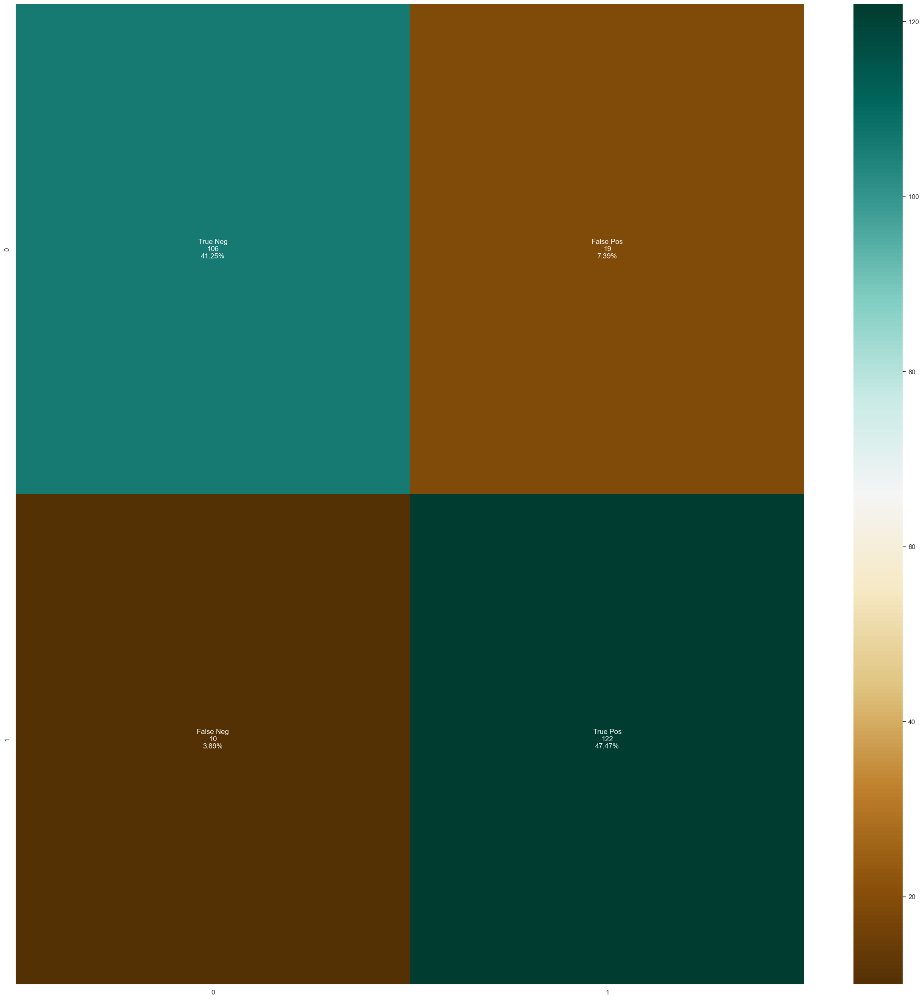

In [486]:
model_evaluation(classifier_rf)

              precision    recall  f1-score   support

           0       0.91      0.85      0.88       125
           1       0.87      0.92      0.89       132

    accuracy                           0.89       257
   macro avg       0.89      0.89      0.89       257
weighted avg       0.89      0.89      0.89       257



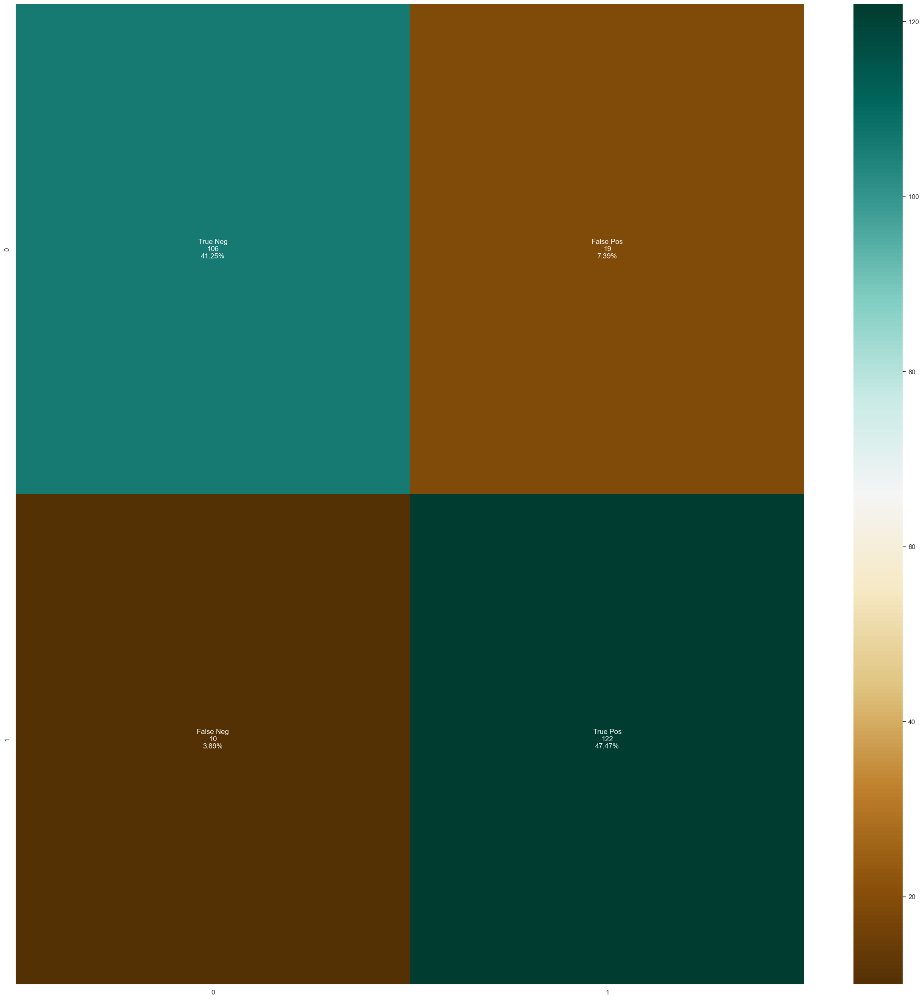

In [487]:
model_evaluation(classifier_randomsearch)

[Text(0.5, 0.8333333333333334, 'X[3] <= 0.5\ngini = 0.499\nsamples = 471\nvalue = [366, 402]'),
 Text(0.25, 0.5, 'X[4] <= 2.5\ngini = 0.405\nsamples = 272\nvalue = [126, 320]'),
 Text(0.125, 0.16666666666666666, 'gini = 0.246\nsamples = 194\nvalue = [44, 262]'),
 Text(0.375, 0.16666666666666666, 'gini = 0.485\nsamples = 78\nvalue = [82, 58]'),
 Text(0.75, 0.5, 'X[1] <= 0.5\ngini = 0.38\nsamples = 199\nvalue = [240, 82]'),
 Text(0.625, 0.16666666666666666, 'gini = 0.084\nsamples = 123\nvalue = [195, 9]'),
 Text(0.875, 0.16666666666666666, 'gini = 0.472\nsamples = 76\nvalue = [45, 73]')]

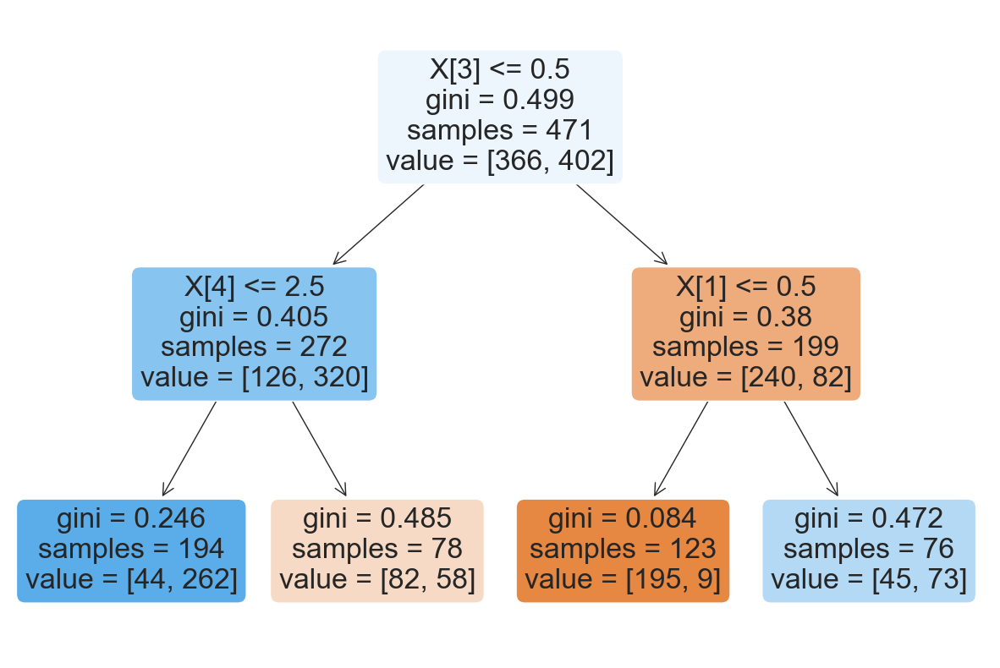

In [488]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

fig = plt.figure(figsize=(15, 10))
plot_tree(randomtree.estimators_[0], filled=True, impurity=True,rounded=True)

In [489]:
from sklearn.naive_bayes import GaussianNB

In [490]:
classifier_NB = GaussianNB()

Accuracy :  81.71%
Cross Validation Score :  86.66%
ROC_AUC Score :  81.62%


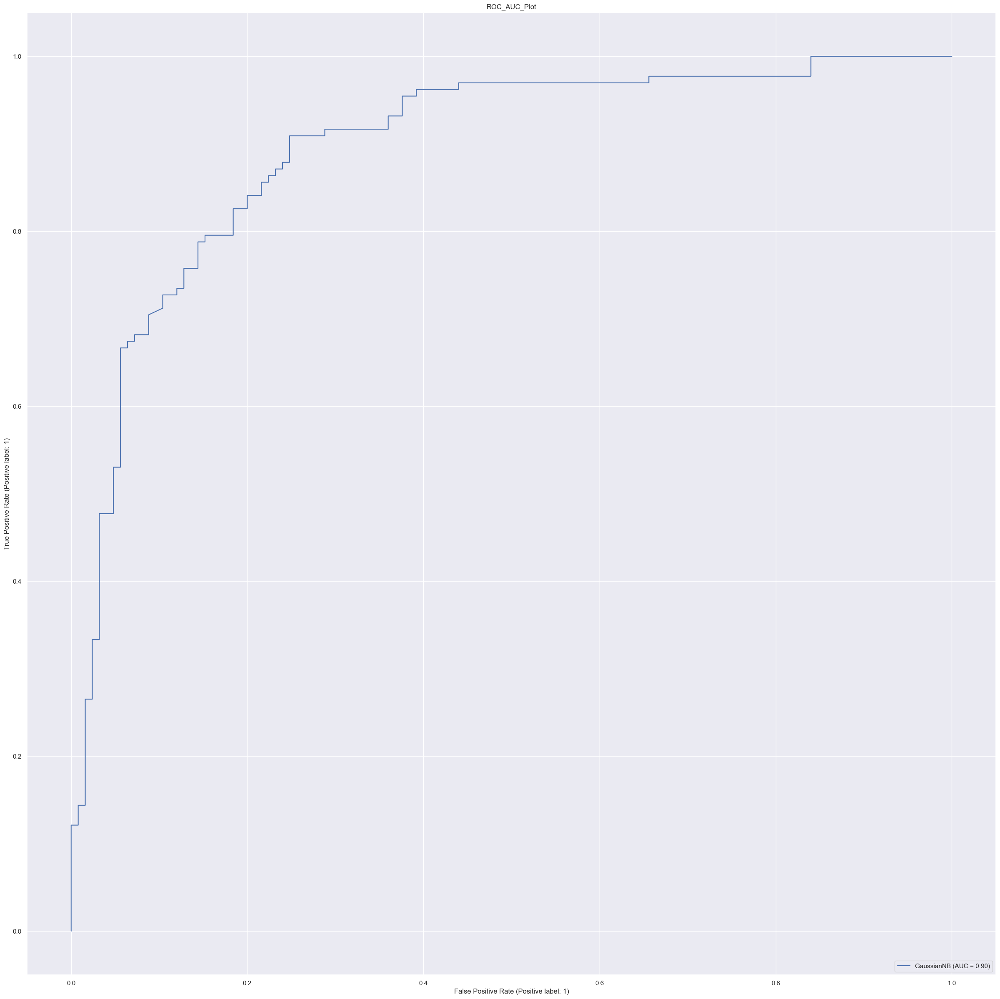

In [491]:
model(classifier_NB)

              precision    recall  f1-score   support

           0       0.83      0.78      0.81       125
           1       0.81      0.85      0.83       132

    accuracy                           0.82       257
   macro avg       0.82      0.82      0.82       257
weighted avg       0.82      0.82      0.82       257



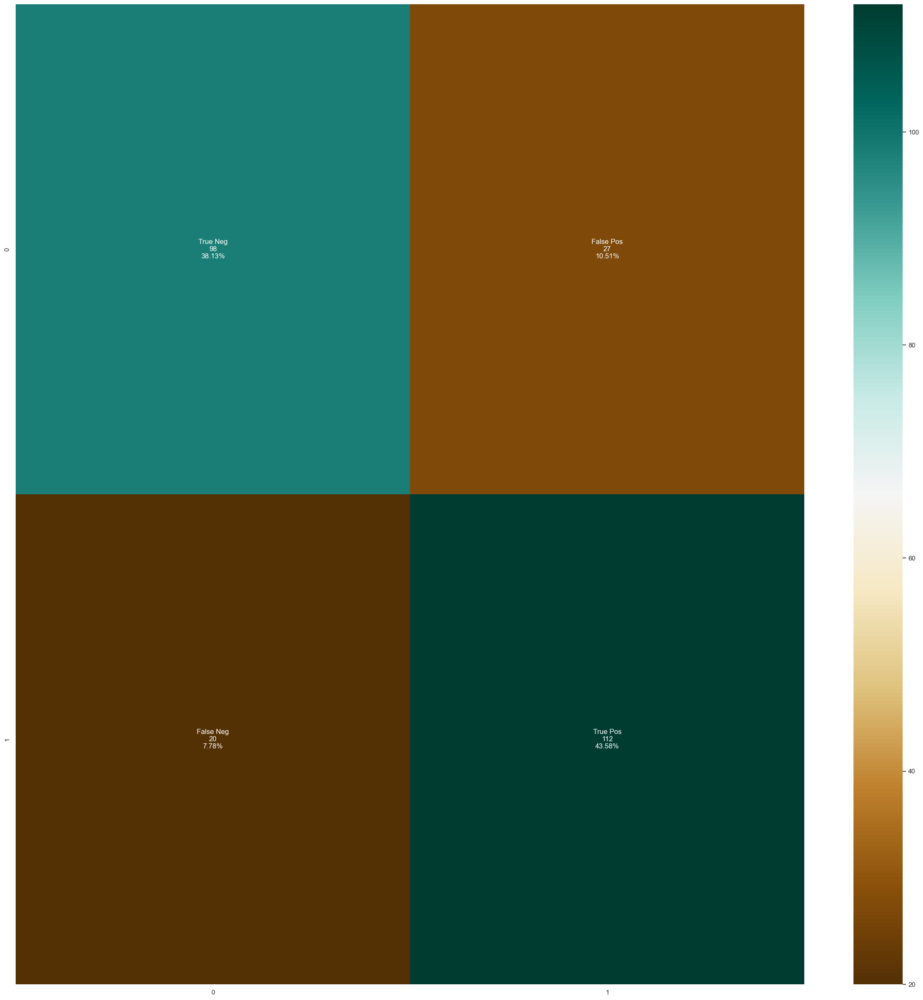

In [492]:
model_evaluation(classifier_NB)

In [83]:
gb = GradientBoostingClassifier(random_state = 1)
ab=AdaBoostClassifier()

In [85]:
gb.fit(Xtrain,Ytrain)

GradientBoostingClassifier(random_state=1)

In [494]:
from scipy.stats import uniform as sp_randFloat
from scipy.stats import randint as sp_randInt

In [495]:
parameters={'learning_rate': [0.1,0.7],
            'subsample':[0.1,0.9],
            'n_estimators':[100,1000],
            'max_depth':[4,10]
           }

In [496]:
classifier_Gb=GridSearchCV(gb,param_grid=parameters,scoring='accuracy',cv=cv)

classifier_Gb.fit(Xtrain,Ytrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=GradientBoostingClassifier(random_state=1),
             param_grid={'learning_rate': [0.1, 0.7], 'max_depth': [4, 10],
                         'n_estimators': [100, 1000], 'subsample': [0.1, 0.9]},
             scoring='accuracy')

In [497]:
print(classifier_Gb.best_params_)

{'learning_rate': 0.7, 'max_depth': 4, 'n_estimators': 100, 'subsample': 0.9}


In [498]:
print(classifier_Gb.best_score_)

0.9539758487126907


In [499]:
##prediction
y_pred1=classifier_Gb.predict(Xtest)

In [500]:
score=accuracy_score(y_pred1,Ytest)
error=1-accuracy_score(y_pred1,Ytest)
print("accuracy is ",score)
print("error rate is",error)

accuracy is  0.9766536964980544
error rate is 0.023346303501945553


In [501]:
# imbalanced and via grid search
print(classification_report(y_pred1,Ytest))

              precision    recall  f1-score   support

           0       0.96      0.99      0.98       121
           1       0.99      0.96      0.98       136

    accuracy                           0.98       257
   macro avg       0.98      0.98      0.98       257
weighted avg       0.98      0.98      0.98       257



              precision    recall  f1-score   support

           0       0.99      0.96      0.98       125
           1       0.96      0.99      0.98       132

    accuracy                           0.98       257
   macro avg       0.98      0.98      0.98       257
weighted avg       0.98      0.98      0.98       257



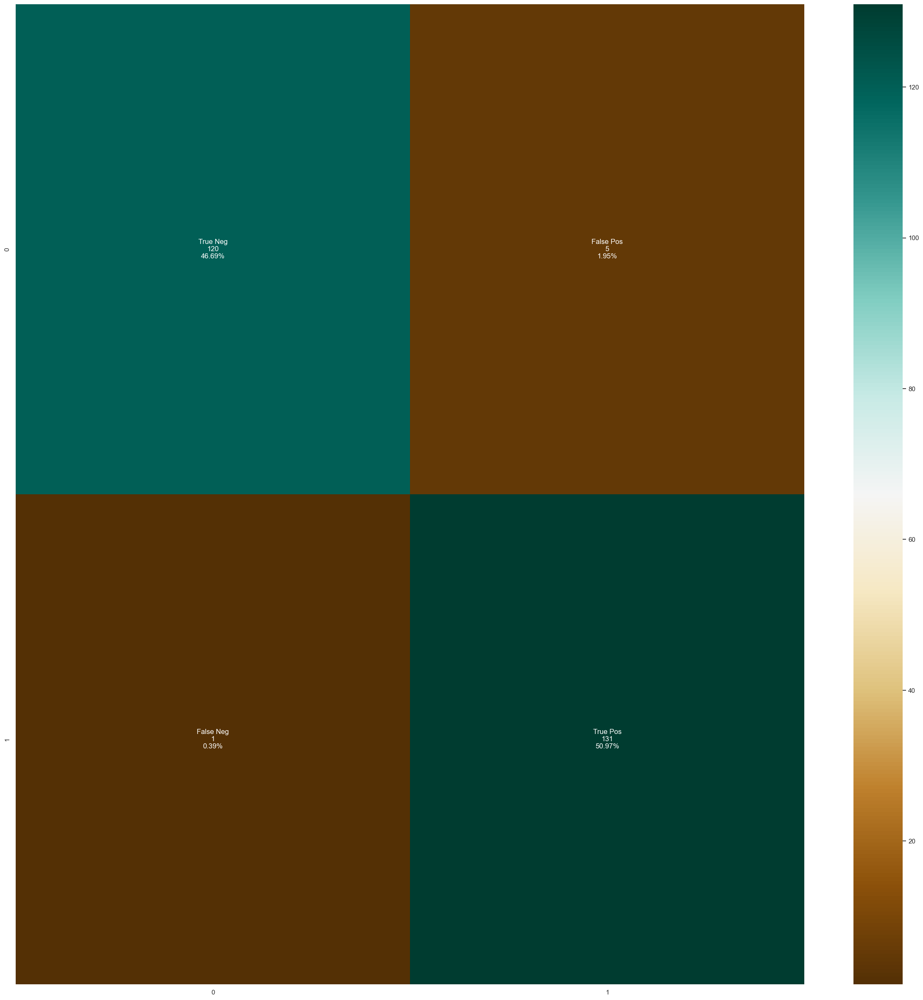

In [502]:
model_evaluation(classifier_Gb)

Accuracy :  93.00%
Cross Validation Score :  96.12%
ROC_AUC Score :  93.03%


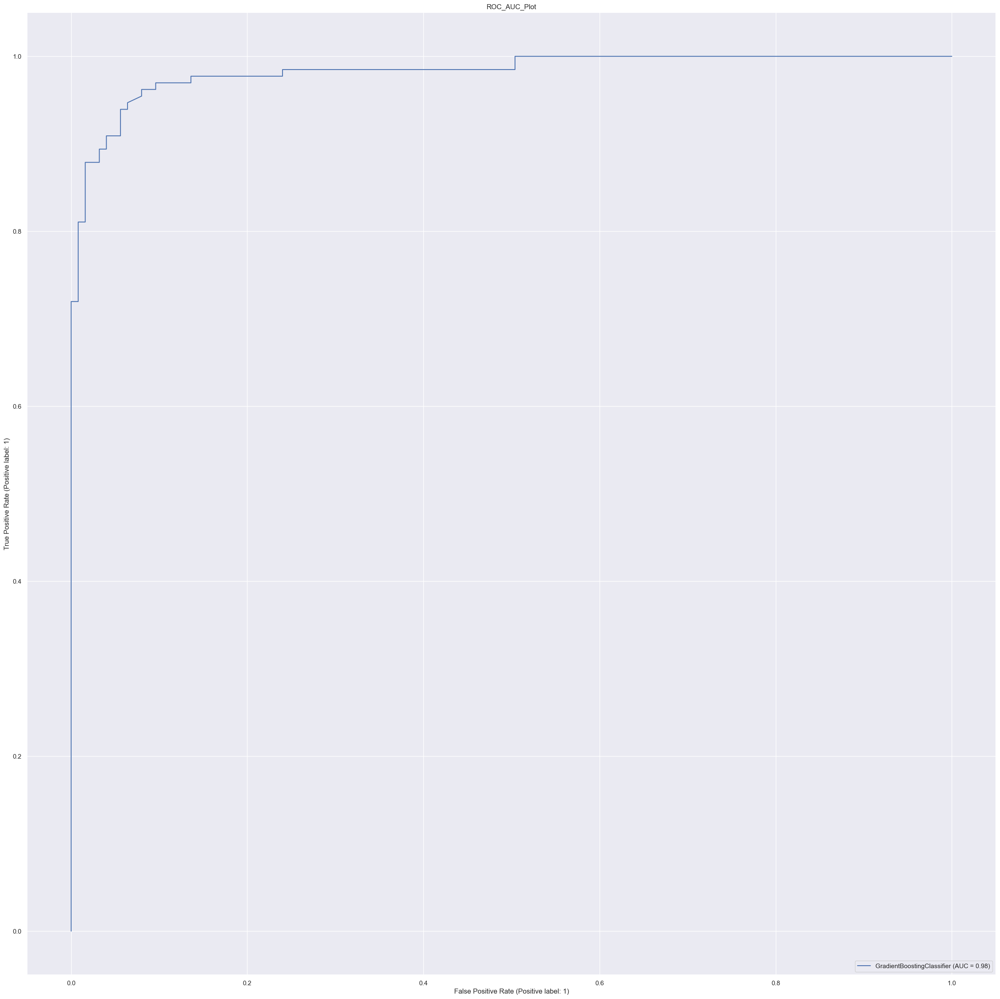

In [503]:
model(gb)

              precision    recall  f1-score   support

           0       0.91      0.94      0.93       125
           1       0.95      0.92      0.93       132

    accuracy                           0.93       257
   macro avg       0.93      0.93      0.93       257
weighted avg       0.93      0.93      0.93       257



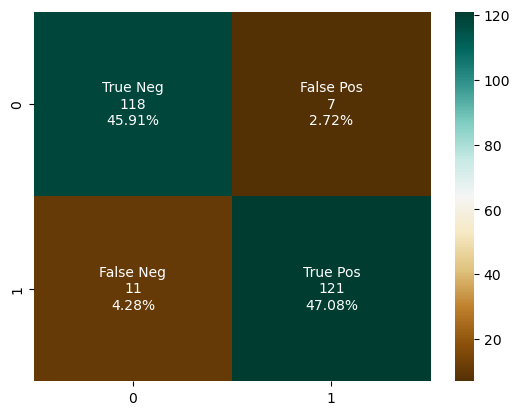

In [86]:
model_evaluation(gb)

Accuracy :  89.49%
Cross Validation Score :  91.28%
ROC_AUC Score :  89.48%


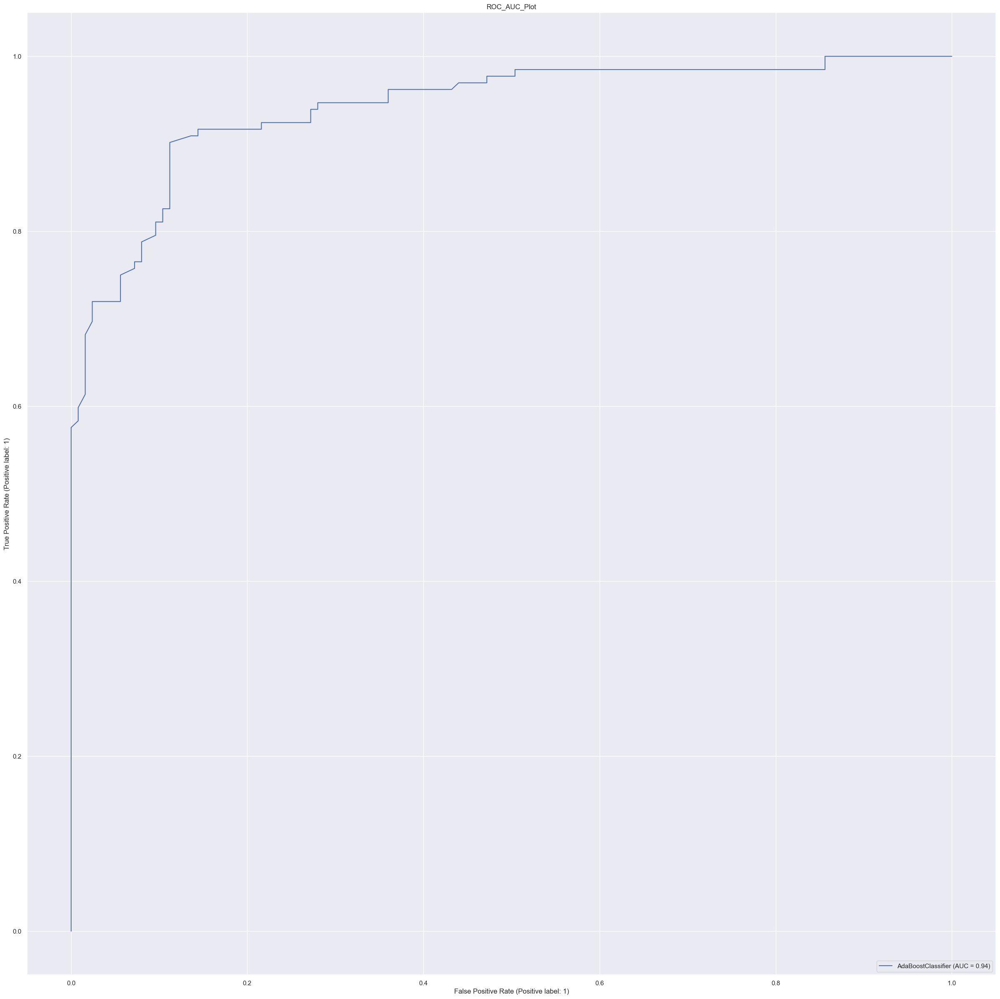

In [504]:
model(ab)

In [103]:
data=dataset[['age', 'cp', 'chol', 'restecg', 'thalach', 'ca', 'thal','target']].copy()
data_set=dataset[['cp','thal','oldpeak','exang','thalach','slope','ca','chol','target']].copy()

In [104]:
from sklearn.model_selection import train_test_split, GridSearchCV
xxx = data_set.drop('target', axis = 1)
YYY = data_set['target']
XXXtrain, XXXtest, YYYtrain, YYYtest = train_test_split(xxx, YYY, test_size = 0.25, stratify = YYY, random_state = 0)

In [105]:
xx = data.drop('target', axis = 1)
YY = data['target']
XXtrain, XXtest, YYtrain, YYtest = train_test_split(xx, YY, test_size = 0.25, stratify = YY, random_state = 0)

In [106]:
data.head()

,age,cp,chol,restecg,thalach,ca,thal,target
0,-0.268437,-0.915755,-0.659332,0.891255,0.821321,1.209221,1.089852,0
1,-0.158157,-0.915755,-0.833861,-1.004049,0.255968,-0.731971,1.089852,0
2,1.716595,-0.915755,-1.396233,0.891255,-1.048692,-0.731971,1.089852,0
3,0.724079,-0.915755,-0.833861,0.891255,0.516900,0.238625,1.089852,0
4,0.834359,-0.915755,0.930822,0.891255,-1.874977,2.179817,-0.522122,0


# Model creation after Forward Feature Selection

In [107]:
def model(classifier):
    
    classifier.fit(XXtrain,YYtrain)
    prediction = classifier.predict(XXtest)
    cv = RepeatedStratifiedKFold(n_splits = 10,n_repeats = 3,random_state = 1)
    print("Accuracy : ",'{0:.2%}'.format(accuracy_score(YYtest,prediction)))
    print("Cross Validation Score : ",'{0:.2%}'.format(cross_val_score(classifier,XXtrain,YYtrain,cv = cv,scoring = 'roc_auc').mean()))
    print("ROC_AUC Score : ",'{0:.2%}'.format(roc_auc_score(YYtest,prediction)))
    plot_roc_curve(classifier, XXtest,YYtest)
    plt.title('ROC_AUC_Plot')
    plt.show()

    
def model_evaluation(classifier):
    
    # Confusion Matrix
    cm = confusion_matrix(YYtest,classifier.predict(XXtest))
    names = ['True Neg','False Pos','False Neg','True Pos']
    counts = [value for value in cm.flatten()]
    percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(names,counts,percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cm,annot = labels,cmap ='BrBG' ,fmt ='')
    
    # Classification Report
    print(classification_report(YYtest,classifier.predict(XXtest)))



# defining model after feature selction from mutual information gain
def model(classifier):
    
    classifier.fit(XXXtrain,YYYtrain)
    prediction = classifier.predict(XXtest)
    cv = RepeatedStratifiedKFold(n_splits = 10,n_repeats = 3,random_state = 1)
    print("Accuracy : ",'{0:.2%}'.format(accuracy_score(YYYtest,prediction)))
    print("Cross Validation Score : ",'{0:.2%}'.format(cross_val_score(classifier,XXXtrain,YYYtrain,cv = cv,scoring = 'roc_auc').mean()))
    print("ROC_AUC Score : ",'{0:.2%}'.format(roc_auc_score(YYYtest,prediction)))
    plot_roc_curve(classifier, XXXtest,YYYtest)
    plt.title('ROC_AUC_Plot')
    plt.show()

    
def model_evaluation(classifier):
    
    # Confusion Matrix
    cm = confusion_matrix(YYYtest,classifier.predict(XXXtest))
    names = ['True Neg','False Pos','False Neg','True Pos']
    counts = [value for value in cm.flatten()]
    percentages = ['{0:.2%}'.format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(names,counts,percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(cm,annot = labels,cmap ='BrBG' ,fmt ='')
    
    # Classification Report
    print(classification_report(YYtest,classifier.predict(XXtest)))



# 1.Logistic Regression

In [92]:
# normal logistic regression
classifier_lr = LogisticRegression(random_state = 0,C=10,penalty= 'l2',solver='newton-cg',class_weight='balanced')

In [93]:
# Classification for GridSearchCV
classifier=LogisticRegression()

In [95]:
classifier.fit(XXtrain,YYtrain)

LogisticRegression()

In [94]:
parameter={'penalty':['l1','l2','elasticnet'],'C':[1,2,3,4,5,6,10,20,30,40,50],'max_iter':[100,200,300],'solver':['newton-cg','lbfgs','liblinear']}

In [516]:
classifier_regressor=GridSearchCV(classifier,param_grid=parameter,scoring='accuracy',cv=cv)

In [517]:
classifier_regressor.fit(XXtrain,YYtrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=LogisticRegression(),
             param_grid={'C': [1, 2, 3, 4, 5, 6, 10, 20, 30, 40, 50],
                         'max_iter': [100, 200, 300],
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear']},
             scoring='accuracy')

In [518]:
print(classifier_regressor.best_params_)

{'C': 1, 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear'}


In [519]:
print(classifier_regressor.best_score_)

0.7951241740715425


In [520]:
##prediction
y_pred=classifier_regressor.predict(XXtest)

In [521]:
score=accuracy_score(y_pred,YYtest)
print(score)

0.8171206225680934


In [522]:
# imbalanced and via grid search
print(classification_report(y_pred,YYtest))

              precision    recall  f1-score   support

           0       0.80      0.82      0.81       122
           1       0.83      0.81      0.82       135

    accuracy                           0.82       257
   macro avg       0.82      0.82      0.82       257
weighted avg       0.82      0.82      0.82       257



Accuracy :  82.10%
Cross Validation Score :  85.67%
ROC_AUC Score :  82.05%


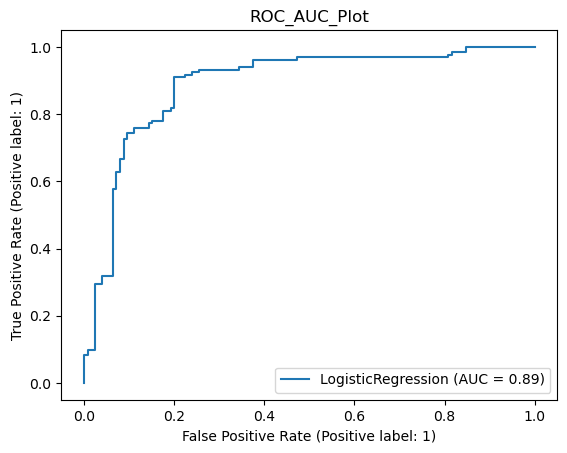

In [96]:
#not balanced and without grid search hyperparameters
model(classifier)

Accuracy :  80.93%
Cross Validation Score :  85.64%
ROC_AUC Score :  80.91%


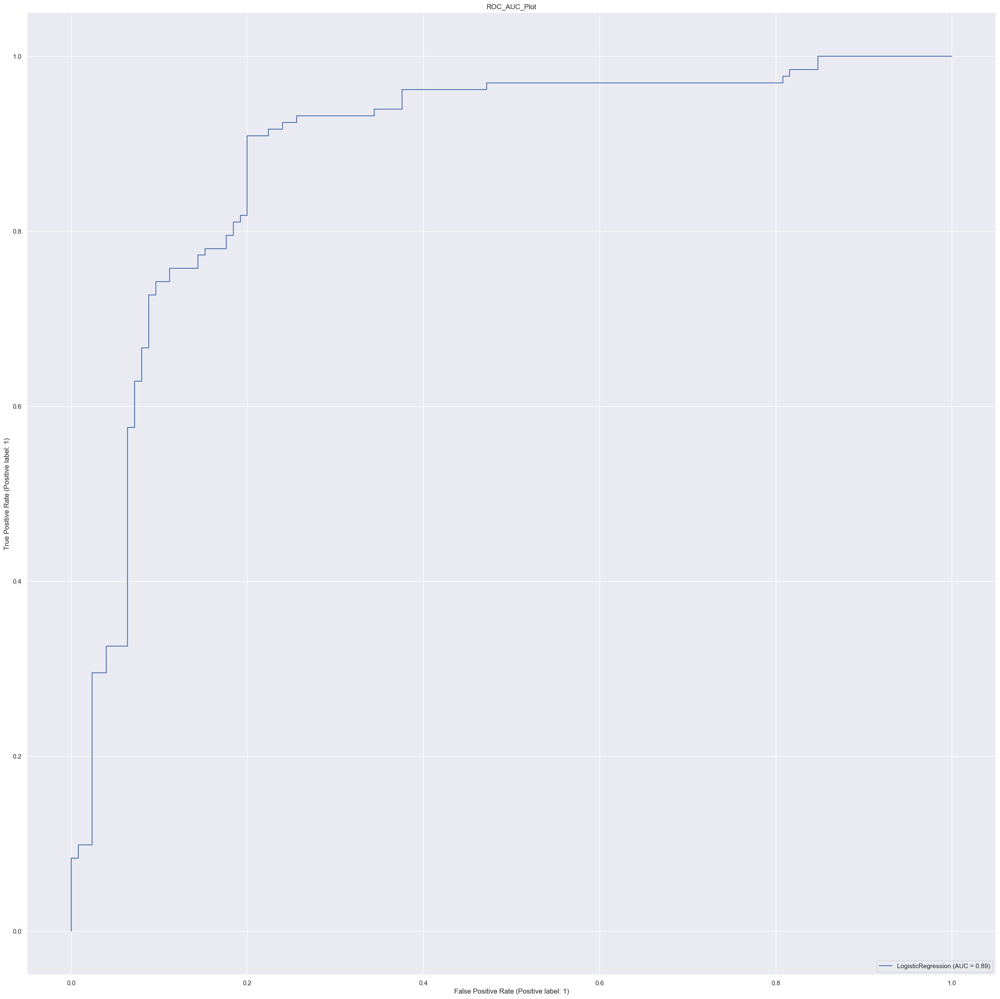

In [524]:
# balanced but without GridSearchCV hyperparameters
model(classifier_lr)

              precision    recall  f1-score   support

           0       0.81      0.80      0.80       125
           1       0.81      0.82      0.82       132

    accuracy                           0.81       257
   macro avg       0.81      0.81      0.81       257
weighted avg       0.81      0.81      0.81       257



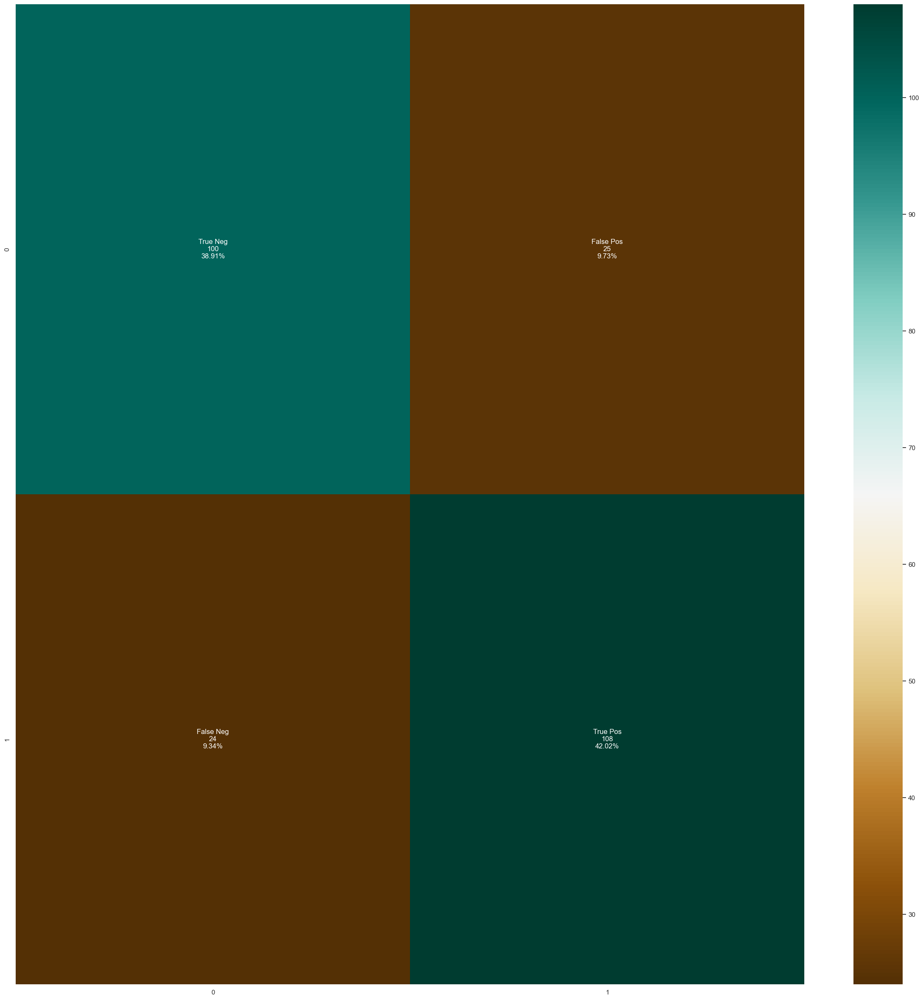

In [525]:
#Report generated after classifier without gridsearchcv 
model_evaluation(classifier_lr)

              precision    recall  f1-score   support

           0       0.83      0.80      0.81       125
           1       0.82      0.84      0.83       132

    accuracy                           0.82       257
   macro avg       0.82      0.82      0.82       257
weighted avg       0.82      0.82      0.82       257



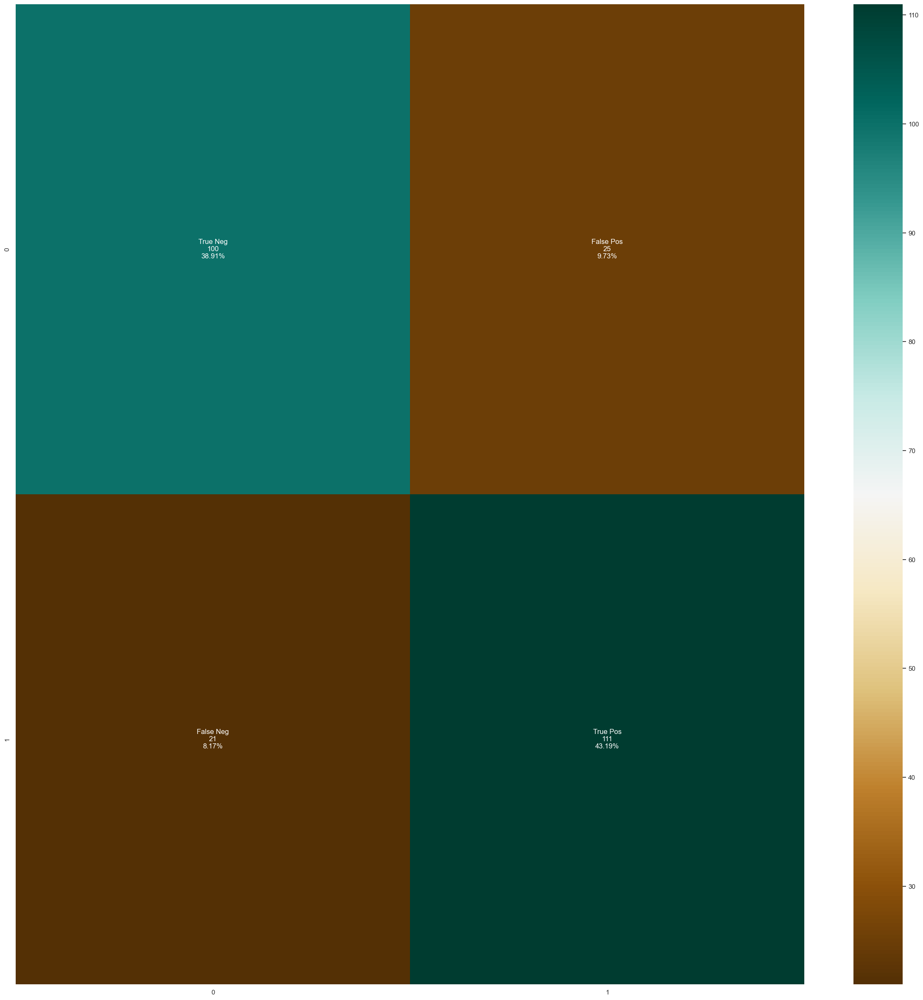

In [526]:
model_evaluation(classifier)

# 2.Decision Tree Classifier

In [34]:
classifier_dtbalanced = DecisionTreeClassifier(random_state = 1000,max_depth = 4,min_samples_leaf = 1, class_weight='balanced')

In [46]:
classifier1=DecisionTreeClassifier()

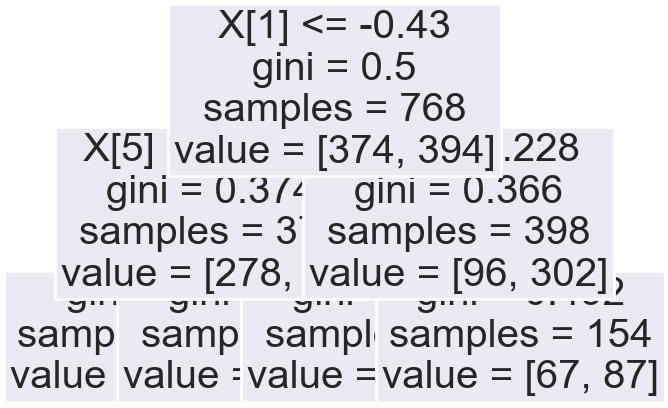

<Figure size 10000x10000 with 0 Axes>

<Figure size 10000x10000 with 0 Axes>

In [47]:
tree=DecisionTreeClassifier(max_depth=2)
tree.fit(XXtrain,YYtrain)
from sklearn.tree import plot_tree
plot_tree(tree,fontsize=29)
plt.show()
plt.figure(figsize=(100,100))

In [37]:
parameter1 ={'criterion':['gini','entropy','log_loss'],'splitter':['best','random'],'max_depth':[1,2,3,4,5],'max_features':['auto', 'sqrt', 'log2']}

In [40]:
classifier_decisiontree=GridSearchCV(classifier1,param_grid=parameter1,scoring='accuracy',cv=cv)

In [41]:
classifier_decisiontree.fit(XXtrain,YYtrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [1, 2, 3, 4, 5],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'splitter': ['best', 'random']},
             scoring='accuracy')

In [42]:
print(classifier_decisiontree.best_params_)

{'criterion': 'gini', 'max_depth': 5, 'max_features': 'auto', 'splitter': 'best'}


In [43]:
print(classifier_decisiontree.best_score_)

0.8256037821827296


In [44]:
##prediction
y_pred1=classifier_decisiontree.predict(XXtest)

In [46]:
score=accuracy_score(y_pred1,YYtest)
error=1-accuracy_score(y_pred1,YYtest)
print("accuracy is ",score)
print("error rate is",error)

accuracy is  0.8443579766536965
error rate is 0.1556420233463035


In [47]:
# imbalanced and via grid search
print(classification_report(y_pred1,YYtest))

              precision    recall  f1-score   support

           0       0.82      0.85      0.84       121
           1       0.86      0.84      0.85       136

    accuracy                           0.84       257
   macro avg       0.84      0.84      0.84       257
weighted avg       0.84      0.84      0.84       257



Accuracy :  85.99%
Cross Validation Score :  89.69%
ROC_AUC Score :  85.92%


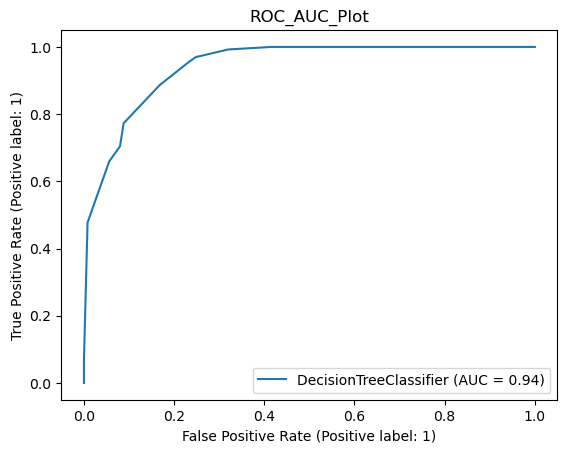

In [48]:
#balanced but no gridsearch hyperparameters applied
model(classifier_dtbalanced)

Accuracy :  100.00%
Cross Validation Score :  98.41%
ROC_AUC Score :  100.00%


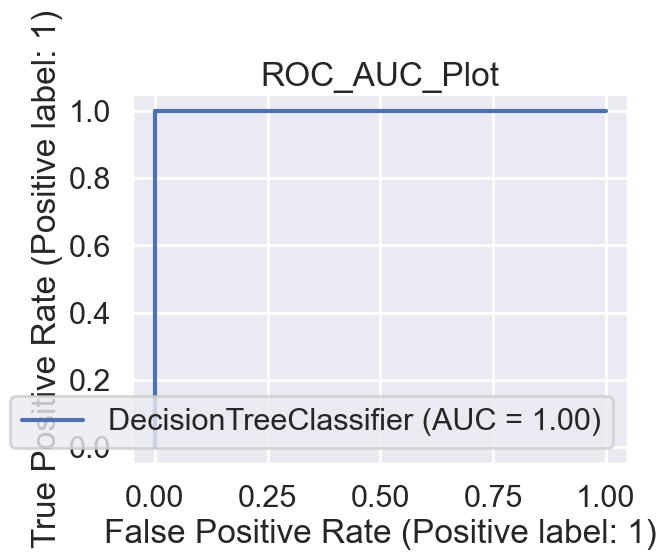

In [50]:
#not balanced and without grid search hyperparameters
model(classifier1)

In [51]:
pred=classifier1.predict(XXtest)
from sklearn.metrics import accuracy_score
accuracy_score(YYtest, pred)

1.0

In [52]:
path = classifier1.cost_complexity_pruning_path(XXtrain, YYtrain)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [53]:
clfs = []
for ccp_alpha in ccp_alphas:
    classifier1 = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    classifier1.fit(XXtrain, YYtrain)
    clfs.append(classifier1)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))


Number of nodes in the last tree is: 1 with ccp_alpha: 0.12995116207503843


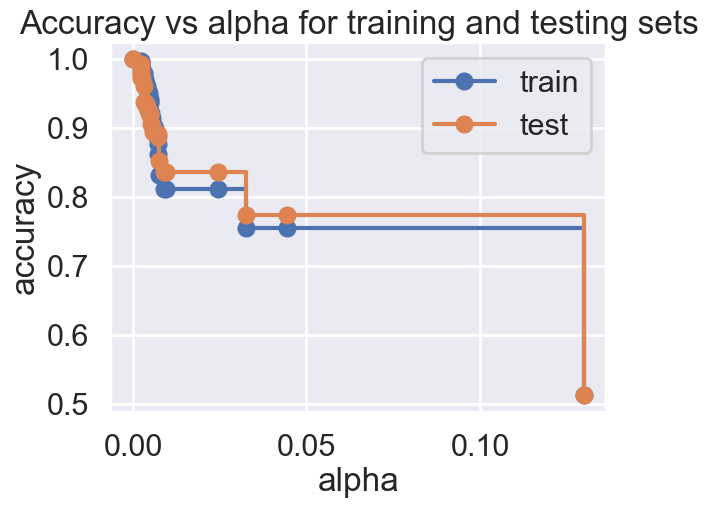

In [55]:
train_scores = [classifier1.score(XXtrain, YYtrain) for classifier1 in clfs]
test_scores = [classifier1.score(XXtest, YYtest) for classifier1 in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train",
        drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

In [56]:
classifier1 = DecisionTreeClassifier(random_state=0, ccp_alpha=0.012)
classifier1.fit(XXtrain,YYtrain)

DecisionTreeClassifier(ccp_alpha=0.012, random_state=0)

In [59]:
pred=classifier1.predict(XXtest)
from sklearn.metrics import accuracy_score
accuracy_score(YYtest, pred)

0.8365758754863813

In [97]:
#not balanced but grid search tree applied
model_evaluation(classifier_decisiontree)

NameError: name 'classifier_decisiontree' is not defined

              precision    recall  f1-score   support

           0       0.87      0.83      0.85       125
           1       0.85      0.89      0.87       132

    accuracy                           0.86       257
   macro avg       0.86      0.86      0.86       257
weighted avg       0.86      0.86      0.86       257



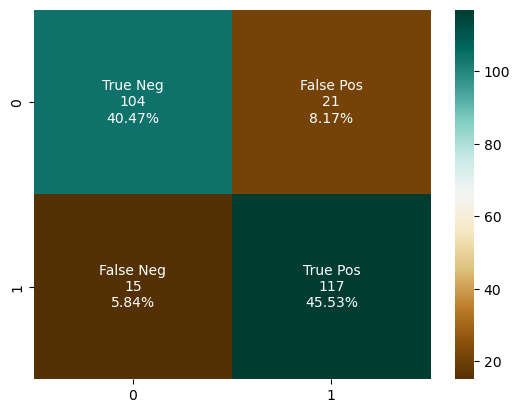

In [64]:
# balanced but not gridsearch applied
model_evaluation(classifier_dtbalanced)

# 3. Super Vector Classifier

In [543]:
classifier_svc = SVC(kernel = 'linear',C = 0.1)

In [544]:
classifier_svcbalanced = SVC(kernel = 'linear',C = 0.1,class_weight='balanced')

In [545]:
parameter2 ={'C':[1, 10, 100],'gamma':[0.001, 0.0001],'kernel': ['linear','rbf']}

In [546]:
classifier_supervector=GridSearchCV(classifier_svc,param_grid=parameter2,scoring='accuracy',cv=cv)

In [547]:
classifier_supervector.fit(XXtrain,YYtrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=SVC(C=0.1, kernel='linear'),
             param_grid={'C': [1, 10, 100], 'gamma': [0.001, 0.0001],
                         'kernel': ['linear', 'rbf']},
             scoring='accuracy')

In [548]:
print(classifier_supervector.best_params_)

{'C': 100, 'gamma': 0.001, 'kernel': 'rbf'}


In [549]:
##prediction
y_pred2=classifier_supervector.predict(XXtest)

In [550]:
print(classifier_supervector.best_score_)

0.8094326725905673


In [551]:
score=accuracy_score(y_pred2,YYtest)
error=1-accuracy_score(y_pred2,YYtest)
print(score)
print(error)

0.8638132295719845
0.13618677042801552


In [552]:
# imbalanced and via grid search
print(classification_report(y_pred2,YYtest))

              precision    recall  f1-score   support

           0       0.81      0.90      0.85       112
           1       0.92      0.83      0.87       145

    accuracy                           0.86       257
   macro avg       0.86      0.87      0.86       257
weighted avg       0.87      0.86      0.86       257



In [63]:
#balanced but no gridsearch hyperparameters applied
model(classifier_svcbalanced)

NameError: name 'classifier_svcbalanced' is not defined

Accuracy :  84.05%
Cross Validation Score :  85.50%
ROC_AUC Score :  83.92%


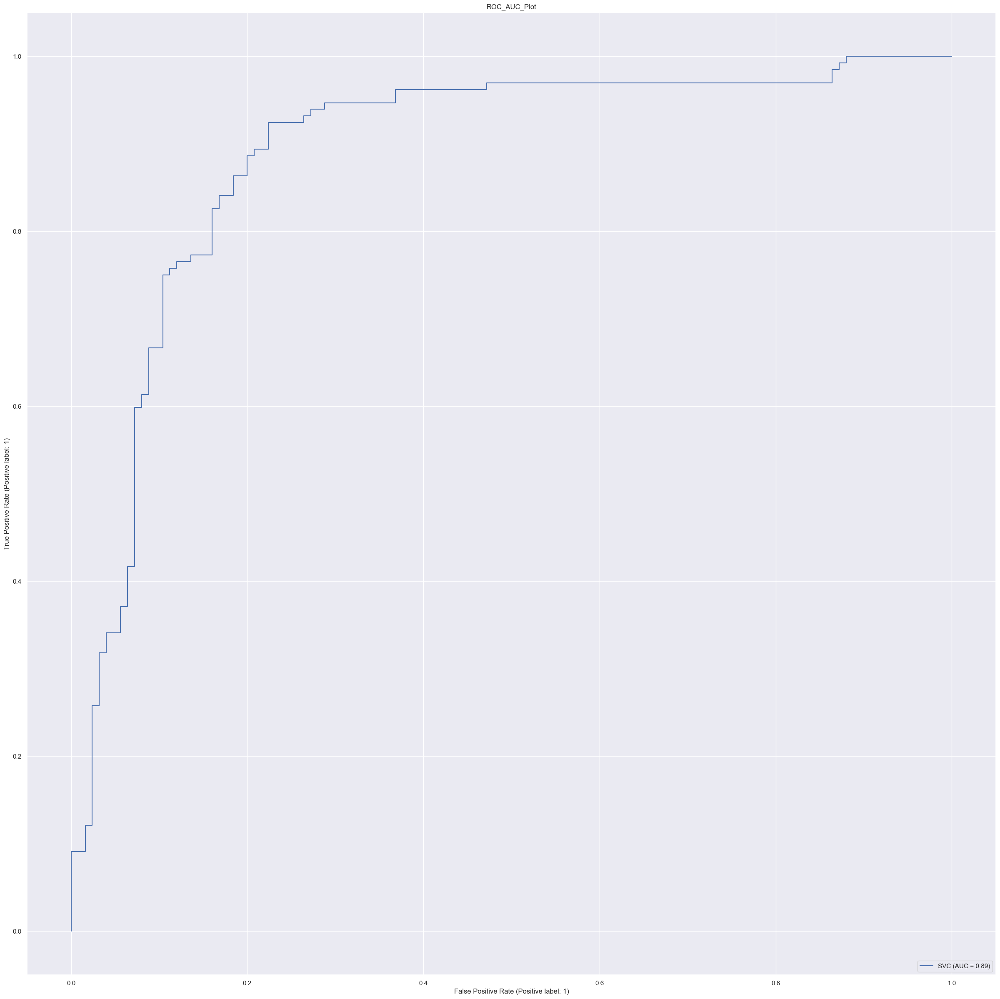

In [554]:
#not balanced and without grid search hyperparameters
model(classifier_svc)

              precision    recall  f1-score   support

           0       0.86      0.80      0.83       125
           1       0.82      0.88      0.85       132

    accuracy                           0.84       257
   macro avg       0.84      0.84      0.84       257
weighted avg       0.84      0.84      0.84       257



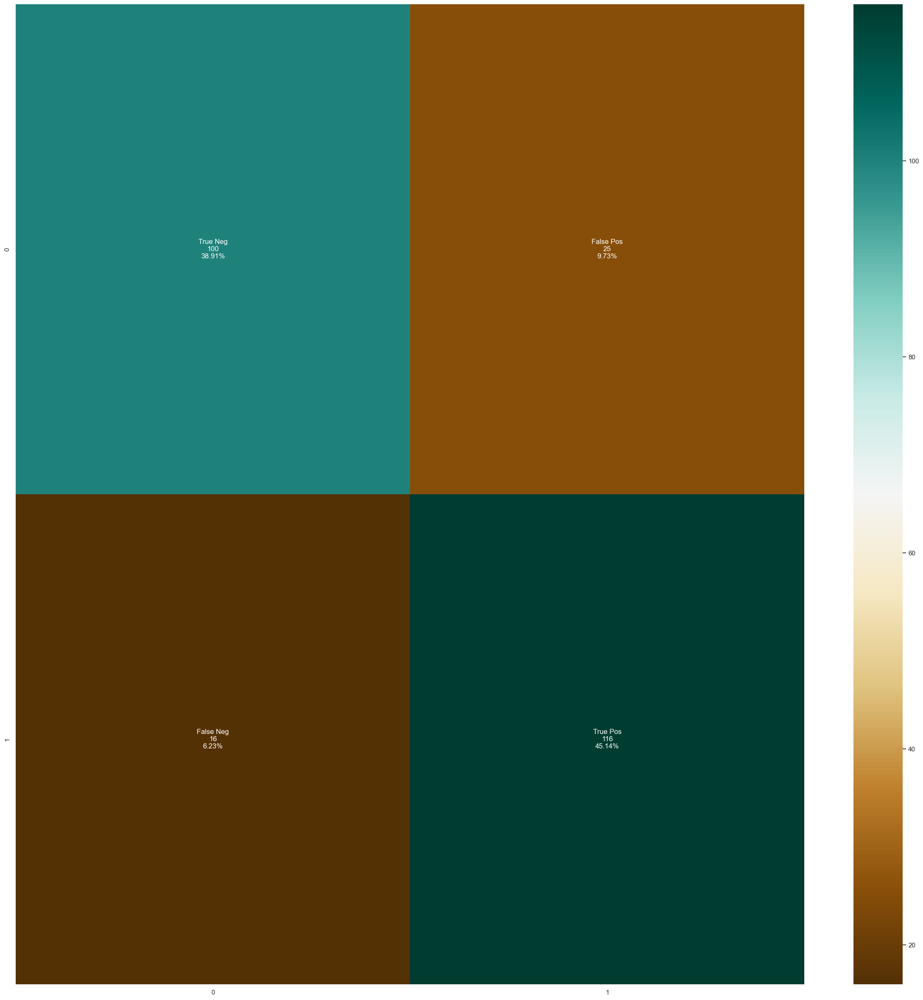

In [555]:
model_evaluation(classifier_svcbalanced)

              precision    recall  f1-score   support

           0       0.87      0.79      0.83       125
           1       0.82      0.89      0.85       132

    accuracy                           0.84       257
   macro avg       0.84      0.84      0.84       257
weighted avg       0.84      0.84      0.84       257



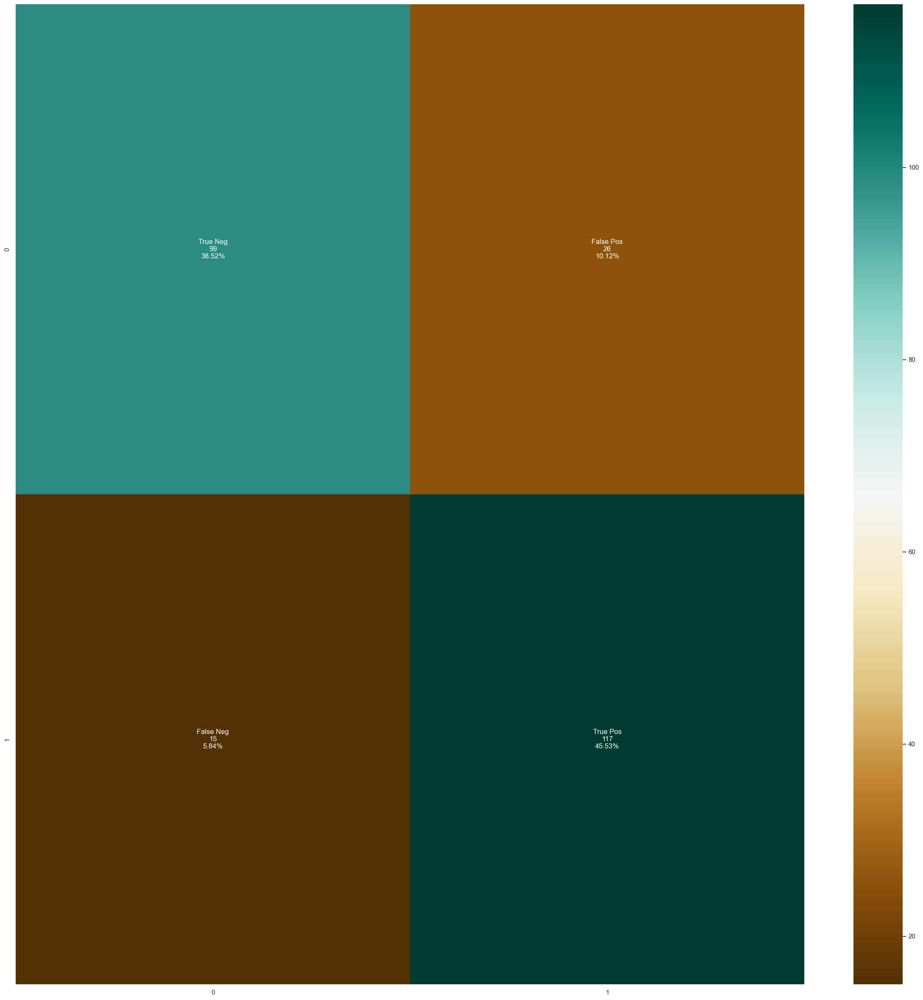

In [556]:
model_evaluation(classifier_svc)

              precision    recall  f1-score   support

           0       0.90      0.81      0.85       125
           1       0.83      0.92      0.87       132

    accuracy                           0.86       257
   macro avg       0.87      0.86      0.86       257
weighted avg       0.87      0.86      0.86       257



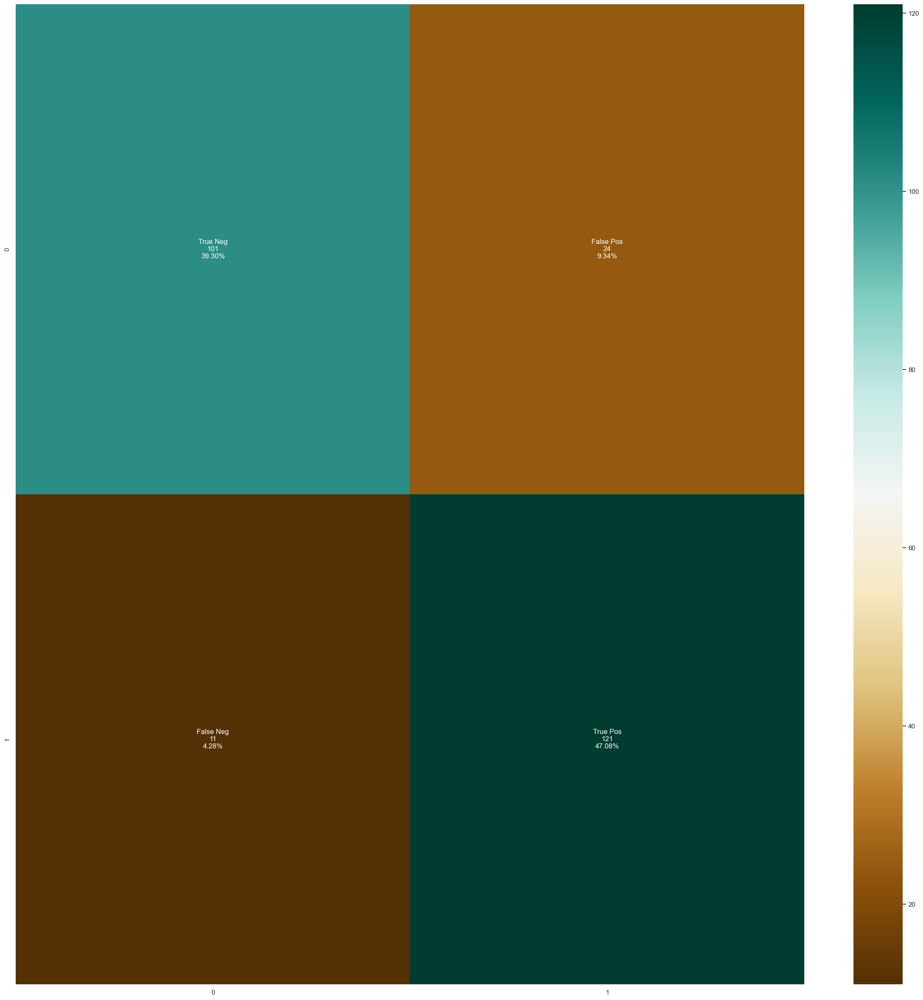

In [557]:
model_evaluation(classifier_supervector)

# 4. Random Forest Classifier

In [558]:
classifier_rf = RandomForestClassifier(max_depth = 4,random_state = 0)

In [559]:
classifier_rfbalanced = RandomForestClassifier(max_depth = 4,random_state = 0,class_weight='balanced')

In [560]:
n_estimators=[100]
max_features=['auto','sqrt']
max_depth=[2,4]
min_samples_leaf=[1,2]
bootstrap=[True,False]
min_samples_split=[2,5]

In [561]:
param_grid={'max_features':max_features,'max_depth':max_depth,'min_samples_leaf':min_samples_leaf,'bootstrap':bootstrap,'min_samples_split':min_samples_split}

In [562]:
randomtree=RandomForestClassifier(max_depth=2,n_estimators=100)
randomtree.fit(XXtrain,YYtrain)

RandomForestClassifier(max_depth=2)

In [563]:
classifier_randomsearch=GridSearchCV(classifier_rf,param_grid,scoring='accuracy',cv=cv)

In [564]:
classifier_randomsearch.fit(XXtrain,YYtrain)

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=RandomForestClassifier(max_depth=4, random_state=0),
             param_grid={'bootstrap': [True, False], 'max_depth': [2, 4],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 5]},
             scoring='accuracy')

In [565]:
print(classifier_randomsearch.best_params_)

{'bootstrap': True, 'max_depth': 4, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 5}


In [566]:
##prediction
y_pred2=classifier_randomsearch.predict(XXtest)

In [567]:
print(classifier_randomsearch.best_score_)

0.8663362952836635


In [568]:
score=accuracy_score(y_pred2,YYtest)
print(score)

0.8832684824902723


In [569]:
# imbalanced and via grid search
print(classification_report(y_pred2,YYtest))

              precision    recall  f1-score   support

           0       0.84      0.91      0.87       115
           1       0.92      0.86      0.89       142

    accuracy                           0.88       257
   macro avg       0.88      0.89      0.88       257
weighted avg       0.89      0.88      0.88       257



Accuracy :  88.72%
Cross Validation Score :  93.89%
ROC_AUC Score :  88.59%


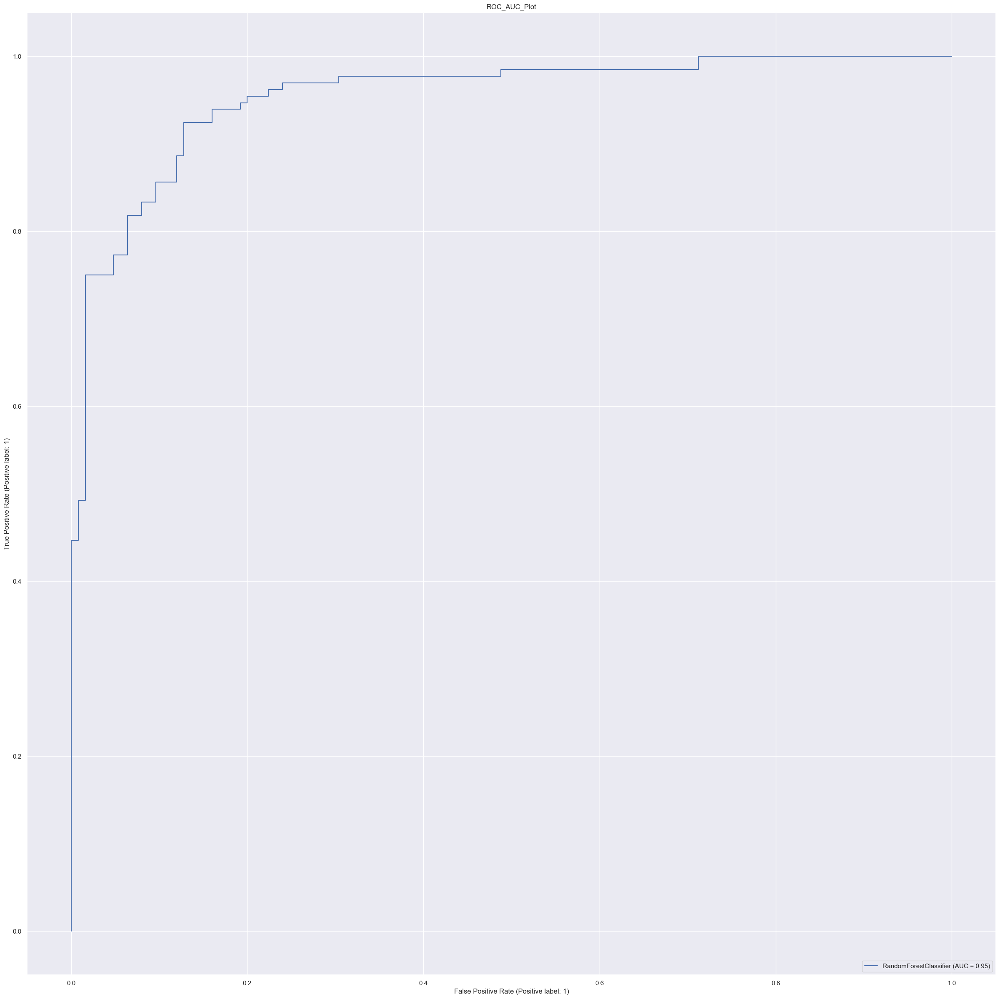

In [570]:
#balanced but no gridsearch hyperparameters applied
model(classifier_rfbalanced)

Accuracy :  88.33%
Cross Validation Score :  93.93%
ROC_AUC Score :  88.21%


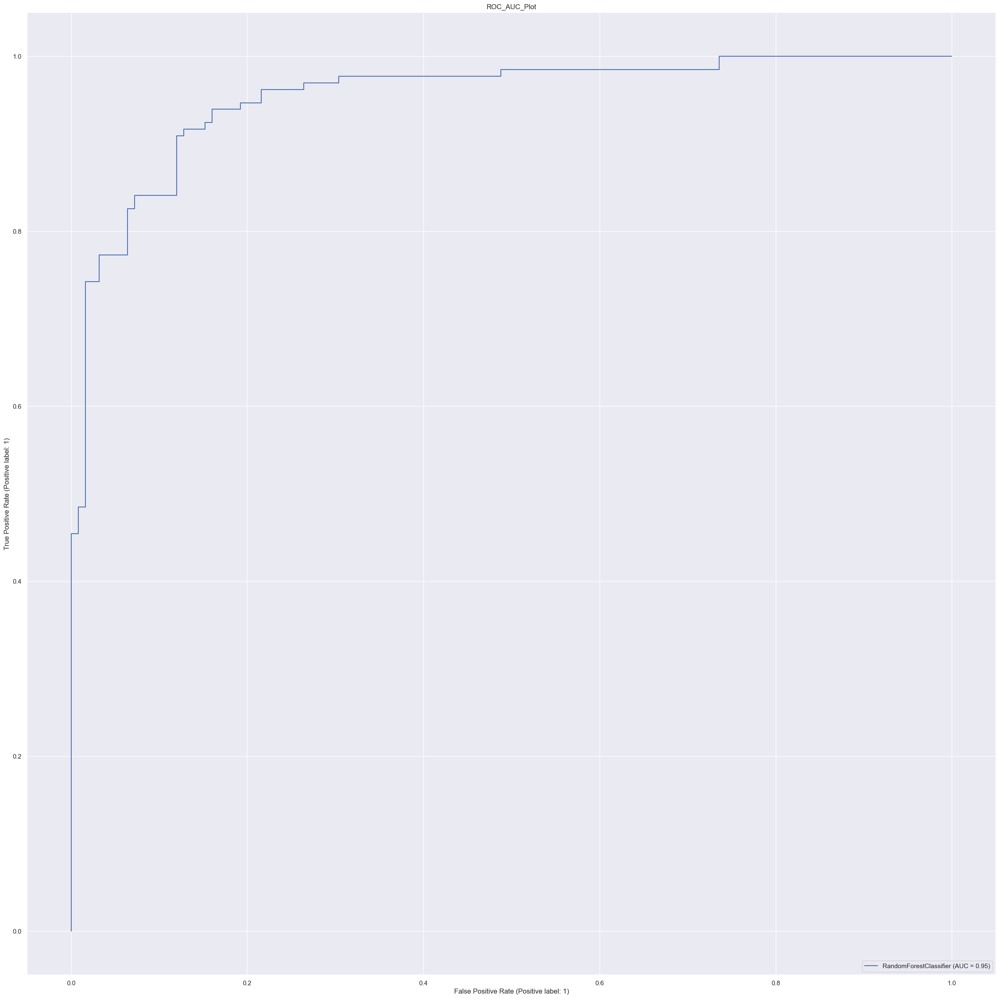

In [571]:
#not balanced and without grid search hyperparameters
model(classifier_rf)

              precision    recall  f1-score   support

           0       0.92      0.84      0.88       125
           1       0.86      0.93      0.89       132

    accuracy                           0.89       257
   macro avg       0.89      0.89      0.89       257
weighted avg       0.89      0.89      0.89       257



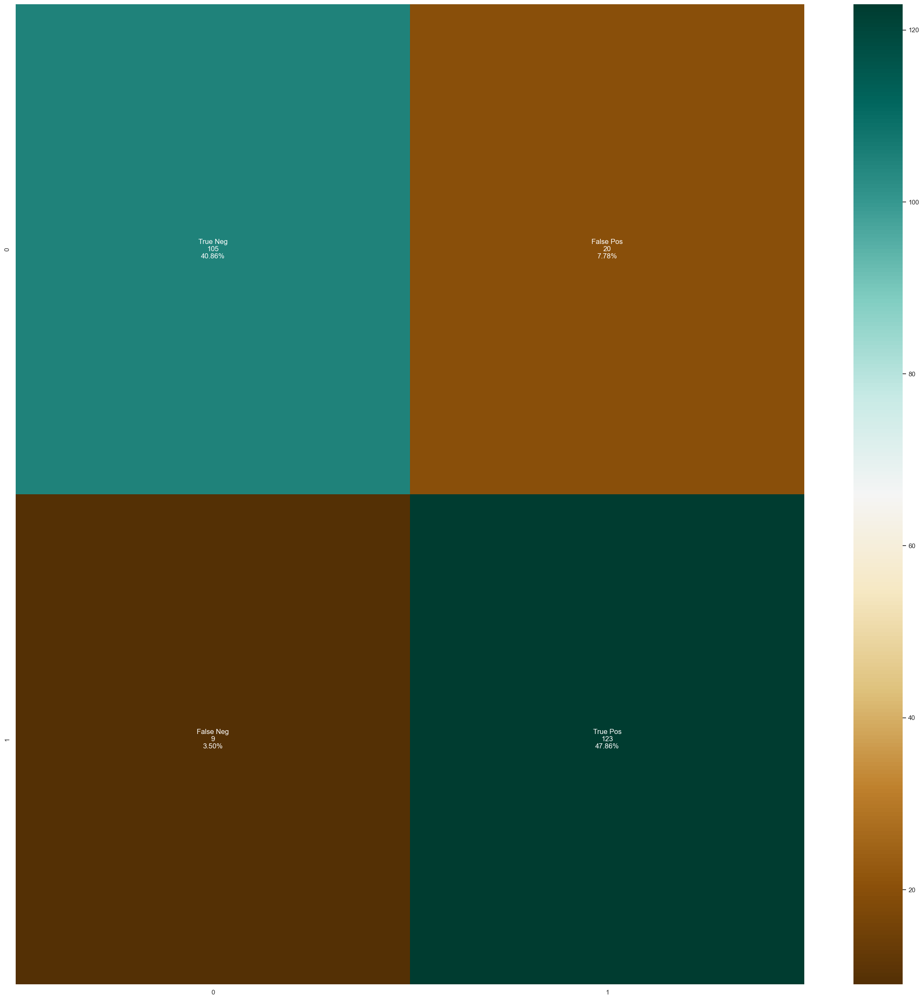

In [572]:
model_evaluation(classifier_rfbalanced)

              precision    recall  f1-score   support

           0       0.91      0.84      0.87       125
           1       0.86      0.92      0.89       132

    accuracy                           0.88       257
   macro avg       0.89      0.88      0.88       257
weighted avg       0.89      0.88      0.88       257



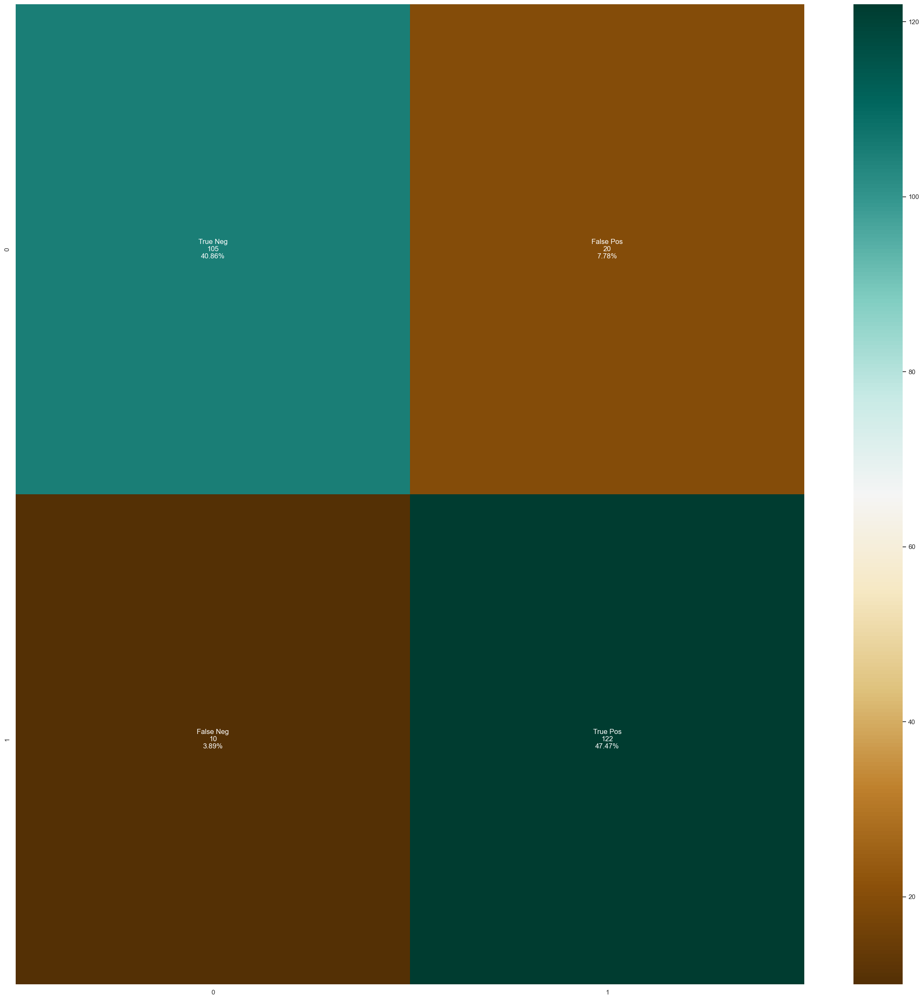

In [573]:
model_evaluation(classifier_rf)

              precision    recall  f1-score   support

           0       0.91      0.84      0.87       125
           1       0.86      0.92      0.89       132

    accuracy                           0.88       257
   macro avg       0.89      0.88      0.88       257
weighted avg       0.89      0.88      0.88       257



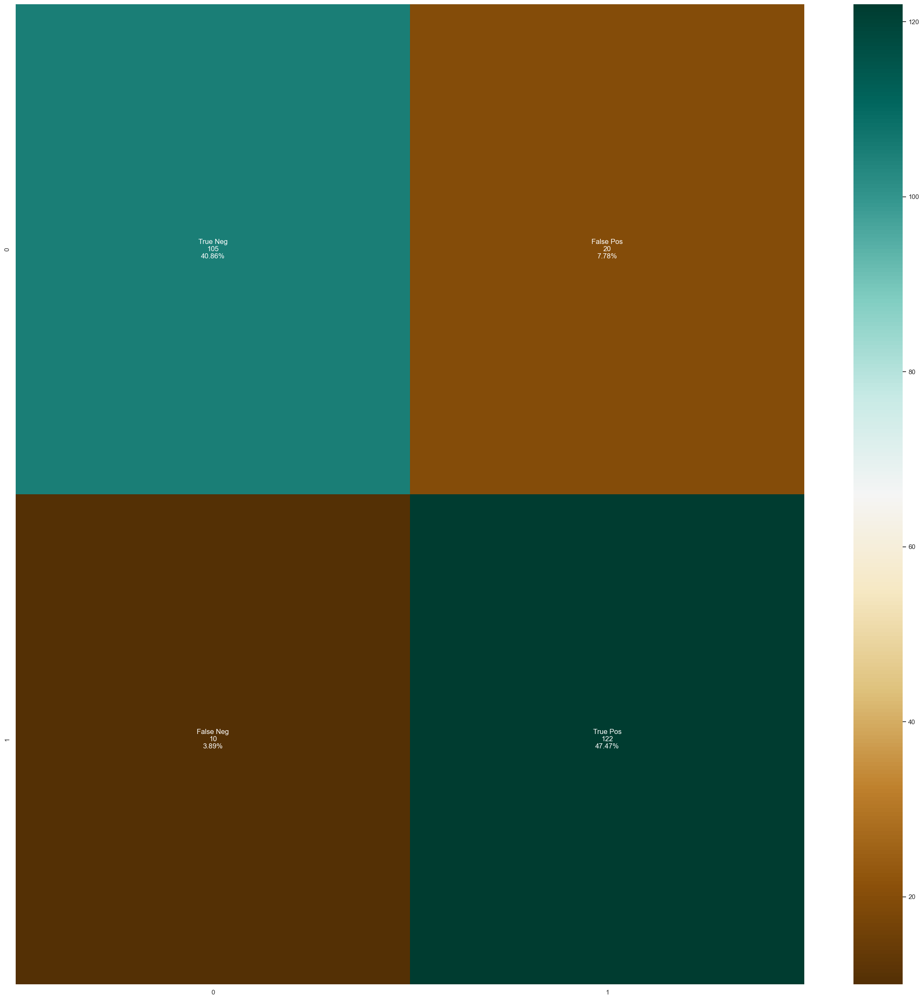

In [574]:
model_evaluation(classifier_randomsearch)

# 5. Naive Bayes

In [575]:
classifier_NB = GaussianNB()

Accuracy :  82.10%
Cross Validation Score :  87.10%
ROC_AUC Score :  82.09%


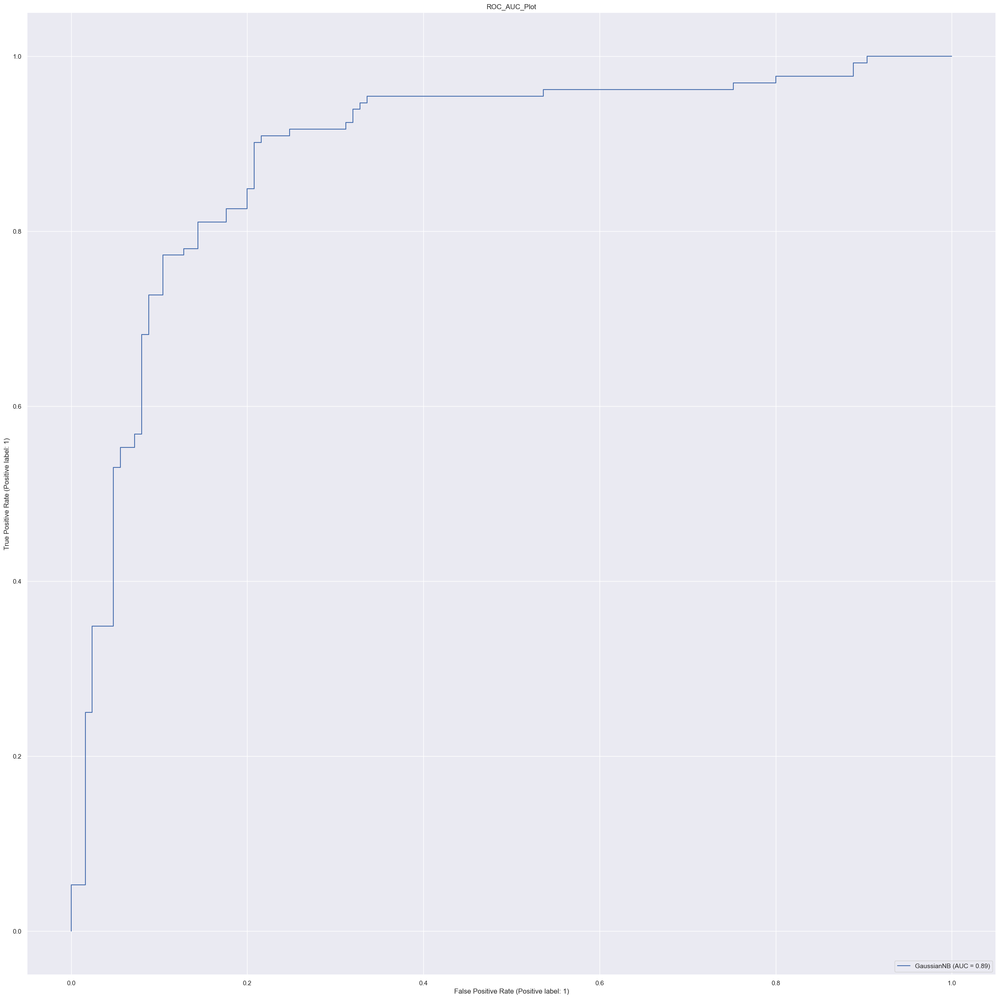

In [576]:
model(classifier_NB)

              precision    recall  f1-score   support

           0       0.82      0.82      0.82       125
           1       0.83      0.83      0.83       132

    accuracy                           0.82       257
   macro avg       0.82      0.82      0.82       257
weighted avg       0.82      0.82      0.82       257



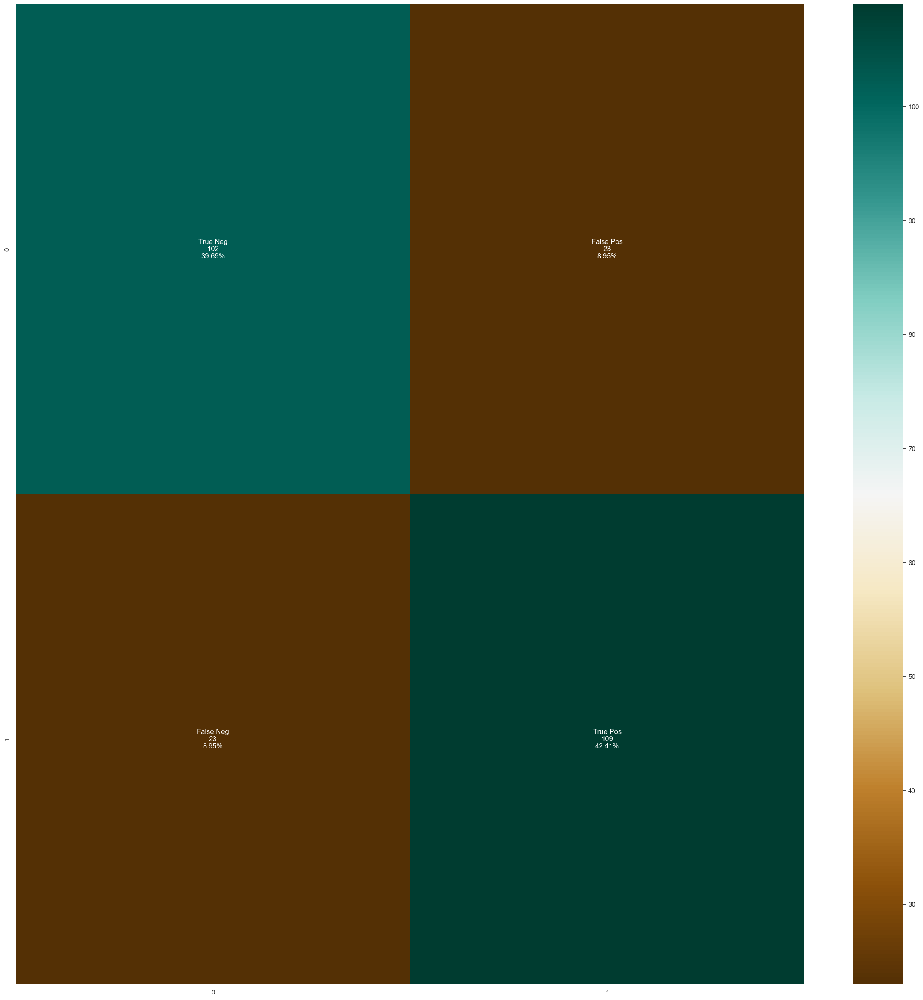

In [577]:
model_evaluation(classifier_NB)

# 6.Gradient Boosting and AdaBoost Classifier

In [99]:
gb = GradientBoostingClassifier(random_state = 1)
ab=AdaBoostClassifier()

In [68]:
from scipy.stats import uniform as sp_randFloat
from scipy.stats import randint as sp_randInt

In [69]:
parameters={'learning_rate': [0.1,0.5],
            'subsample':[0.1,0.3],
            'n_estimators':[1,100],
            'max_depth':[3,7],
            'min_samples_split':[50,100],
            'min_samples_leaf':[50,100]
           }

In [70]:
classifier_Gb=GridSearchCV(gb,param_grid=parameters,scoring='accuracy',cv=cv)

In [71]:
classifier_Gb.fit(XXtrain,YYtrain) 

GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=10, random_state=1),
             estimator=GradientBoostingClassifier(random_state=1),
             param_grid={'learning_rate': [0.1, 0.5], 'max_depth': [3, 7],
                         'min_samples_leaf': [50, 100],
                         'min_samples_split': [50, 100],
                         'n_estimators': [1, 100], 'subsample': [0.1, 0.3]},
             scoring='accuracy')

In [72]:
print(classifier_Gb.best_params_)

{'learning_rate': 0.5, 'max_depth': 3, 'min_samples_leaf': 50, 'min_samples_split': 50, 'n_estimators': 100, 'subsample': 0.3}


In [73]:
print(classifier_Gb.best_score_)

0.8680451127819548


In [74]:
##prediction
y_pred1=classifier_Gb.predict(XXtest)

In [75]:
score=accuracy_score(y_pred1,YYtest)
error=1-accuracy_score(y_pred1,YYtest)
print("accuracy is ",score)
print("error rate is",error)

accuracy is  0.9027237354085603
error rate is 0.09727626459143968


In [76]:
# imbalanced and via grid search
print(classification_report(y_pred1,YYtest))

              precision    recall  f1-score   support

           0       0.92      0.88      0.90       130
           1       0.89      0.92      0.90       127

    accuracy                           0.90       257
   macro avg       0.90      0.90      0.90       257
weighted avg       0.90      0.90      0.90       257



              precision    recall  f1-score   support

           0       0.88      0.92      0.90       125
           1       0.92      0.89      0.90       132

    accuracy                           0.90       257
   macro avg       0.90      0.90      0.90       257
weighted avg       0.90      0.90      0.90       257



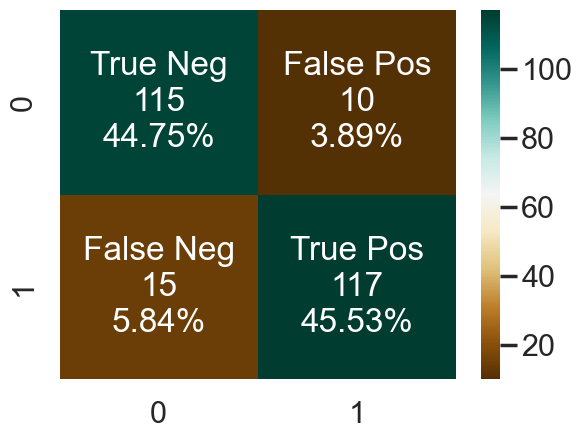

In [77]:
model_evaluation(classifier_Gb)

In [79]:
model(classifier_Gb)

KeyboardInterrupt: 

Accuracy :  94.94%
Cross Validation Score :  98.12%
ROC_AUC Score :  94.91%


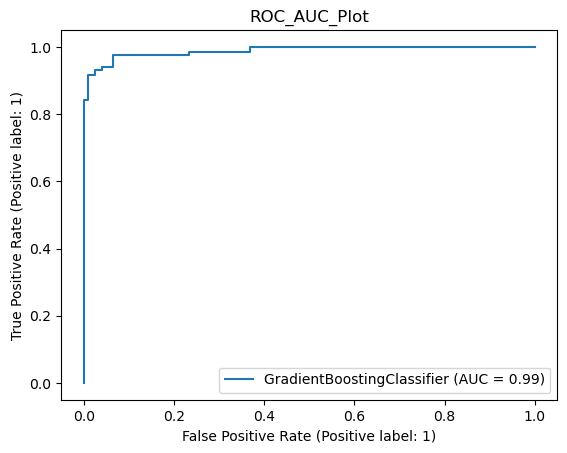

In [100]:
model(gb)

In [ ]:
model(ab)

              precision    recall  f1-score   support

           0       0.96      0.94      0.95       125
           1       0.94      0.96      0.95       132

    accuracy                           0.95       257
   macro avg       0.95      0.95      0.95       257
weighted avg       0.95      0.95      0.95       257



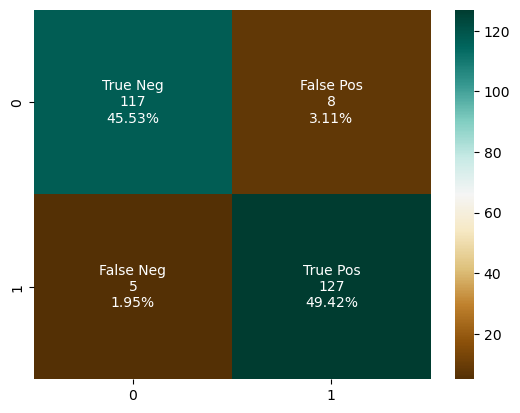

In [101]:
model_evaluation(gb)

In [ ]:
model_evaluation(ab)